# Customer Retention Project

## Prelude: 
In modern times, e-retailers are emerging business. In these types of business there are vendors or product suppliers and end user customers. E-retailers acts as a bridge between them. Providing ease, convenience and flexibility to both the parties, 
e-retailers are gaining importance.
In the given dataset we are provided with the knowledge of factors influencing a shopper to induce in brand loyalty of an 
e-retailer.


## Problem Statement:
We have to build a classification model to predict whether a customer do repeat purchase.

In [1]:
# Importing necessary packages

# Importing fundamental packages
import warnings
warnings.filterwarnings("ignore")
from IPython.core.interactiveshell import InteractiveShell        ## To display multiple outputs
InteractiveShell.ast_node_interactivity = "all"
import pyforest            

## For visualization
import matplotlib.pyplot as plt                                         
%matplotlib inline
import matplotlib.patches as patches

import seaborn as sns

from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px

## Data Pre-Processing Packages
from scipy.stats import chi2_contingency as ss
from sklearn import metrics
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler
from scipy.stats import zscore
from imblearn.over_sampling import RandomOverSampler
from imblearn.over_sampling import SMOTE
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.impute import KNNImputer
from sklearn.datasets import make_blobs
from sklearn.cluster import DBSCAN
from collections import Counter
from sklearn.cluster import KMeans
from sklearn.cluster import MiniBatchKMeans
from sklearn.preprocessing import PowerTransformer
from sklearn.model_selection import KFold
from sklearn.feature_selection import RFE
from sklearn.preprocessing import scale

## To create copy of data
import copy

## Pipeline Packages

from sklearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline


## Ensemble Learning Algorithms Packages

from sklearn.ensemble import RandomForestClassifier
from sklearn import tree
import xgboost as xgb
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import loguniform
from sklearn.linear_model import Ridge

## Evaluation Metrics Packages
import statsmodels.api as sm
from scipy.stats import f
from statsmodels.formula.api import ols
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.utils import resample
from sklearn import metrics
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn import preprocessing
from sklearn.metrics import average_precision_score, confusion_matrix, accuracy_score, classification_report, plot_confusion_matrix
from sklearn.metrics import roc_curve, auc

# Bagging and Boosting
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import AdaBoostClassifier                           

# Saving the model
import pickle

In [2]:
def read(link):
    global data

    data=pd.read_excel(link)
    
    data=pd.DataFrame(data)
    print(data)

In [3]:
read(link="customer_retention_dataset.xlsx")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

    1Gender of respondent 2 How old are you?   \
0                    Male         31-40 years   
1                  Female         21-30 years   
2                  Female         21-30 years   
3                    Male         21-30 years   
4                  Female         21-30 years   
..                    ...                 ...   
264                Female         21-30 years   
265                Female         31-40 years   
266                Female         41-50 yaers   
267                Female  Less than 20 years   
268                Female         41-50 yaers   

    3 Which city do you shop online from?  \
0                                   Delhi   
1                                   Delhi   
2                           Greater Noida   
3                                 Karnal    
4                              Bangalore    
..                                    ...   
264                                 Solan   
265                             Ghaziabad   
266   

In [4]:
pd.set_option("display.max_rows",None)               # To display all rows
pd.set_option("display.max_columns",None)            # To display all columns

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Exploratory Data Analysis (EDA)

In [5]:
# Understanding the fundamentals of the given data set

def eda1(mydata):                                    # Defining function
    
   
    
    print("The first 10 rows:", "\n",mydata.head(10))                              # to display first 10 records
    print("\n")                               
    print("The last 10 rows:", "\n",mydata.tail(10))                              # to display last 10 records
    print("\n")
    print("\n")
    
    print("The constitution of the given data:","\n", data.info())                 # to understand attributes of the data
    
    print("\n")
    print("\n")
    print("Skewness for the data","\n",mydata.skew())       # to get skewness of the data, skewness=0 for normal distribution
    print("\n")
    print("Kurosis for the data","\n",mydata.kurtosis() )            # to get kutosis, kurtosis <=3 for normal distribution
    print("\n")
    print("\n")
    

In [6]:
eda1(mydata=data)

The first 10 rows: 
   1Gender of respondent 2 How old are you?   \
0                  Male         31-40 years   
1                Female         21-30 years   
2                Female         21-30 years   
3                  Male         21-30 years   
4                Female         21-30 years   
5                Female         31-40 years   
6                  Male         41-50 yaers   
7                  Male         41-50 yaers   
8                Female  Less than 20 years   
9                Female         31-40 years   

  3 Which city do you shop online from?  \
0                                 Delhi   
1                                 Delhi   
2                         Greater Noida   
3                               Karnal    
4                            Bangalore    
5                                 Noida   
6                                 Delhi   
7                                 Delhi   
8                                 Solan   
9                              

- The schema of the dataset is 71 columns and 269 rows

- There are no missing values

- Except the "Pincode" column all the columns are of object type

#### Removing duplicate data

In [7]:
#Grouping "6 How many times you have made an online purchase in the past 1 year?" column
data["6 How many times you have made an online purchase in the past 1 year?"].replace("42 times and above","41 times and above",inplace=True)

#Grouping "7 How do you access the internet while shopping on-line?" column
data["7 How do you access the internet while shopping on-line?"].replace("Mobile internet","Mobile Internet",inplace=True)

#Grouping "16 How frequently do you abandon (selecting an items and leaving without making payment) your shopping cart?\t\t\t\t\t\t\t" column
data["16 How frequently do you abandon (selecting an items and leaving without making payment) your shopping cart?\t\t\t\t\t\t\t                                                   "].replace("Very frequently","Frequently",inplace=True)

#Grouping "18 The content on the website must be easy to read and understand" column
data["18 The content on the website must be easy to read and understand"].replace("Strongly agree (5)","Agree (4)",inplace=True)

#Grouping "19 Information on similar product to the one highlighted  is important for product comparison" column
data["19 Information on similar product to the one highlighted  is important for product comparison"].replace("Strongly agree (5)","Agree (4)",inplace=True)

#Grouping "20 Complete information on listed seller and product being offered is important for purchase decision." column
data["20 Complete information on listed seller and product being offered is important for purchase decision."].replace("Strongly agree (5)","Agree (4)",inplace=True)

data["20 Complete information on listed seller and product being offered is important for purchase decision."].replace("Strongly disagree (1)","Dis-agree (2)",inplace=True)

#Grouping "21 All relevant information on listed products must be stated clearly" column
data["21 All relevant information on listed products must be stated clearly"].replace("Strongly agree (5)","Agree (4)",inplace=True)

data["21 All relevant information on listed products must be stated clearly"].replace("Strongly disagree (1)","Dis-agree (2)",inplace=True)

#Grouping "22 Ease of navigation in website" column
data["22 Ease of navigation in website"].replace("Strongly agree (5)","Agree (4)",inplace=True)

data["22 Ease of navigation in website"].replace("Strongly disagree (1)","Dis-agree (2)",inplace=True)

#Grouping "23 Loading and processing speed" column
data["23 Loading and processing speed"].replace("Strongly agree (5)","Agree (4)",inplace=True)

data["23 Loading and processing speed"].replace("Strongly disagree (1)","Dis-agree (2)",inplace=True)

#Grouping "24 User friendly Interface of the website" column
data["24 User friendly Interface of the website"].replace("Strongly agree (5)","Agree (4)",inplace=True)

data["24 User friendly Interface of the website"].replace("Strongly disagree (1)","Dis-agree (2)",inplace=True)

#Grouping "25 Convenient Payment methods" column
data["25 Convenient Payment methods"].replace("Strongly agree (5)","Agree (4)",inplace=True)

#Grouping "26 Trust that the online retail store will fulfill its part of the transaction at the stipulated time" column
data["26 Trust that the online retail store will fulfill its part of the transaction at the stipulated time"].replace("Strongly agree (5)","Agree (4)",inplace=True)

#Grouping "27 Empathy (readiness to assist with queries) towards the customers" column
data["27 Empathy (readiness to assist with queries) towards the customers"].replace("Strongly agree (5)","Agree (4)",inplace=True)

#Grouping "28 Being able to guarantee the privacy of the customer" column
data["28 Being able to guarantee the privacy of the customer"].replace("Strongly agree (5)","Agree (4)",inplace=True)

#Grouping "29 Responsiveness, availability of several communication channels (email, online rep, twitter, phone etc.)" column
data["29 Responsiveness, availability of several communication channels (email, online rep, twitter, phone etc.)"].replace("Strongly agree (5)","Agree (4)",inplace=True)

#Grouping "30 Online shopping gives monetary benefit and discounts" column
data["30 Online shopping gives monetary benefit and discounts"].replace("Strongly agree (5)","Agree (4)",inplace=True)

data["30 Online shopping gives monetary benefit and discounts"].replace("Strongly disagree (1)","Dis-agree (2)",inplace=True)

#Grouping "31 Enjoyment is derived from shopping online" column
data["31 Enjoyment is derived from shopping online"].replace("Strongly agree (5)","Agree (4)",inplace=True)

data["31 Enjoyment is derived from shopping online"].replace("Strongly disagree (1)","Dis-agree (2)",inplace=True)

#Grouping "32 Shopping online is convenient and flexible" column
data["32 Shopping online is convenient and flexible"].replace("Strongly agree (5)","Agree (4)",inplace=True)

#Grouping "33 Return and replacement policy of the e-tailer is important for purchase decision" column
data["33 Return and replacement policy of the e-tailer is important for purchase decision"].replace("Strongly agree (5)","Agree (4)",inplace=True)

#Grouping "34 Gaining access to loyalty programs is a benefit of shopping online" column
data["34 Gaining access to loyalty programs is a benefit of shopping online"].replace("Strongly agree (5)","Agree (4)",inplace=True)

data["34 Gaining access to loyalty programs is a benefit of shopping online"].replace("Strongly disagree (1)","Dis-agree (2)",inplace=True)

#Grouping "35 Displaying quality Information on the website improves satisfaction of customers" column
data["35 Displaying quality Information on the website improves satisfaction of customers"].replace("Strongly agree (5)","Agree (4)",inplace=True)

#Grouping "36 User derive satisfaction while shopping on a good quality website or application" column
data["36 User derive satisfaction while shopping on a good quality website or application"].replace("Strongly agree (5)","Agree (4)",inplace=True)

#Grouping "37 Net Benefit derived from shopping online can lead to users satisfaction" column
data["37 Net Benefit derived from shopping online can lead to users satisfaction"].replace("Strongly agree (5)","Agree (4)",inplace=True)

#Grouping "38 User satisfaction cannot exist without trust" column
data["38 User satisfaction cannot exist without trust"].replace("Strongly agree (5)","Agree (4)",inplace=True)

data["38 User satisfaction cannot exist without trust"].replace("Strongly disagree (1)","Dis-agree (2)",inplace=True)

#Grouping "39 Offering a wide variety of listed product in several category" column
data["39 Offering a wide variety of listed product in several category"].replace("Strongly agree (5)","Agree (4)",inplace=True)

#Grouping "40 Provision of complete and relevant product information" column
data["40 Provision of complete and relevant product information"].replace("Strongly agree (5)","Agree (4)",inplace=True)

#Grouping "41 Monetary savings" column
data["41 Monetary savings"].replace("Strongly agree (5)","Agree (4)",inplace=True)

#Grouping "42 The Convenience of patronizing the online retailer" column
data["42 The Convenience of patronizing the online retailer"].replace("Strongly agree (5)","Agree (4)",inplace=True)

#Grouping "43 Shopping on the website gives you the sense of adventure" column
data["43 Shopping on the website gives you the sense of adventure"].replace("Strongly agree (5)","Agree (4)",inplace=True)

data["43 Shopping on the website gives you the sense of adventure"].replace("Strongly disagree (1)","Dis-agree (2)",inplace=True)

#Grouping "44 Shopping on your preferred e-tailer enhances your social status" column
data["44 Shopping on your preferred e-tailer enhances your social status"].replace("Strongly agree (5)","Agree (4)",inplace=True)

data["44 Shopping on your preferred e-tailer enhances your social status"].replace("Strongly disagree (1)","Dis-agree (2)",inplace=True)

#Grouping "45 You feel gratification shopping on your favorite e-tailer" column
data["45 You feel gratification shopping on your favorite e-tailer"].replace("Strongly agree (5)","Agree (4)",inplace=True)

data["45 You feel gratification shopping on your favorite e-tailer"].replace("Strongly disagree (1)","Disagree (2)",inplace=True)

data["45 You feel gratification shopping on your favorite e-tailer"].replace("Dis-agree (2)","Disagree (2)",inplace=True)

#Grouping "46 Shopping on the website helps you fulfill certain roles" column
data["46 Shopping on the website helps you fulfill certain roles"].replace("Strongly agree (5)","Agree (4)",inplace=True)

data["46 Shopping on the website helps you fulfill certain roles"].replace("Strongly disagree (1)","Dis-agree (2)",inplace=True)

#Grouping "47 Getting value for money spent" column
data["47 Getting value for money spent"].replace("Strongly agree (5)","Agree (4)",inplace=True)

Renaming Columns

In [8]:
#Renaming column names
rename_columns = ['Gender','Age','Shopping_City','PinCode','Shopping_Since','Shopping_Frequency','Internet_Access','Device_Used',
           'Screen_Size','Operating_System', 'Browser_Used','Channel_FirstUsed','Login_Mode','TimeSpent_ForPurchase','Payment_Mode','Abandon_Frequency',
          'Abandon_Reason','Content_Readability','Similar_ProductInfo','Seller_ProductInfo','ProductInfo_Clarity','Ease_Navigation',
          'Loading_ProcessingSpeed','UserFriendly_Interface','Conveninet_PaymentMode','TimelyFulfilment_Trust','Customer_Empathy',
          'CustPrivacy_Guarantee','VariousChannel_Responses','Benefit_Discount','Enjoy_OnlineShopping','Convenience_Flexibility','Returns_ReplacementPolicy','Loyalty_ProgramAccess',
          'QualityInfo_Satisfaction','WebsiteQuality_Satisfaction','NetBenefit_Satisfaction','User_Trust','Product_SeveralCategory','Relevant_ProductInfo','Monetary_Savings',
          'Patronizing_Convenience','Adventure_Sense','Enhances_SocialStatus','Gratification_Shopping','Role_Fulfilment','Money_Worthy','Shopped_From','Easy_WebApp',
           'Visually_AppealingWebApp','Product_Variety','Complete_ProductInfo','Fast_WebApp','Reliable_WebApp','Quick_Purchase','PaymentOptions_Availability',
           'Fast_Delivery','CustInfo_Privacy','FinancialInfo_Security','Perceived_Trustworthiness','MultiChannel_Assistance','Long_LoginTime','LongPhoto_DisplayTime',
           'LatePrice_Declare','Long_LoadingTime','Limited_PaymentMode','Late_Delivery','ChangeWebApp_Design','Page_Disruption','WebApp_Efficiency',
           'Recommendation']

data.columns = rename_columns

#### Encoding Variables

In [9]:
def convert1(val):
    if val == str("Bangalore"):                           # Bangalore
        return 0  
    elif val == str("Bulandshahr"):                        #Bulandshahr
        return 1
    
    elif val == str("Delhi"):                              # Delhi
        return 2
    
    elif val == str("Ghaziabad"):                           # Ghaziabad
        return 3
    
    elif val == str("Greater Noida"):                        # Greater Noida
        return 4
    
    elif val == str("Gurgaon "):                            # Gurgaon 
        return 5
    
    elif val == str("Karnal "):                              # Karnal 
        return 6
    
    elif val == str("Merrut"):                              # Merrut
        return 7
    
    elif val == str("Moradabad"):                            # Moradabad
        return 8
    
    elif val == str("Noida"):                           # Noida
        return 9
    
    else:
        return 10        #  Solan

In [10]:
# Encoding Shopping City
data['Shopping_City'] = data['Shopping_City'].apply(convert1)

In [11]:
def convert2(val):
    if val == str("Less than 20 years"):
        return 0        # Below 20 years
    
    elif  val == str("21-30 years"):
        return 1        # 21 - 30 years 
    
    elif  val == str("31-40 years"):
        return 2        # 31 - 40 years
    
    elif  val == str("31-40 years"):
        return 3        # 41 - 50 years 
    
    else:
        return 4        # 51 and above

In [12]:
data['Age'] = data['Age'].apply(convert2)

In [13]:
def convert3(val):
    if val == str("Less than 1 year") :
        return 0        # Less Than 1 year
    
    elif  val == str("1-2 years"):
        return 1        # 1-2 years 
    
    elif  val == str("2-3 years"):
        return 2        # 2-3 years
    
    elif  val == str("3-4 years"):
        return 3        # 3-4 years 
    
    else:
        return 4        # 4 years and above

In [14]:
data['Shopping_Since'] = data['Shopping_Since'].apply(convert2)

In [15]:
def convert3(val):
    if val == str("Less than 10 times") :
        return 0        # Less Than 10 times
    
    elif  val == str("11-20 times"):
        return 1        # 11-20 times 
    
    elif  val == str("21-30 times"):
        return 2        # 21-30 times
    
    elif  val == str("31-40 times"):
        return 3        # 31-40 times 
    
    else:
        return 4        # 41 times and above

In [16]:
data['Shopping_Frequency'] = data['Shopping_Frequency'].apply(convert3)

In [17]:
def convert4(val):
    if val == str("Less than 1 min") :
        return 0        # Less Than 1 minute
    
    elif  val == str("1-5 mins"):
        return 1        # 1-5 minutes 
    
    elif  val == str("6-10 mins"):
        return 2        # 6-10 minutes
    
    elif  val == str("11-15 mins"):
        return 3        # 11-15 minutes 
    
    else:
        return 4        # above 15 minutes

In [18]:
data['TimeSpent_ForPurchase'] = data['TimeSpent_ForPurchase'].apply(convert4)

In [19]:
def convert5(val):
    if val == str("Agree (4)") :
        return 0        # agree
    
    elif  val == str("Strongly agree (5)"):
        return 0        # agree 
    
    elif  val == str("Strongly disagree (1)"):
        return 1        # disagree
    
    elif  val == str("Dis-agree (2)"):
        return 1        # disagree
    
    elif  val == str("Disagree (2)"):
        return 1        # disagree
    
    else:
        return 2        # indifferent

In [20]:
data['ProductInfo_Clarity'] = data['ProductInfo_Clarity'].apply(convert5)
data['Ease_Navigation'] = data['Ease_Navigation'].apply(convert5)
data['Conveninet_PaymentMode'] = data['Conveninet_PaymentMode'].apply(convert5)
data['Customer_Empathy'] = data['Customer_Empathy'].apply(convert5)
data['CustPrivacy_Guarantee'] = data['CustPrivacy_Guarantee'].apply(convert5)
data['VariousChannel_Responses'] = data['VariousChannel_Responses'].apply(convert5)
data['Benefit_Discount'] = data['Benefit_Discount'].apply(convert5)
data['Enjoy_OnlineShopping'] = data['Enjoy_OnlineShopping'].apply(convert5)
data['Convenience_Flexibility'] = data['Convenience_Flexibility'].apply(convert5)
data['Returns_ReplacementPolicy'] = data['Returns_ReplacementPolicy'].apply(convert5)
data['Loyalty_ProgramAccess'] = data['Loyalty_ProgramAccess'].apply(convert5)
data['QualityInfo_Satisfaction'] = data['QualityInfo_Satisfaction'].apply(convert5)
data['WebsiteQuality_Satisfaction'] = data['WebsiteQuality_Satisfaction'].apply(convert5)
data['NetBenefit_Satisfaction'] = data['NetBenefit_Satisfaction'].apply(convert5)
data['User_Trust'] = data['User_Trust'].apply(convert5)
data['Product_SeveralCategory'] = data['Product_SeveralCategory'].apply(convert5)
data['Relevant_ProductInfo'] = data['Relevant_ProductInfo'].apply(convert5)
data['Monetary_Savings'] = data['Monetary_Savings'].apply(convert5)
data['Patronizing_Convenience'] = data['Patronizing_Convenience'].apply(convert5)
data['Adventure_Sense'] = data['Adventure_Sense'].apply(convert5)
data['Enhances_SocialStatus'] = data['Enhances_SocialStatus'].apply(convert5)
data['Gratification_Shopping'] = data['Gratification_Shopping'].apply(convert5)
data['Role_Fulfilment'] = data['Role_Fulfilment'].apply(convert5)
data['Money_Worthy'] = data['Money_Worthy'].apply(convert5)

In [21]:
def convert6(val):
    if val == str("Agree (4)") :
        return 0        # agree
    
    elif  val == str("Dis-agree (2)"):
        return 1        # disagree
    
    elif  val == str("Disagree (2)"):
        return 1        # disagree
    
    else:
        return 2        # indifferent

In [22]:
data['TimelyFulfilment_Trust'] = data['TimelyFulfilment_Trust'].apply(convert6)
data['Similar_ProductInfo'] = data['Similar_ProductInfo'].apply(convert6)
data['Loading_ProcessingSpeed'] = data['Loading_ProcessingSpeed'].apply(convert6)
data['Seller_ProductInfo'] = data['Seller_ProductInfo'].apply(convert6)
data['UserFriendly_Interface'] = data['UserFriendly_Interface'].apply(convert6)

In [23]:
def convert7(val):
    if val == str("Agree (4)") :
        return 0        # agree
    
    elif  val == str("Strongly disagree (1)"):
        return 1        # disagree
            
    else:
        return 2        # indifferent

In [24]:
data['Content_Readability'] = data['Content_Readability'].apply(convert7)

In [25]:
data_cat = pd.DataFrame()
data_num = pd.DataFrame()
for i in data.columns:
    if data[i].dtype == "O":
        data_cat[i] = data[i]
    else:
        data_num[i] = data[i]
        


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [26]:
#Lets check the value count of each column to see if there are any unexpected and unwanted entries present in the column.
for i in data_cat.columns:
        print(data_cat[i].value_counts())
        print('\n','XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX','\n')

Female    181
Male       88
Name: Gender, dtype: int64

 XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX 

Mobile Internet    189
Wi-Fi               76
Dial-up              4
Name: Internet_Access, dtype: int64

 XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX 

Smartphone    141
Laptop         86
Desktop        30
Tablet         12
Name: Device_Used, dtype: int64

 XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX 

Others        134
5.5 inches     99
4.7 inches     29
5 inches        7
Name: Screen_Size, dtype: int64

 XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX 

Window/windows Mobile    122
Android                   85
IOS/Mac                   62
Name: Operating_System, dtype: int64

 XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX 

Google chrome      216
Safari              40
Opera                8
Mozilla Firefox      5
Name: Browser_Used, dtype: int64

 XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX 

Search Engine        230
Content Marketing     20
Display Adverts       19
Name: Channel_FirstUsed, dtype: int64


In [27]:
# Encoding Attrition
enc = LabelEncoder()
for i in data_cat:
    data_cat[i] = enc.fit_transform(data_cat[i])

In [28]:
#Lets check the value count of each column to see if there are any unexpected and unwanted entries present in the column.
for i in data_cat.columns:
        print(data_cat[i].value_counts())
        print('\n','XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX','\n')

0    181
1     88
Name: Gender, dtype: int64

 XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX 

1    189
2     76
0      4
Name: Internet_Access, dtype: int64

 XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX 

2    141
1     86
0     30
3     12
Name: Device_Used, dtype: int64

 XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX 

3    134
2     99
0     29
1      7
Name: Screen_Size, dtype: int64

 XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX 

2    122
0     85
1     62
Name: Operating_System, dtype: int64

 XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX 

0    216
3     40
2      8
1      5
Name: Browser_Used, dtype: int64

 XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX 

2    230
0     20
1     19
Name: Channel_FirstUsed, dtype: int64

 XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX 

2    87
4    86
0    70
1    18
3     8
Name: Login_Mode, dtype: int64

 XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX 

1    148
0     76
2     45
Name: Payment_Mode, dtype: int64

 XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX 

2    171
0     50
1   

In [29]:
new_data=pd.concat([data_cat,data_num],axis=1)

<IPython.core.display.Javascript object>

In [30]:
new_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 269 entries, 0 to 268
Data columns (total 71 columns):
 #   Column                       Non-Null Count  Dtype
---  ------                       --------------  -----
 0   Gender                       269 non-null    int32
 1   Internet_Access              269 non-null    int32
 2   Device_Used                  269 non-null    int32
 3   Screen_Size                  269 non-null    int32
 4   Operating_System             269 non-null    int32
 5   Browser_Used                 269 non-null    int32
 6   Channel_FirstUsed            269 non-null    int32
 7   Login_Mode                   269 non-null    int32
 8   Payment_Mode                 269 non-null    int32
 9   Abandon_Frequency            269 non-null    int32
 10  Abandon_Reason               269 non-null    int32
 11  Shopped_From                 269 non-null    int32
 12  Easy_WebApp                  269 non-null    int32
 13  Visually_AppealingWebApp     269 non-null    int32

In [31]:
new_data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Gender,269.0,0.327138,0.470042,0.0,0.0,0.0,1.0,1.0
Internet_Access,269.0,1.267658,0.476025,0.0,1.0,1.0,2.0,2.0
Device_Used,269.0,1.501859,0.751240,0.0,1.0,2.0,2.0,3.0
Screen_Size,269.0,2.256506,0.944942,0.0,2.0,2.0,3.0,3.0
Operating_System,269.0,1.137546,0.867985,0.0,0.0,1.0,2.0,2.0
Browser_Used,269.0,0.524164,1.097985,0.0,0.0,0.0,0.0,3.0
Channel_FirstUsed,269.0,1.780669,0.566672,0.0,2.0,2.0,2.0,2.0
Login_Mode,269.0,2.081784,1.555204,0.0,0.0,2.0,4.0,4.0
Payment_Mode,269.0,0.884758,0.661938,0.0,0.0,1.0,1.0,2.0
Abandon_Frequency,269.0,1.449814,0.788378,0.0,1.0,2.0,2.0,2.0


In [32]:
new_data.groupby(["Age","Gender"]).sum()

Internet_Access  Device_Used  Screen_Size  Operating_System  \
Age Gender                                                                
0   0                    25           26           24                 9   
    1                     7           14            8                 4   
1   0                    76           96          113                58   
    1                    20           36           47                21   
2   0                    72           73          127                64   
    1                    27           34           74                47   
4   0                    77           71          141                77   
    1                    37           54           73                26   

            Browser_Used  Channel_FirstUsed  Login_Mode  Payment_Mode  \
Age Gender                                                              
0   0                  3                 24          20             1   
    1                  3                 14          26            10   
1   0                 52                 95         146            49   
    1                 24                 31          20            17   
2   0                 24                 94         134            47   
    1                 14                 54          59            31   
4   0                  6                115         114            57   
    1                 15                 52          41            26   

            Abandon_Frequency  Abandon_Reason  Shopped_From  Easy_WebApp  \
Age Gender                                                                 
0   0                      20              24            32           32   
    1                       7              24            34           34   
1   0                      79              83           207          193   
    1                      33              13            83           61   
2   0                      76              39           176          189   
    1                      48              33           130          136   
4   0                      79              76           246          189   
    1                      48              65           112          100   

            Visually_AppealingWebApp  Product_Variety  Complete_ProductInfo  \
Age Gender                                                                    
0   0                             25               55                    33   
    1                             36               31                    28   
1   0                            219              148                   160   
    1                             47               17                    42   
2   0                            124               93                   146   
    1                            109               96                   128   
4   0                            163              103                   158   
    1                             78               45                   113   

            Fast_WebApp  Reliable_WebApp  Quick_Purchase  \
Age Gender                                                 
0   0                24               50              84   
    1                33               45              24   
1   0               191              186             147   
    1                91               43              35   
2   0               169              149             163   
    1               149              144             127   
4   0               225              159             120   
    1               130               95              86   

            PaymentOptions_Availability  Fast_Delivery  CustInfo_Privacy  \
Age Gender                                                                 
0   0                                68             56                63   
    1                                38              6                29   
1   0                               210             62               185 

In [33]:
new_data.groupby(["Age","Gender"]).describe().transpose()

Age                                            0                 \
Gender                                         0              1   
Internet_Access             count      13.000000       7.000000   
                            mean        1.923077       1.000000   
                            std         0.277350       0.000000   
                            min         1.000000       1.000000   
                            25%         2.000000       1.000000   
                            50%         2.000000       1.000000   
                            75%         2.000000       1.000000   
                            max         2.000000       1.000000   
Device_Used                 count      13.000000       7.000000   
                            mean        2.000000       2.000000   
                            std         0.000000       0.000000   
                            min         2.000000       2.000000   
                            25%         2.000000       2.000000   
                            50%         2.000000       2.000000   
                            75%         2.000000       2.000000   
                            max         2.000000       2.000000   
Screen_Size                 count      13.000000       7.000000   
                            mean        1.846154       1.142857   
                            std         0.554700       1.069045   
                            min         0.000000       0.000000   
                            25%         2.000000       0.000000   
                            50%         2.000000       2.000000   
                            75%         2.000000       2.000000   
                            max         2.000000       2.000000   
Operating_System            count      13.000000       7.000000   
                            mean        0.692308       0.571429   
                            std         0.947331       0.534522   
                            min         0.000000       0.000000   
                            25%         0.000000       0.000000   
                            50%         0.000000       1.000000   
                            75%         2.000000       1.000000   
                            max         2.000000       1.000000   
Browser_Used                count      13.000000       7.000000   
                            mean        0.230769       0.428571   
                            std         0.832050       1.133893   
                            min         0.000000       0.000000   
                            25%         0.000000       0.000000   
                            50%         0.000000       0.000000   
                            75%         0.000000       0.000000   
                            max         3.000000       3.000000   
Channel_FirstUsed           count      13.000000       7.000000   
                            mean        1.846154       2.000000   
                            std         0.554700       0.000000   
                            min         0.000000       2.000000   
                            25%         2.000000       2.000000   
                            50%         2.000000       2.000000   
                            75%         2.000000       2.000000   
                            max         2.000000       2.000000   
Login_Mode                  count      13.000000       7.000000   
                            mean        1.538462       3.714286   
                            std         2.025479       0.755929   
                            min         0.000000       2.000000   
                            25%         0.000000       4.000000   
                            50%         0.000000       4.000000   
                            75%         4.000000       4.000000   
                            max         4.000000       4.000000   
Payment_Mode                count      13.000000       7.000000   
                            mean        0.07692

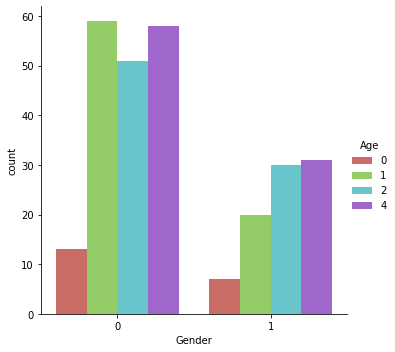

In [34]:
#Factor plot for Gender
sns.factorplot('Gender',kind='count',data=new_data,hue='Age',palette="hls")
plt.xticks(rotation=0);

In [35]:
new_data.groupby(["Age","Gender","Shopping_City"]).sum()

Internet_Access  Device_Used  Screen_Size  \
Age Gender Shopping_City                                              
0   0      3                            8            8            8   
           10                          17           18           16   
    1      2                            4            8            2   
           9                            3            6            6   
1   0      2                           14           11            9   
           4                           14           21           35   
           6                            9           13           19   
           7                            5           10            9   
           9                            2            2            0   
           10                          32           39           41   
    1      2                            5            5           15   
           3                            1            1            3   
           6                            7           14           14   
           9                            4           10           12   
           10                           3            6            3   
2   0      2                           17           10           30   
           3                           11           16           21   
           4                           24           24           44   
           6                            7           11            9   
           7                            1            0            3   
           9                            8            8            8   
           10                           4            4           12   
    1      1                            2            4            2   
           2                            5            9           21   
           5                            2            3            1   
           8                            5            5           15   
           9                           13           13           35   
4   0      2                            2            1            3   
           3                            5           10           10   
           4                           11           15           26   
           5                           22           15           29   
           6                            5            3           14   
           7                            3            0            9   
           9                           14            7           21   
           10                          15           20           29   
    1      2                           28           37           51   
           4                            1            3            2   
           9                            8           14           20   

                          Operating_System  Browser_Used  Channel_FirstUsed  \
Age Gender Shopping_City                                                      
0   0      3                             8             0                  8   
           10                            1             3                 16   
    1      2                             4             3                  8   
           9                             0             0                  6   
1   0      2                            10             0                 14   
           4                            14             0                 28   
           6                             6             0                 16   
           7                             5             9                 10   
           9                             1             3                  0   
           10                           22            40                 27   
    1      2                            10             0                 10   
           3                             2             0                  2   
           6                             7            21                 14   


In [36]:
new_data.groupby(["Age","Gender","Shopping_City"]).describe().transpose()

Age                                       0                            \
Gender                                    0                         1   
Shopping_City                            3              10         2    
Internet_Access             count       4.0       9.000000       4.00   
                            mean        2.0       1.888889       1.00   
                            std         0.0       0.333333       0.00   
                            min         2.0       1.000000       1.00   
                            25%         2.0       2.000000       1.00   
                            50%         2.0       2.000000       1.00   
                            75%         2.0       2.000000       1.00   
                            max         2.0       2.000000       1.00   
Device_Used                 count       4.0       9.000000       4.00   
                            mean        2.0       2.000000       2.00   
                            std         0.0       0.000000       0.00   
                            min         2.0       2.000000       2.00   
                            25%         2.0       2.000000       2.00   
                            50%         2.0       2.000000       2.00   
                            75%         2.0       2.000000       2.00   
                            max         2.0       2.000000       2.00   
Screen_Size                 count       4.0       9.000000       4.00   
                            mean        2.0       1.777778       0.50   
                            std         0.0       0.666667       1.00   
                            min         2.0       0.000000       0.00   
                            25%         2.0       2.000000       0.00   
                            50%         2.0       2.000000       0.00   
                            75%         2.0       2.000000       0.50   
                            max         2.0       2.000000       2.00   
Operating_System            count       4.0       9.000000       4.00   
                            mean        2.0       0.111111       1.00   
                            std         0.0       0.333333       0.00   
                            min         2.0       0.000000       1.00   
                            25%         2.0       0.000000       1.00   
                            50%         2.0       0.000000       1.00   
                            75%         2.0       0.000000       1.00   
                            max         2.0       1.000000       1.00   
Browser_Used                count       4.0       9.000000       4.00   
                            mean        0.0       0.333333       0.75   
                            std         0.0       1.000000       1.50   
                            min         0.0       0.000000       0.00   
                            25%         0.0       0.000000       0.00   
                            50%         0.0       0.000000       0.00   
                            75%         0.0       0.000000       0.75   
                            max         0.0       3.000000       3.00   
Channel_FirstUsed           count       4.0       9.000000       4.00   
                            mean        2.0       1.777778       2.00   
                            std         0.0       0.666667       0.00   
                            min         2.0       0.000000       2.00   
                            25%         2.0       2.000000       2.00   
                            50%         2.0       2.000000       2.00   
                            75%         2.0       2.000000       2.00   
                            max         2.0       2.000000       2.00   
Login_Mode                  count       4.0       9.000000       4.00   
                            mean        4.0       0.444444       3.50   
                            std         0.0       1.333333       1.00   
                            min         4.0       0.000000

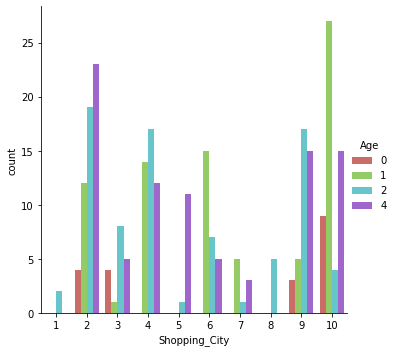

In [37]:
#Factor plot for Gender
sns.factorplot('Shopping_City',kind='count',data=new_data,hue='Age',palette="hls")
plt.xticks(rotation=0);

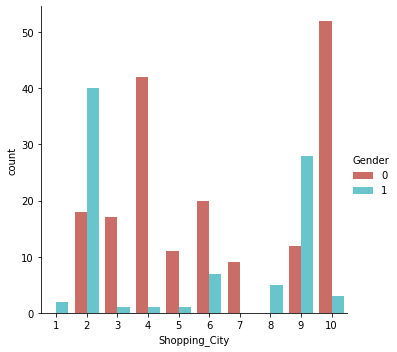

In [38]:
#Factor plot for Gender
sns.factorplot('Shopping_City',kind='count',data=new_data,hue='Gender',palette="hls")
plt.xticks(rotation=0);

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Gender', ylabel='count'>

Text(0.5, 1.0, 'Gender')

(array([0, 1]), [Text(0, 0, '0'), Text(1, 0, '1')])

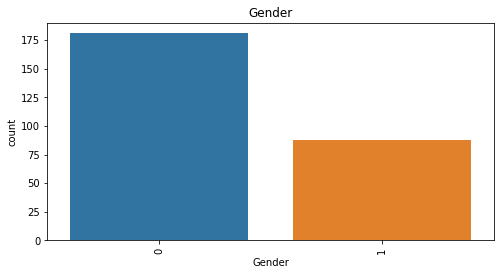

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Internet_Access', ylabel='count'>

Text(0.5, 1.0, 'Internet_Access')

(array([0, 1, 2]), [Text(0, 0, '0'), Text(1, 0, '1'), Text(2, 0, '2')])

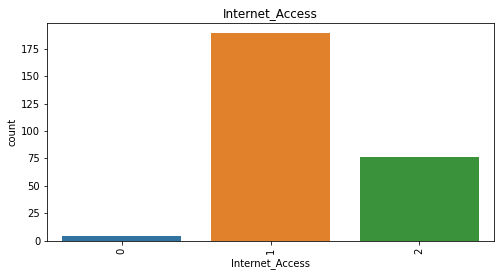

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Device_Used', ylabel='count'>

Text(0.5, 1.0, 'Device_Used')

(array([0, 1, 2, 3]),
 [Text(0, 0, '0'), Text(1, 0, '1'), Text(2, 0, '2'), Text(3, 0, '3')])

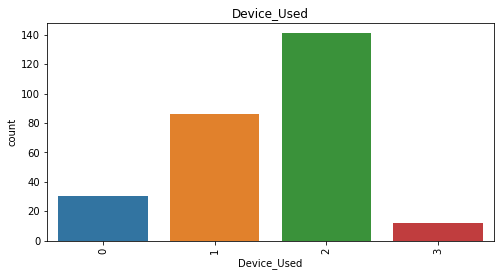

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Screen_Size', ylabel='count'>

Text(0.5, 1.0, 'Screen_Size')

(array([0, 1, 2, 3]),
 [Text(0, 0, '0'), Text(1, 0, '1'), Text(2, 0, '2'), Text(3, 0, '3')])

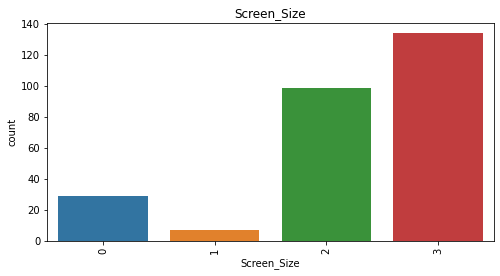

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Operating_System', ylabel='count'>

Text(0.5, 1.0, 'Operating_System')

(array([0, 1, 2]), [Text(0, 0, '0'), Text(1, 0, '1'), Text(2, 0, '2')])

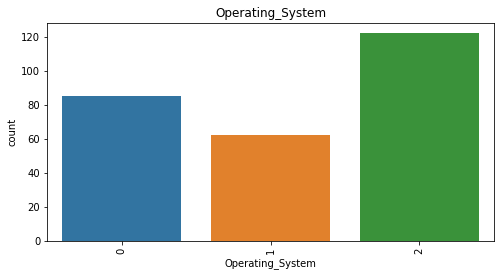

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Browser_Used', ylabel='count'>

Text(0.5, 1.0, 'Browser_Used')

(array([0, 1, 2, 3]),
 [Text(0, 0, '0'), Text(1, 0, '1'), Text(2, 0, '2'), Text(3, 0, '3')])

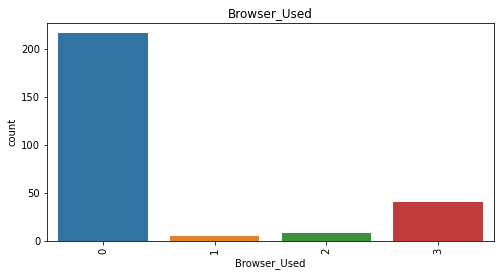

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Channel_FirstUsed', ylabel='count'>

Text(0.5, 1.0, 'Channel_FirstUsed')

(array([0, 1, 2]), [Text(0, 0, '0'), Text(1, 0, '1'), Text(2, 0, '2')])

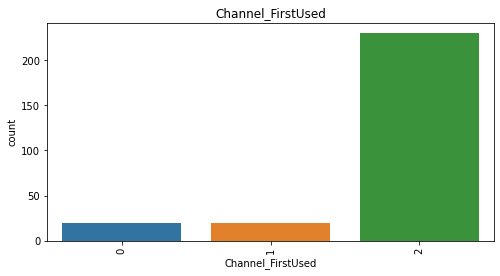

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Login_Mode', ylabel='count'>

Text(0.5, 1.0, 'Login_Mode')

(array([0, 1, 2, 3, 4]),
 [Text(0, 0, '0'),
  Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4')])

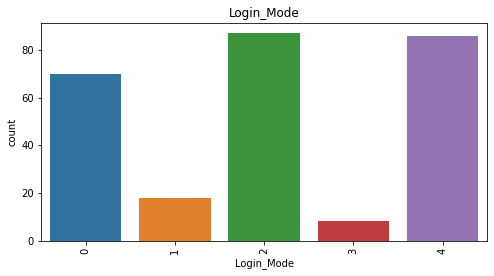

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Payment_Mode', ylabel='count'>

Text(0.5, 1.0, 'Payment_Mode')

(array([0, 1, 2]), [Text(0, 0, '0'), Text(1, 0, '1'), Text(2, 0, '2')])

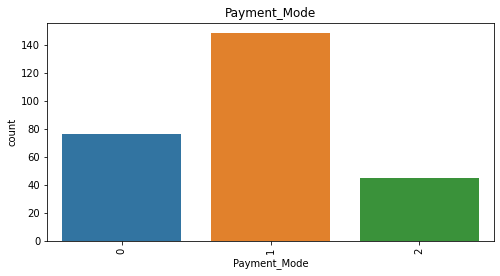

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Abandon_Frequency', ylabel='count'>

Text(0.5, 1.0, 'Abandon_Frequency')

(array([0, 1, 2]), [Text(0, 0, '0'), Text(1, 0, '1'), Text(2, 0, '2')])

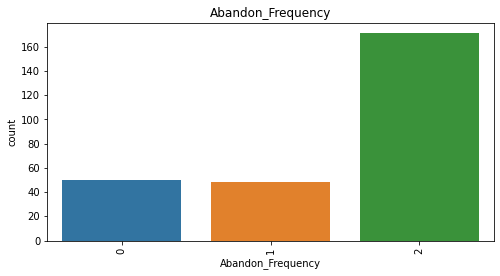

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Abandon_Reason', ylabel='count'>

Text(0.5, 1.0, 'Abandon_Reason')

(array([0, 1, 2, 3, 4]),
 [Text(0, 0, '0'),
  Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4')])

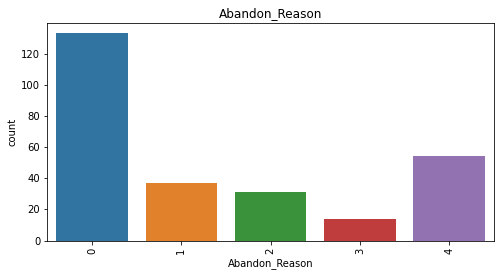

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Shopped_From', ylabel='count'>

Text(0.5, 1.0, 'Shopped_From')

(array([0, 1, 2, 3, 4, 5, 6, 7, 8]),
 [Text(0, 0, '0'),
  Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4'),
  Text(5, 0, '5'),
  Text(6, 0, '6'),
  Text(7, 0, '7'),
  Text(8, 0, '8')])

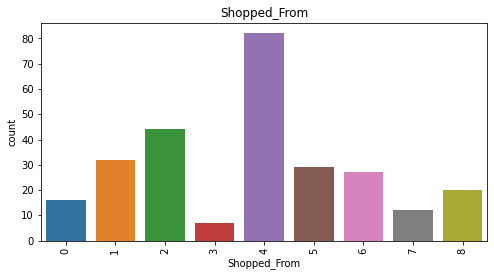

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Easy_WebApp', ylabel='count'>

Text(0.5, 1.0, 'Easy_WebApp')

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 [Text(0, 0, '0'),
  Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4'),
  Text(5, 0, '5'),
  Text(6, 0, '6'),
  Text(7, 0, '7'),
  Text(8, 0, '8'),
  Text(9, 0, '9')])

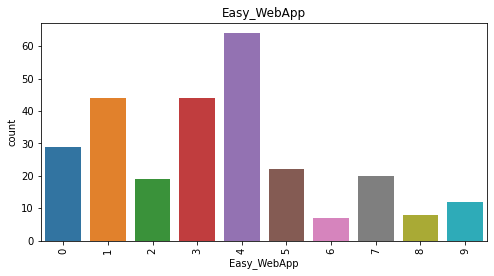

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Visually_AppealingWebApp', ylabel='count'>

Text(0.5, 1.0, 'Visually_AppealingWebApp')

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 [Text(0, 0, '0'),
  Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4'),
  Text(5, 0, '5'),
  Text(6, 0, '6'),
  Text(7, 0, '7'),
  Text(8, 0, '8'),
  Text(9, 0, '9')])

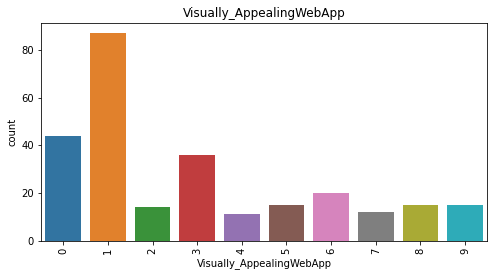

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Product_Variety', ylabel='count'>

Text(0.5, 1.0, 'Product_Variety')

(array([0, 1, 2, 3, 4, 5, 6, 7, 8]),
 [Text(0, 0, '0'),
  Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4'),
  Text(5, 0, '5'),
  Text(6, 0, '6'),
  Text(7, 0, '7'),
  Text(8, 0, '8')])

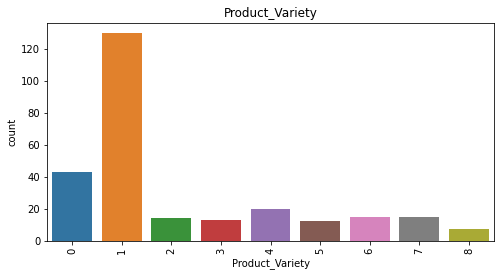

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Complete_ProductInfo', ylabel='count'>

Text(0.5, 1.0, 'Complete_ProductInfo')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 0, '0'),
  Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4'),
  Text(5, 0, '5'),
  Text(6, 0, '6'),
  Text(7, 0, '7'),
  Text(8, 0, '8'),
  Text(9, 0, '9'),
  Text(10, 0, '10')])

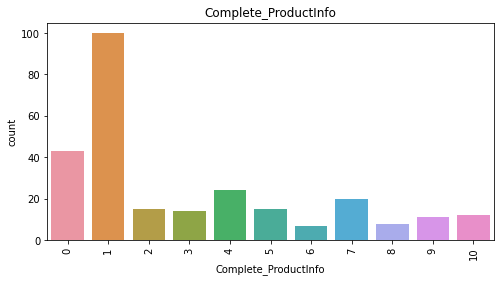

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Fast_WebApp', ylabel='count'>

Text(0.5, 1.0, 'Fast_WebApp')

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 [Text(0, 0, '0'),
  Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4'),
  Text(5, 0, '5'),
  Text(6, 0, '6'),
  Text(7, 0, '7'),
  Text(8, 0, '8'),
  Text(9, 0, '9')])

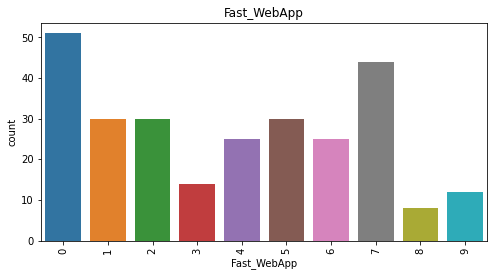

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Reliable_WebApp', ylabel='count'>

Text(0.5, 1.0, 'Reliable_WebApp')

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 [Text(0, 0, '0'),
  Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4'),
  Text(5, 0, '5'),
  Text(6, 0, '6'),
  Text(7, 0, '7'),
  Text(8, 0, '8'),
  Text(9, 0, '9')])

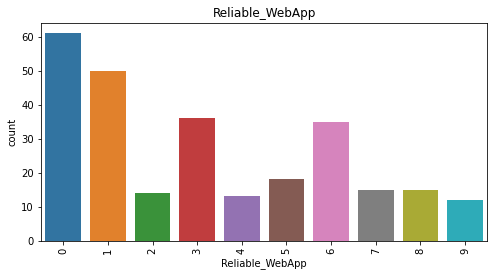

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Quick_Purchase', ylabel='count'>

Text(0.5, 1.0, 'Quick_Purchase')

(array([0, 1, 2, 3, 4, 5, 6, 7, 8]),
 [Text(0, 0, '0'),
  Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4'),
  Text(5, 0, '5'),
  Text(6, 0, '6'),
  Text(7, 0, '7'),
  Text(8, 0, '8')])

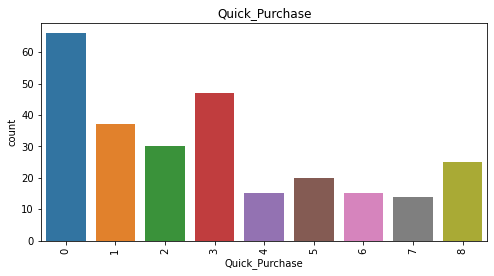

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='PaymentOptions_Availability', ylabel='count'>

Text(0.5, 1.0, 'PaymentOptions_Availability')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 0, '0'),
  Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4'),
  Text(5, 0, '5'),
  Text(6, 0, '6'),
  Text(7, 0, '7'),
  Text(8, 0, '8'),
  Text(9, 0, '9'),
  Text(10, 0, '10')])

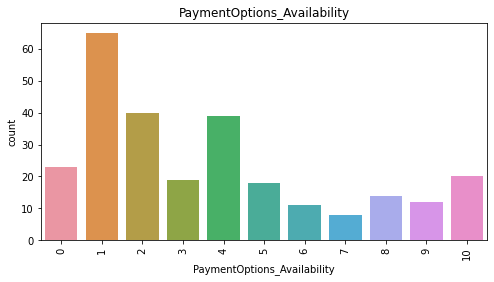

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Fast_Delivery', ylabel='count'>

Text(0.5, 1.0, 'Fast_Delivery')

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, '0'),
  Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4'),
  Text(5, 0, '5')])

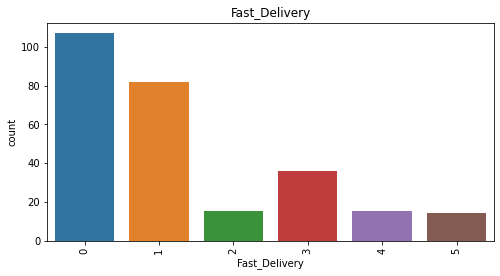

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='CustInfo_Privacy', ylabel='count'>

Text(0.5, 1.0, 'CustInfo_Privacy')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 0, '0'),
  Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4'),
  Text(5, 0, '5'),
  Text(6, 0, '6'),
  Text(7, 0, '7'),
  Text(8, 0, '8'),
  Text(9, 0, '9'),
  Text(10, 0, '10')])

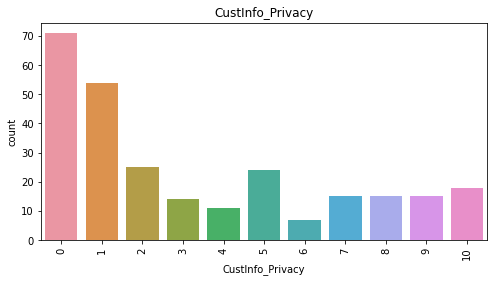

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='FinancialInfo_Security', ylabel='count'>

Text(0.5, 1.0, 'FinancialInfo_Security')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 0, '0'),
  Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4'),
  Text(5, 0, '5'),
  Text(6, 0, '6'),
  Text(7, 0, '7'),
  Text(8, 0, '8'),
  Text(9, 0, '9'),
  Text(10, 0, '10')])

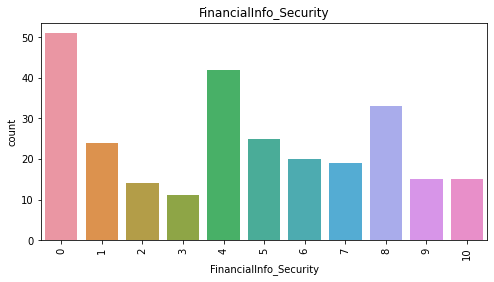

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Perceived_Trustworthiness', ylabel='count'>

Text(0.5, 1.0, 'Perceived_Trustworthiness')

(array([0, 1, 2, 3, 4, 5, 6, 7, 8]),
 [Text(0, 0, '0'),
  Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4'),
  Text(5, 0, '5'),
  Text(6, 0, '6'),
  Text(7, 0, '7'),
  Text(8, 0, '8')])

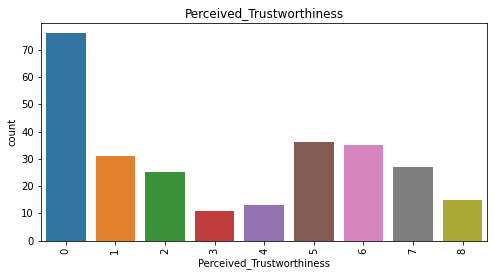

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='MultiChannel_Assistance', ylabel='count'>

Text(0.5, 1.0, 'MultiChannel_Assistance')

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 [Text(0, 0, '0'),
  Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4'),
  Text(5, 0, '5'),
  Text(6, 0, '6'),
  Text(7, 0, '7'),
  Text(8, 0, '8'),
  Text(9, 0, '9')])

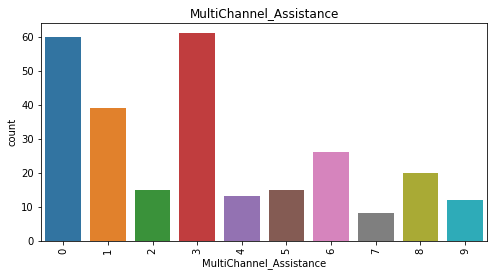

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Long_LoginTime', ylabel='count'>

Text(0.5, 1.0, 'Long_LoginTime')

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 [Text(0, 0, '0'),
  Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4'),
  Text(5, 0, '5'),
  Text(6, 0, '6'),
  Text(7, 0, '7'),
  Text(8, 0, '8'),
  Text(9, 0, '9')])

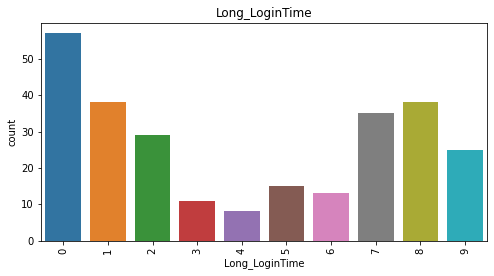

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='LongPhoto_DisplayTime', ylabel='count'>

Text(0.5, 1.0, 'LongPhoto_DisplayTime')

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 [Text(0, 0, '0'),
  Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4'),
  Text(5, 0, '5'),
  Text(6, 0, '6'),
  Text(7, 0, '7'),
  Text(8, 0, '8'),
  Text(9, 0, '9')])

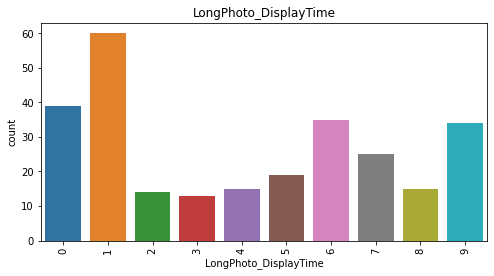

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='LatePrice_Declare', ylabel='count'>

Text(0.5, 1.0, 'LatePrice_Declare')

(array([0, 1, 2, 3, 4, 5, 6, 7]),
 [Text(0, 0, '0'),
  Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4'),
  Text(5, 0, '5'),
  Text(6, 0, '6'),
  Text(7, 0, '7')])

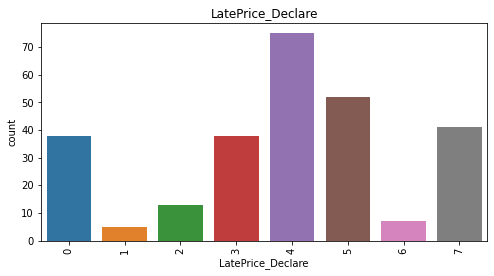

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Long_LoadingTime', ylabel='count'>

Text(0.5, 1.0, 'Long_LoadingTime')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 0, '0'),
  Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4'),
  Text(5, 0, '5'),
  Text(6, 0, '6'),
  Text(7, 0, '7'),
  Text(8, 0, '8'),
  Text(9, 0, '9'),
  Text(10, 0, '10')])

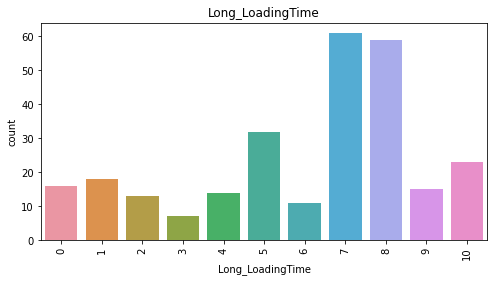

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Limited_PaymentMode', ylabel='count'>

Text(0.5, 1.0, 'Limited_PaymentMode')

(array([0, 1, 2, 3, 4, 5, 6, 7]),
 [Text(0, 0, '0'),
  Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4'),
  Text(5, 0, '5'),
  Text(6, 0, '6'),
  Text(7, 0, '7')])

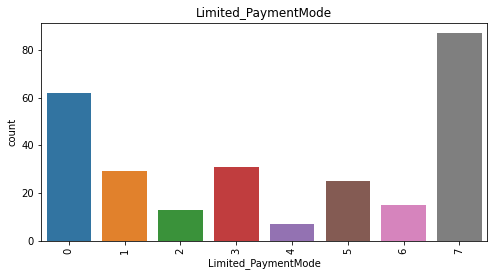

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Late_Delivery', ylabel='count'>

Text(0.5, 1.0, 'Late_Delivery')

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, '0'),
  Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4'),
  Text(5, 0, '5')])

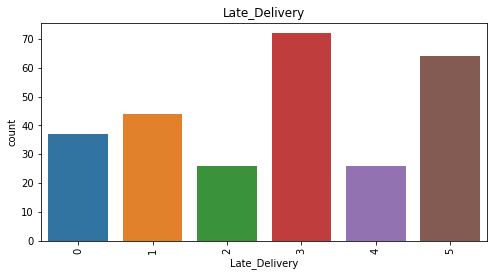

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='ChangeWebApp_Design', ylabel='count'>

Text(0.5, 1.0, 'ChangeWebApp_Design')

(array([0, 1, 2, 3, 4, 5, 6]),
 [Text(0, 0, '0'),
  Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4'),
  Text(5, 0, '5'),
  Text(6, 0, '6')])

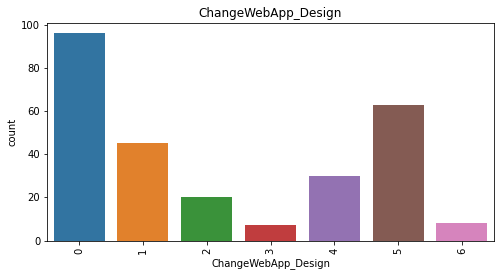

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Page_Disruption', ylabel='count'>

Text(0.5, 1.0, 'Page_Disruption')

(array([0, 1, 2, 3, 4, 5, 6, 7]),
 [Text(0, 0, '0'),
  Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4'),
  Text(5, 0, '5'),
  Text(6, 0, '6'),
  Text(7, 0, '7')])

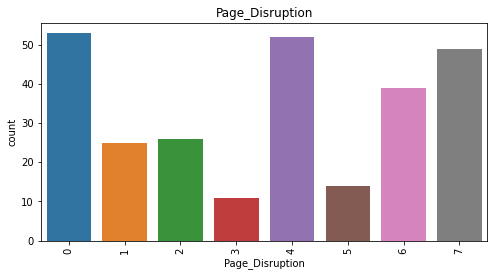

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='WebApp_Efficiency', ylabel='count'>

Text(0.5, 1.0, 'WebApp_Efficiency')

(array([0, 1, 2, 3, 4, 5, 6, 7]),
 [Text(0, 0, '0'),
  Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4'),
  Text(5, 0, '5'),
  Text(6, 0, '6'),
  Text(7, 0, '7')])

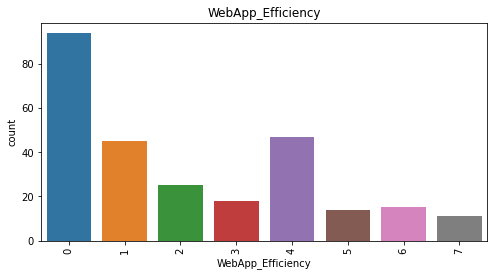

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Recommendation', ylabel='count'>

Text(0.5, 1.0, 'Recommendation')

(array([0, 1, 2, 3, 4, 5, 6, 7]),
 [Text(0, 0, '0'),
  Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4'),
  Text(5, 0, '5'),
  Text(6, 0, '6'),
  Text(7, 0, '7')])

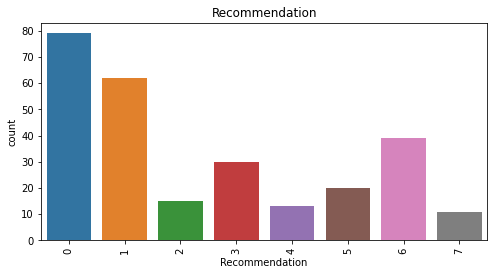

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Age', ylabel='count'>

Text(0.5, 1.0, 'Age')

(array([0, 1, 2, 3]),
 [Text(0, 0, '0'), Text(1, 0, '1'), Text(2, 0, '2'), Text(3, 0, '4')])

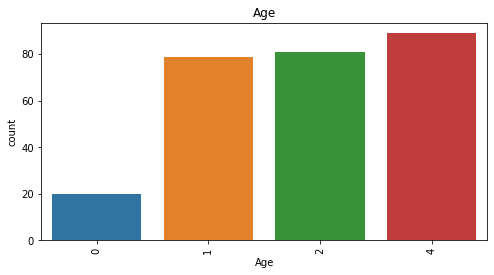

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Shopping_City', ylabel='count'>

Text(0.5, 1.0, 'Shopping_City')

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 [Text(0, 0, '1'),
  Text(1, 0, '2'),
  Text(2, 0, '3'),
  Text(3, 0, '4'),
  Text(4, 0, '5'),
  Text(5, 0, '6'),
  Text(6, 0, '7'),
  Text(7, 0, '8'),
  Text(8, 0, '9'),
  Text(9, 0, '10')])

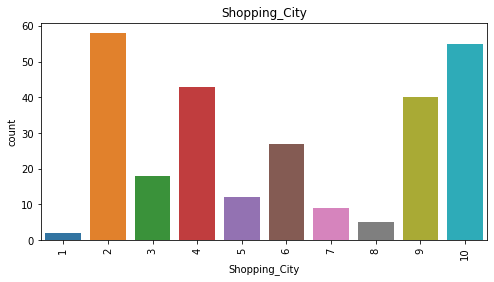

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='PinCode', ylabel='count'>

Text(0.5, 1.0, 'PinCode')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38]),
 [Text(0, 0, '110008'),
  Text(1, 0, '110009'),
  Text(2, 0, '110011'),
  Text(3, 0, '110014'),
  Text(4, 0, '110018'),
  Text(5, 0, '110030'),
  Text(6, 0, '110039'),
  Text(7, 0, '110042'),
  Text(8, 0, '110044'),
  Text(9, 0, '122009'),
  Text(10, 0, '122018'),
  Text(11, 0, '132001'),
  Text(12, 0, '132036'),
  Text(13, 0, '173212'),
  Text(14, 0, '173229'),
  Text(15, 0, '201001'),
  Text(16, 0, '201005'),
  Text(17, 0, '201008'),
  Text(18, 0, '201009'),
  Text(19, 0, '201303'),
  Text(20, 0, '201304'),
  Text(21, 0, '201305'),
  Text(22, 0, '201306'),
  Text(23, 0, '201308'),
  Text(24, 0, '201310'),
  Text(25, 0, '201312'),
  Text(26, 0, '203001'),
  Text(27, 0, '203202'),
  Text(28, 0, '203207'),
  Text(29, 0, '244001'),
  Text(30, 0, '250001'),
  Text(31, 0, '530068'),
  Text(32, 0, '560001'),
  T

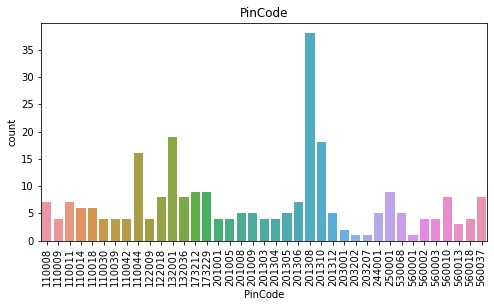

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Shopping_Since', ylabel='count'>

Text(0.5, 1.0, 'Shopping_Since')

(array([0]), [Text(0, 0, '4')])

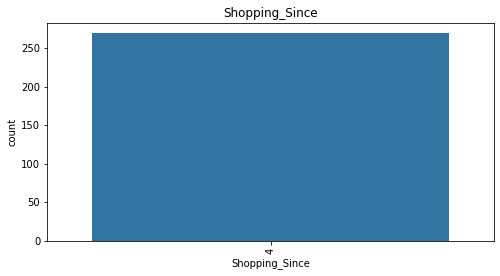

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Shopping_Frequency', ylabel='count'>

Text(0.5, 1.0, 'Shopping_Frequency')

(array([0, 1, 2, 3, 4]),
 [Text(0, 0, '0'),
  Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4')])

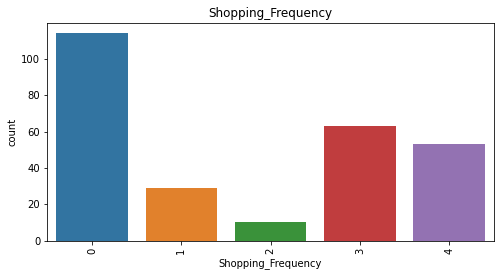

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='TimeSpent_ForPurchase', ylabel='count'>

Text(0.5, 1.0, 'TimeSpent_ForPurchase')

(array([0, 1, 2, 3, 4]),
 [Text(0, 0, '0'),
  Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4')])

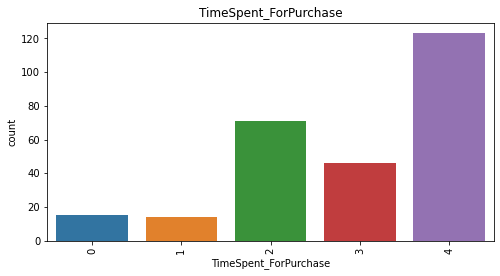

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Content_Readability', ylabel='count'>

Text(0.5, 1.0, 'Content_Readability')

(array([0, 1, 2]), [Text(0, 0, '0'), Text(1, 0, '1'), Text(2, 0, '2')])

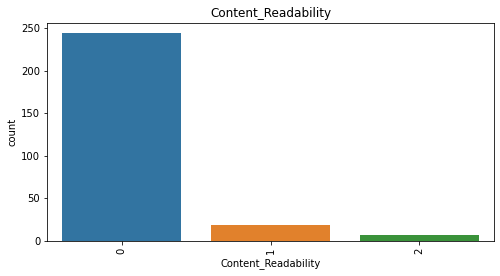

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Similar_ProductInfo', ylabel='count'>

Text(0.5, 1.0, 'Similar_ProductInfo')

(array([0, 1, 2]), [Text(0, 0, '0'), Text(1, 0, '1'), Text(2, 0, '2')])

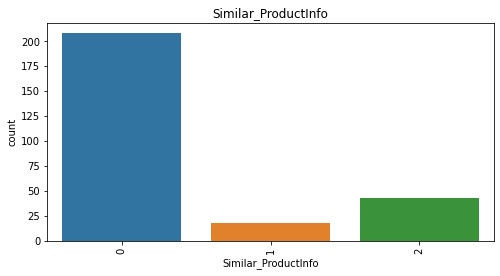

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Seller_ProductInfo', ylabel='count'>

Text(0.5, 1.0, 'Seller_ProductInfo')

(array([0, 1, 2]), [Text(0, 0, '0'), Text(1, 0, '1'), Text(2, 0, '2')])

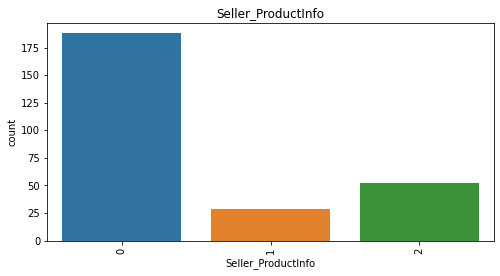

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='ProductInfo_Clarity', ylabel='count'>

Text(0.5, 1.0, 'ProductInfo_Clarity')

(array([0, 1]), [Text(0, 0, '0'), Text(1, 0, '1')])

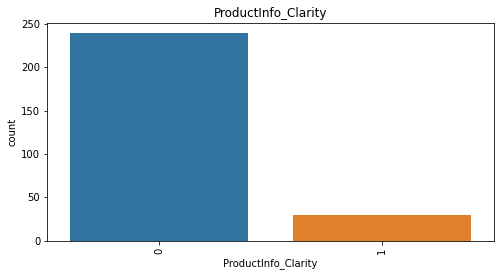

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Ease_Navigation', ylabel='count'>

Text(0.5, 1.0, 'Ease_Navigation')

(array([0, 1]), [Text(0, 0, '0'), Text(1, 0, '1')])

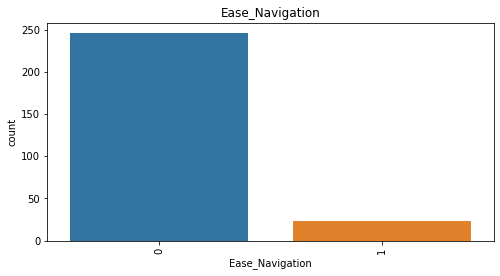

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Loading_ProcessingSpeed', ylabel='count'>

Text(0.5, 1.0, 'Loading_ProcessingSpeed')

(array([0, 1, 2]), [Text(0, 0, '0'), Text(1, 0, '1'), Text(2, 0, '2')])

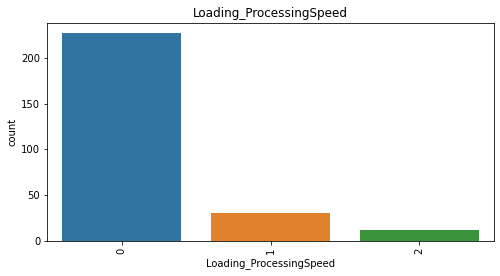

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='UserFriendly_Interface', ylabel='count'>

Text(0.5, 1.0, 'UserFriendly_Interface')

(array([0, 1, 2]), [Text(0, 0, '0'), Text(1, 0, '1'), Text(2, 0, '2')])

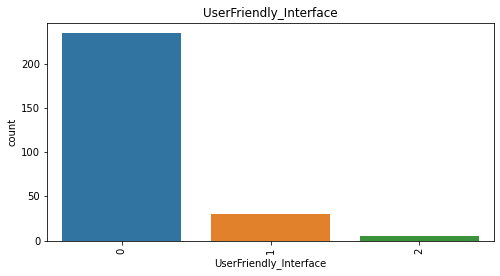

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Conveninet_PaymentMode', ylabel='count'>

Text(0.5, 1.0, 'Conveninet_PaymentMode')

(array([0, 1]), [Text(0, 0, '0'), Text(1, 0, '1')])

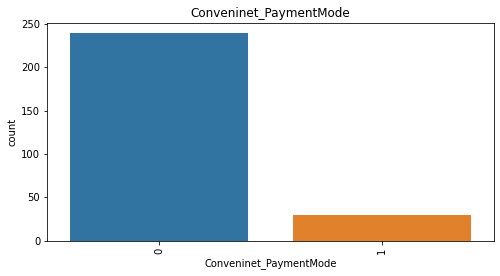

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='TimelyFulfilment_Trust', ylabel='count'>

Text(0.5, 1.0, 'TimelyFulfilment_Trust')

(array([0, 1, 2]), [Text(0, 0, '0'), Text(1, 0, '1'), Text(2, 0, '2')])

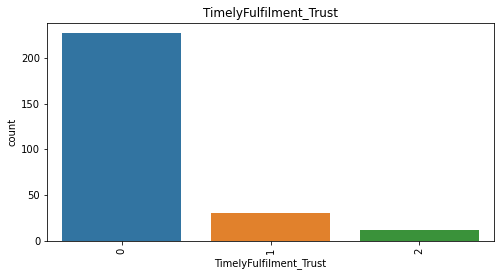

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Customer_Empathy', ylabel='count'>

Text(0.5, 1.0, 'Customer_Empathy')

(array([0, 1, 2]), [Text(0, 0, '0'), Text(1, 0, '1'), Text(2, 0, '2')])

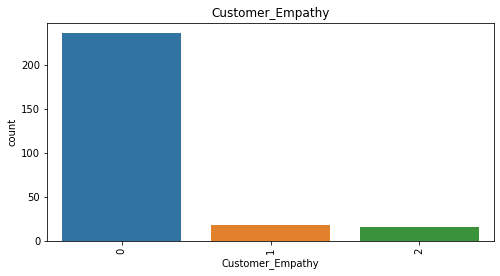

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='CustPrivacy_Guarantee', ylabel='count'>

Text(0.5, 1.0, 'CustPrivacy_Guarantee')

(array([0, 1]), [Text(0, 0, '0'), Text(1, 0, '2')])

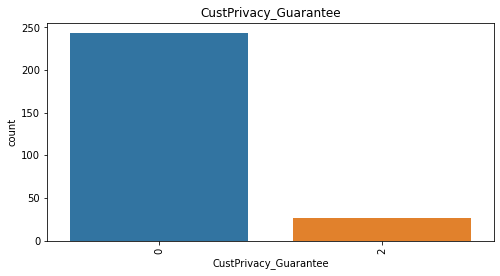

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='VariousChannel_Responses', ylabel='count'>

Text(0.5, 1.0, 'VariousChannel_Responses')

(array([0, 1, 2]), [Text(0, 0, '0'), Text(1, 0, '1'), Text(2, 0, '2')])

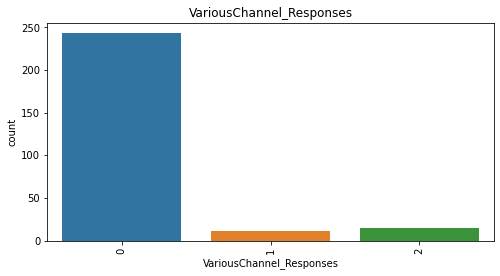

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Benefit_Discount', ylabel='count'>

Text(0.5, 1.0, 'Benefit_Discount')

(array([0, 1, 2]), [Text(0, 0, '0'), Text(1, 0, '1'), Text(2, 0, '2')])

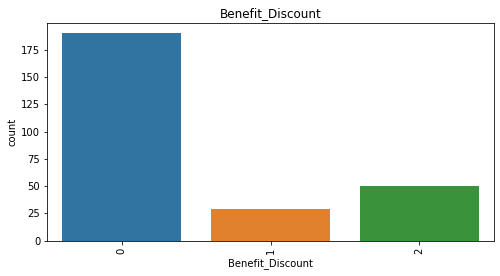

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Enjoy_OnlineShopping', ylabel='count'>

Text(0.5, 1.0, 'Enjoy_OnlineShopping')

(array([0, 1, 2]), [Text(0, 0, '0'), Text(1, 0, '1'), Text(2, 0, '2')])

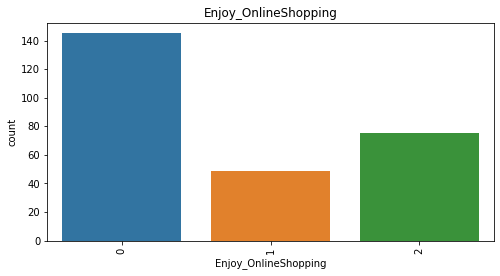

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Convenience_Flexibility', ylabel='count'>

Text(0.5, 1.0, 'Convenience_Flexibility')

(array([0, 1, 2]), [Text(0, 0, '0'), Text(1, 0, '1'), Text(2, 0, '2')])

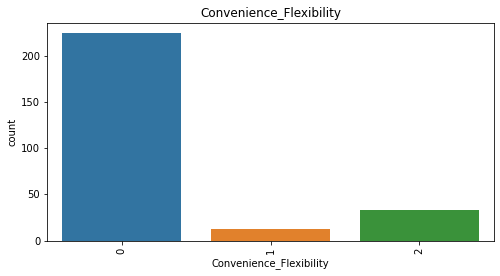

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Returns_ReplacementPolicy', ylabel='count'>

Text(0.5, 1.0, 'Returns_ReplacementPolicy')

(array([0, 1]), [Text(0, 0, '0'), Text(1, 0, '1')])

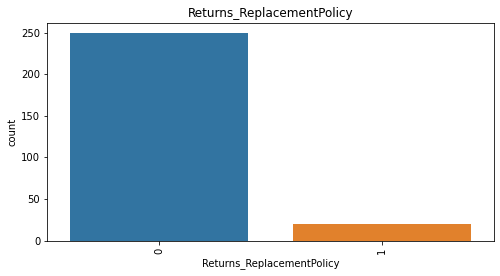

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Loyalty_ProgramAccess', ylabel='count'>

Text(0.5, 1.0, 'Loyalty_ProgramAccess')

(array([0, 1, 2]), [Text(0, 0, '0'), Text(1, 0, '1'), Text(2, 0, '2')])

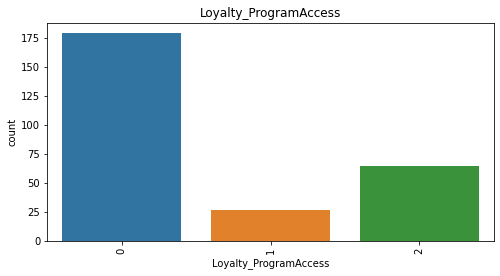

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='QualityInfo_Satisfaction', ylabel='count'>

Text(0.5, 1.0, 'QualityInfo_Satisfaction')

(array([0, 1]), [Text(0, 0, '0'), Text(1, 0, '2')])

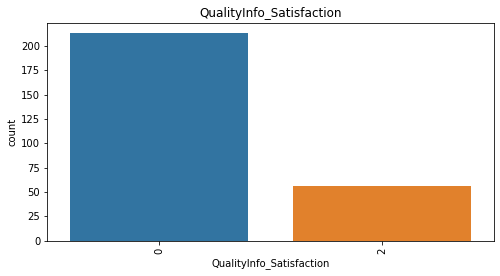

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='WebsiteQuality_Satisfaction', ylabel='count'>

Text(0.5, 1.0, 'WebsiteQuality_Satisfaction')

(array([0, 1]), [Text(0, 0, '0'), Text(1, 0, '1')])

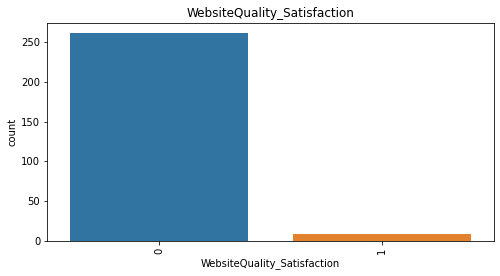

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='NetBenefit_Satisfaction', ylabel='count'>

Text(0.5, 1.0, 'NetBenefit_Satisfaction')

(array([0, 1, 2]), [Text(0, 0, '0'), Text(1, 0, '1'), Text(2, 0, '2')])

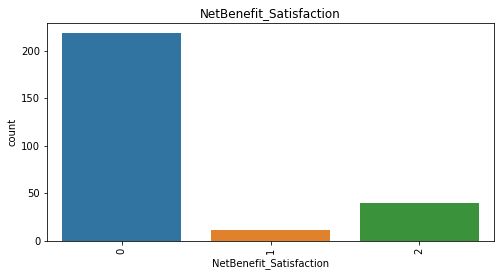

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='User_Trust', ylabel='count'>

Text(0.5, 1.0, 'User_Trust')

(array([0, 1, 2]), [Text(0, 0, '0'), Text(1, 0, '1'), Text(2, 0, '2')])

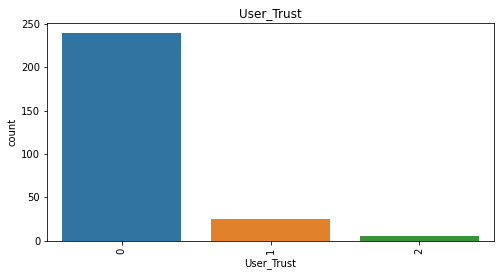

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Product_SeveralCategory', ylabel='count'>

Text(0.5, 1.0, 'Product_SeveralCategory')

(array([0, 1, 2]), [Text(0, 0, '0'), Text(1, 0, '1'), Text(2, 0, '2')])

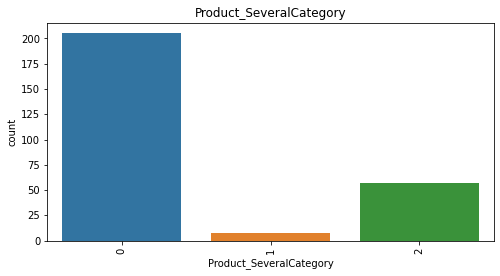

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Relevant_ProductInfo', ylabel='count'>

Text(0.5, 1.0, 'Relevant_ProductInfo')

(array([0, 1, 2]), [Text(0, 0, '0'), Text(1, 0, '1'), Text(2, 0, '2')])

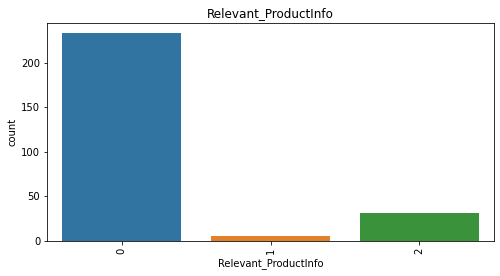

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Monetary_Savings', ylabel='count'>

Text(0.5, 1.0, 'Monetary_Savings')

(array([0, 1, 2]), [Text(0, 0, '0'), Text(1, 0, '1'), Text(2, 0, '2')])

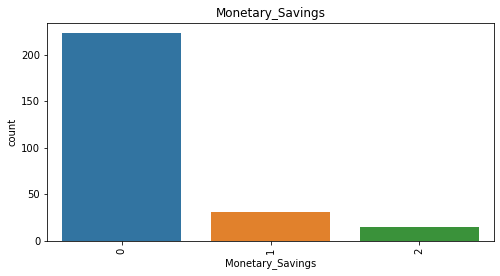

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Patronizing_Convenience', ylabel='count'>

Text(0.5, 1.0, 'Patronizing_Convenience')

(array([0, 1]), [Text(0, 0, '0'), Text(1, 0, '2')])

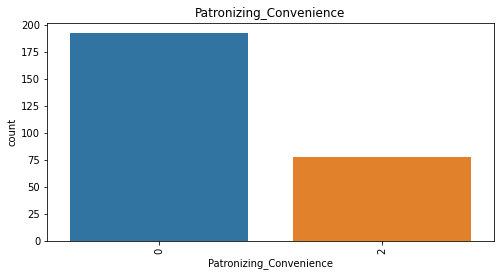

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Adventure_Sense', ylabel='count'>

Text(0.5, 1.0, 'Adventure_Sense')

(array([0, 1, 2]), [Text(0, 0, '0'), Text(1, 0, '1'), Text(2, 0, '2')])

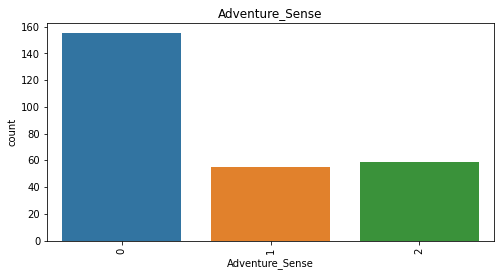

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Enhances_SocialStatus', ylabel='count'>

Text(0.5, 1.0, 'Enhances_SocialStatus')

(array([0, 1, 2]), [Text(0, 0, '0'), Text(1, 0, '1'), Text(2, 0, '2')])

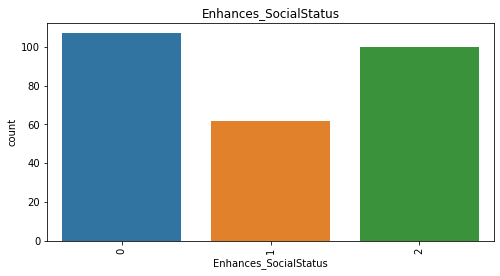

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Gratification_Shopping', ylabel='count'>

Text(0.5, 1.0, 'Gratification_Shopping')

(array([0, 1, 2]), [Text(0, 0, '0'), Text(1, 0, '1'), Text(2, 0, '2')])

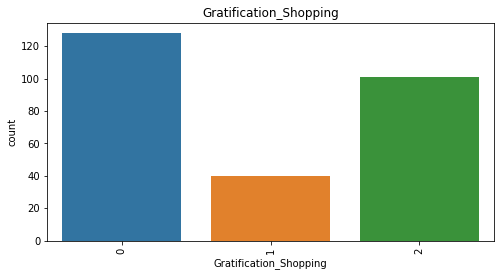

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Role_Fulfilment', ylabel='count'>

Text(0.5, 1.0, 'Role_Fulfilment')

(array([0, 1, 2]), [Text(0, 0, '0'), Text(1, 0, '1'), Text(2, 0, '2')])

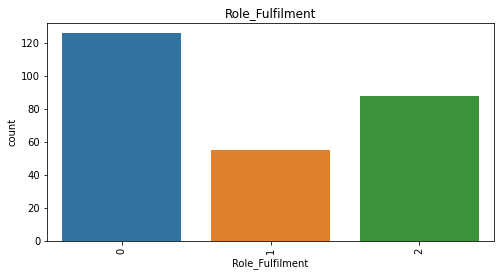

<Figure size 576x288 with 0 Axes>

<AxesSubplot:xlabel='Money_Worthy', ylabel='count'>

Text(0.5, 1.0, 'Money_Worthy')

(array([0, 1]), [Text(0, 0, '0'), Text(1, 0, '2')])

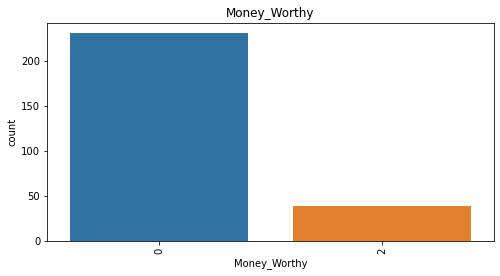

In [39]:
#Count plot for all columns 
for i in new_data:              
    plt.figure(figsize = (8, 4))
    sns.countplot(new_data[i])
    plt.title(i)
    plt.xticks(rotation=90)
    plt.show()

In [40]:
#Lets check the value count of each column to see if there are any unexpected and unwanted entries present in the column.
for i in new_data.columns:
        print(data[i].value_counts())
        print('\n','XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX','\n')

Female    181
Male       88
Name: Gender, dtype: int64

 XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX 

Mobile Internet    189
Wi-Fi               76
Dial-up              4
Name: Internet_Access, dtype: int64

 XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX 

Smartphone    141
Laptop         86
Desktop        30
Tablet         12
Name: Device_Used, dtype: int64

 XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX 

Others        134
5.5 inches     99
4.7 inches     29
5 inches        7
Name: Screen_Size, dtype: int64

 XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX 

Window/windows Mobile    122
Android                   85
IOS/Mac                   62
Name: Operating_System, dtype: int64

 XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX 

Google chrome      216
Safari              40
Opera                8
Mozilla Firefox      5
Name: Browser_Used, dtype: int64

 XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX 

Search Engine        230
Content Marketing     20
Display Adverts       19
Name: Channel_FirstUsed, dtype: int64


<Figure size 1800x1800 with 0 Axes>

For  Gender  :


([<matplotlib.patches.Wedge at 0x2014533d790>,
 [Text(-0.16989226693747422, -1.086801093868996, ''),
  Text(0.16989216518381167, 1.0868011097754533, '')],
 [Text(-0.09266850923862228, -0.592800596655816, '67.29%'),
  Text(0.09266845373662454, 0.5928006053320654, '32.71%')])

<Figure size 1800x1800 with 0 Axes>

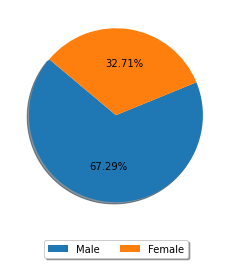

<Figure size 1800x1800 with 0 Axes>

For  Internet_Access  :


([<matplotlib.patches.Wedge at 0x201452b0f10>,
 [Text(-0.06775897834398494, -1.097911071468805, ''),
  Text(0.11895549947412869, 1.0935490794403608, ''),
  Text(-0.8087108625744557, 0.7456451842224155, '')],
 [Text(-0.03695944273308269, -0.59886058443753, '70.26%'),
  Text(0.06488481789497927, 0.5964813160583786, '28.25%'),
  Text(-0.44111501594970304, 0.4067155550304084, '1.49%')])

<Figure size 1800x1800 with 0 Axes>

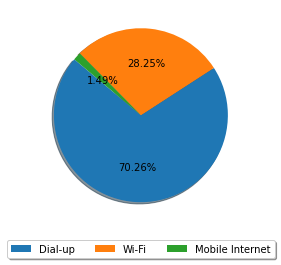

<Figure size 1800x1800 with 0 Axes>

For  Device_Used  :


([<matplotlib.patches.Wedge at 0x201450f2c70>,
 [Text(-0.6411243122366016, -0.8938454095978481, ''),
  Text(0.9865995558096801, 0.48643737158666395, ''),
  Text(-0.2636201427004038, 1.0679440155563487, ''),
  Text(-0.7356191055812056, 0.8178413852966279, '')],
 [Text(-0.34970417031087353, -0.48755204159882615, '52.42%'),
  Text(0.5381452122598254, 0.26532947541090757, '31.97%'),
  Text(-0.14379280510931114, 0.5825149175761901, '11.15%'),
  Text(-0.4012467848624757, 0.44609530107088785, '4.46%')])

<Figure size 1800x1800 with 0 Axes>

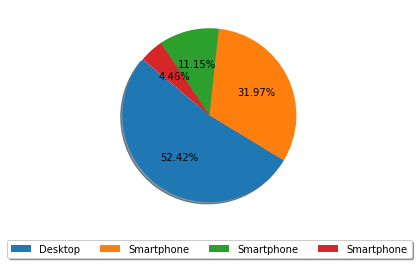

<Figure size 1800x1800 with 0 Axes>

For  Screen_Size  :


([<matplotlib.patches.Wedge at 0x20144f85730>,
 [Text(-0.7119748577019501, -0.8385056958663358, ''),
  Text(0.9922130668218323, 0.4748823328236314, ''),
  Text(-0.3982660604806461, 1.0253702477979487, ''),
  Text(-0.782095246173751, 0.773516015291487, '')],
 [Text(-0.38834992238288185, -0.4573667431998195, '49.81%'),
  Text(0.541207127357363, 0.259026726994708, '36.80%'),
  Text(-0.2172360329894433, 0.5592928624352447, '10.78%'),
  Text(-0.42659740700386417, 0.4219178265226292, '2.60%')])

<Figure size 1800x1800 with 0 Axes>

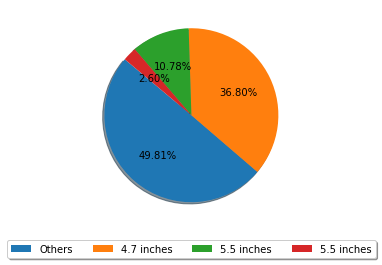

<Figure size 1800x1800 with 0 Axes>

For  Operating_System  :


([<matplotlib.patches.Wedge at 0x20144cd2b80>,
 [Text(-0.8221228599292508, -0.7308310360006269, ''),
  Text(1.0999962954544997, 0.002854818098797954, ''),
  Text(-0.16283747750035785, 1.0878804878851907, '')],
 [Text(-0.4484306508705004, -0.3986351105457965, '45.35%'),
  Text(0.5999979793388179, 0.0015571735084352475, '31.60%'),
  Text(-0.08882044227292246, 0.5933893570282858, '23.05%')])

<Figure size 1800x1800 with 0 Axes>

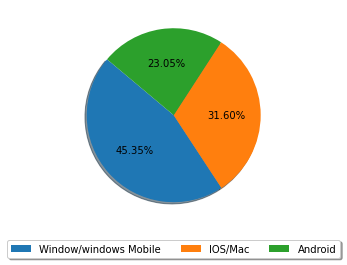

<Figure size 1800x1800 with 0 Axes>

For  Browser_Used  :


([<matplotlib.patches.Wedge at 0x20144e79a30>,
 [Text(0.2760744005431055, -1.0647924329956358, ''),
  Text(-0.11185779599245929, 1.0942978723710055, ''),
  Text(-0.6765525540700257, 0.8673388274378849, ''),
  Text(-0.7999477480609662, 0.7550388071961527, '')],
 [Text(0.15058603665987572, -0.580795872543074, '80.30%'),
  Text(-0.06101334326861415, 0.596889748566003, '14.87%'),
  Text(-0.3690286658563776, 0.4730939058752099, '2.97%'),
  Text(-0.43633513530598156, 0.4118393493797196, '1.86%')])

<Figure size 1800x1800 with 0 Axes>

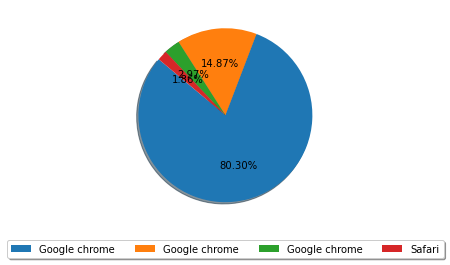

<Figure size 1800x1800 with 0 Axes>

For  Channel_FirstUsed  :


([<matplotlib.patches.Wedge at 0x20144eb4430>,
 [Text(0.44571455985879294, -1.0056532857450835, ''),
  Text(-0.21346193810851974, 1.0790894314091648, ''),
  Text(-0.6663773153187421, 0.8751807091273127, '')],
 [Text(0.24311703265025067, -0.5485381558609546, '85.50%'),
  Text(-0.11643378442282894, 0.5885942353140898, '7.43%'),
  Text(-0.36347853562840476, 0.47737129588762506, '7.06%')])

<Figure size 1800x1800 with 0 Axes>

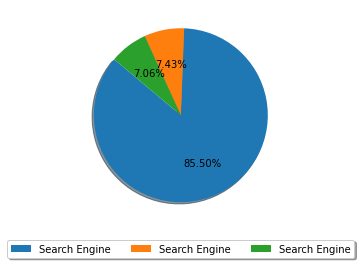

<Figure size 1800x1800 with 0 Axes>

For  Login_Mode  :


([<matplotlib.patches.Wedge at 0x20144fc1910>,
 [Text(-1.0448755903197091, -0.3438531674334842, ''),
  Text(0.7638161116233112, -0.7915711892335683, ''),
  Text(0.5769679339503232, 0.9365404439708388, ''),
  Text(-0.50364550138076, 0.9779269957102744, ''),
  Text(-0.773008447746752, 0.7825969203313781, '')],
 [Text(-0.5699321401743866, -0.18755627314553683, '32.34%'),
  Text(0.41662696997635157, -0.43176610321830994, '31.97%'),
  Text(0.3147097821547217, 0.510840242165912, '26.02%'),
  Text(-0.2747157280258691, 0.5334147249328769, '6.69%'),
  Text(-0.4216409714982283, 0.42687104745347887, '2.97%')])

<Figure size 1800x1800 with 0 Axes>

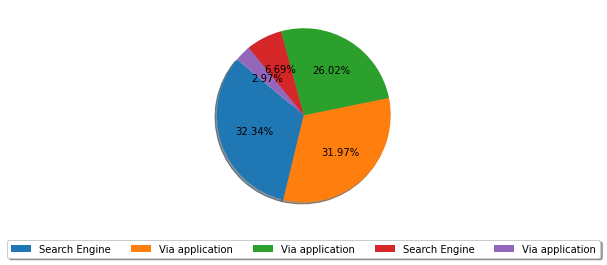

<Figure size 1800x1800 with 0 Axes>

For  Payment_Mode  :


([<matplotlib.patches.Wedge at 0x20144ebb0d0>,
 [Text(-0.5659912416148503, -0.9432146703774706, ''),
  Text(0.9628074330248428, 0.5319791790212404, ''),
  Text(-0.37420945534014344, 1.0343922290572534, '')],
 [Text(-0.3087224954262819, -0.5144807292968021, '55.02%'),
  Text(0.5251676907408233, 0.2901704612843129, '28.25%'),
  Text(-0.20411424836735095, 0.5642139431221381, '16.73%')])

<Figure size 1800x1800 with 0 Axes>

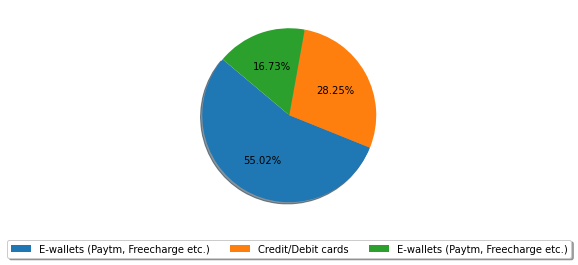

<Figure size 1800x1800 with 0 Axes>

For  Abandon_Frequency  :


([<matplotlib.patches.Wedge at 0x20144fd3bb0>,
 [Text(-0.2953719114293669, -1.0596015448924951, ''),
  Text(0.8135318519238901, 0.7403822836246732, ''),
  Text(-0.3377457875840782, 1.0468656948096118, '')],
 [Text(-0.1611119516887456, -0.57796447903227, '63.57%'),
  Text(0.44374464650394, 0.4038448819770944, '18.59%'),
  Text(-0.1842249750458608, 0.5710176517143336, '17.84%')])

<Figure size 1800x1800 with 0 Axes>

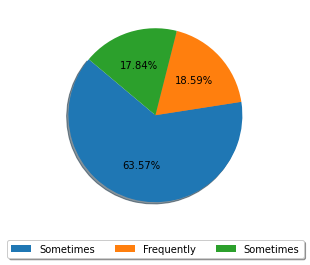

<Figure size 1800x1800 with 0 Axes>

For  Abandon_Reason  :


([<matplotlib.patches.Wedge at 0x201451e5af0>,
 [Text(-0.7217187555338461, -0.8301337470014556, ''),
  Text(1.0942250819377184, -0.1125676243792754, ''),
  Text(0.6306416458191045, 0.9012719426225202, ''),
  Text(-0.20084513137305132, 1.0815087762952929, ''),
  Text(-0.7163176499045621, 0.8347987927849473, '')],
 [Text(-0.3936647757457342, -0.45280022563715755, '49.44%'),
  Text(0.5968500446933008, -0.061400522388695665, '20.07%'),
  Text(0.34398635226496604, 0.4916028777941019, '13.75%'),
  Text(-0.10955188983984616, 0.5899138779792507, '11.52%'),
  Text(-0.3907187181297611, 0.45534479606451667, '5.20%')])

<Figure size 1800x1800 with 0 Axes>

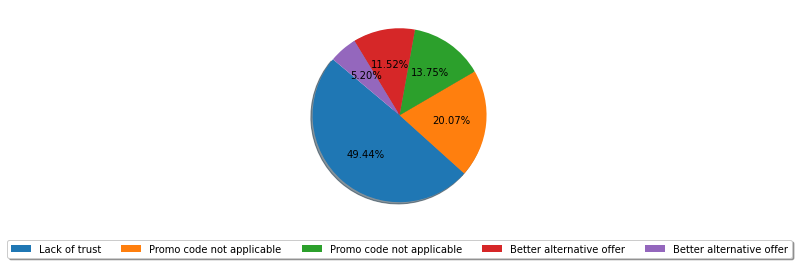

<Figure size 1800x1800 with 0 Axes>

For  Shopped_From  :


([<matplotlib.patches.Wedge at 0x201463b84f0>,
 [Text(-1.0631621773570608, -0.2822874149468831, ''),
  Text(0.17553123805755416, -1.085904592708762, ''),
  Text(0.9529846605823196, -0.54938168580214, ''),
  Text(1.080317527495318, 0.2071570413633167, ''),
  Text(0.7313642174451717, 0.8216485753902406, ''),
  Text(0.1952285859226028, 1.0825367426737353, ''),
  Text(-0.2636204551633142, 1.0679439384253684, ''),
  Text(-0.5926840299238232, 0.9266745063253099, ''),
  Text(-0.782095336700992, 0.7735159237601784, '')],
 [Text(-0.5799066421947604, -0.15397495360739077, '30.48%'),
  Text(0.0957443116677568, -0.5923115960229611, '16.36%'),
  Text(0.5198098148630833, -0.29966273771025814, '11.90%'),
  Text(0.5892641059065371, 0.11299474983453636, '10.78%'),
  Text(0.3989259367882754, 0.44817195021285844, '10.04%'),
  Text(0.10648831959414698, 0.5904745869129465, '7.43%'),
  Text(-0.14379297554362594, 0.5825148755047463, '5.95%'),
  Text(-0.32328219814026715, 0.5054588216319872, '4.46%'),
  Text(

<Figure size 1800x1800 with 0 Axes>

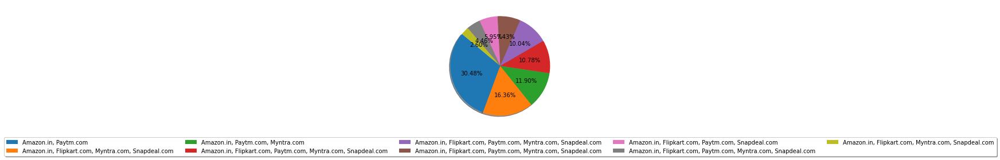

<Figure size 1800x1800 with 0 Axes>

For  Easy_WebApp  :


([<matplotlib.patches.Wedge at 0x201451e8d60>,
 [Text(-1.0986629368985865, -0.05421947145973387, ''),
  Text(-0.2829771098178365, -1.06297881226257, ''),
  Text(0.7638161486794324, -0.7915711534767543, ''),
  Text(1.0986629330912887, 0.05421954860791923, ''),
  Text(0.8790570762154808, 0.6612553642546052, ''),
  Text(0.4639095428255282, 0.997390563458172, ''),
  Text(-0.02212339909346528, 1.0997775025942982, ''),
  Text(-0.4102138083862115, 1.0206491225731205, ''),
  Text(-0.6353114096880473, 0.8979863098734782, ''),
  Text(-0.7820953276482674, 0.7735159329133106, '')],
 [Text(-0.5992706928537743, -0.029574257159854834, '23.79%'),
  Text(-0.154351150809729, -0.5798066248704927, '16.36%'),
  Text(0.4166269901887813, -0.43176608371459324, '16.36%'),
  Text(0.5992706907770665, 0.02957429924068321, '10.78%'),
  Text(0.4794856779357167, 0.3606847441388755, '8.18%'),
  Text(0.2530415688139244, 0.5440312164317301, '7.43%'),
  Text(-0.012067308596435605, 0.599878637778708, '7.06%'),
  Text(-0.

<Figure size 1800x1800 with 0 Axes>

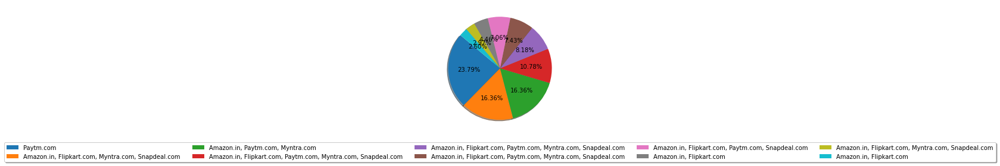

<Figure size 1800x1800 with 0 Axes>

For  Visually_AppealingWebApp  :


([<matplotlib.patches.Wedge at 0x2014649a970>,
 [Text(-1.0448755903197091, -0.3438531674334842, ''),
  Text(0.30086780925607826, -1.0580541391410216, ''),
  Text(1.0297006660001335, -0.38693221426870344, ''),
  Text(1.0526213992760114, 0.31935589831129174, ''),
  Text(0.8389674317158964, 0.7114307053536788, ''),
  Text(0.5438075525031938, 0.956176419830821, ''),
  Text(0.18257288984585235, 1.0847428911467152, ''),
  Text(-0.18820099393591674, 1.083780598590662, ''),
  Text(-0.5036455242707939, 0.9779269839216, ''),
  Text(-0.7451203383927234, 0.8091944644604988, '')],
 [Text(-0.5699321401743866, -0.18755627314553683, '32.34%'),
  Text(0.16410971413967904, -0.5771204395314663, '16.36%'),
  Text(0.5616549087273455, -0.2110539350556564, '13.38%'),
  Text(0.5741571268778243, 0.17419412635161366, '7.43%'),
  Text(0.4576185991177616, 0.3880531120110975, '5.58%'),
  Text(0.29662230136537837, 0.521550774453175, '5.58%'),
  Text(0.09958521264319217, 0.591677940625481, '5.58%'),
  Text(-0.102655

<Figure size 1800x1800 with 0 Axes>

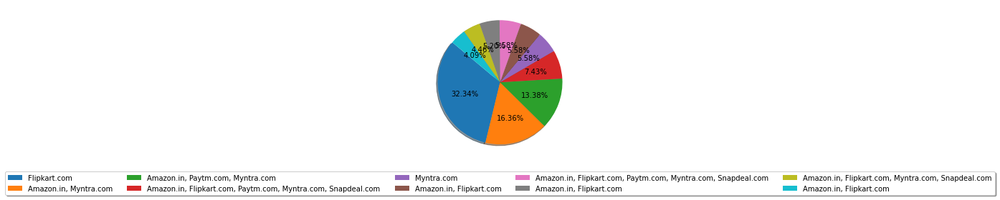

<Figure size 1800x1800 with 0 Axes>

For  Product_Variety  :


([<matplotlib.patches.Wedge at 0x201453715e0>,
 [Text(-0.7503547355117961, -0.8043430679100942, ''),
  Text(1.0505272565689083, -0.3261786062969232, ''),
  Text(0.9976912836322475, 0.4632624553794952, ''),
  Text(0.7313642559093169, 0.8216485411526094, ''),
  Text(0.4049103973288842, 1.0227646699681043, ''),
  Text(0.042098137682479886, 1.0991941351752506, ''),
  Text(-0.3008678464043938, 1.0580541285775422, ''),
  Text(-0.5926840082334419, 0.9266745201980799, ''),
  Text(-0.7820953185955444, 0.7735159420664414, '')],
 [Text(-0.4092844011882524, -0.438732582496415, '48.33%'),
  Text(0.5730148672194044, -0.17791560343468538, '15.99%'),
  Text(0.5441952456175895, 0.25268861202517917, '7.43%'),
  Text(0.39892595776871825, 0.4481719315377869, '5.58%'),
  Text(0.22086021672484588, 0.5578716381644204, '5.58%'),
  Text(0.022962620554079938, 0.5995604373683184, '5.20%'),
  Text(-0.1641097344023966, 0.5771204337695685, '4.83%'),
  Text(-0.32328218630915007, 0.5054588291989526, '4.46%'),
  Text(

<Figure size 1800x1800 with 0 Axes>

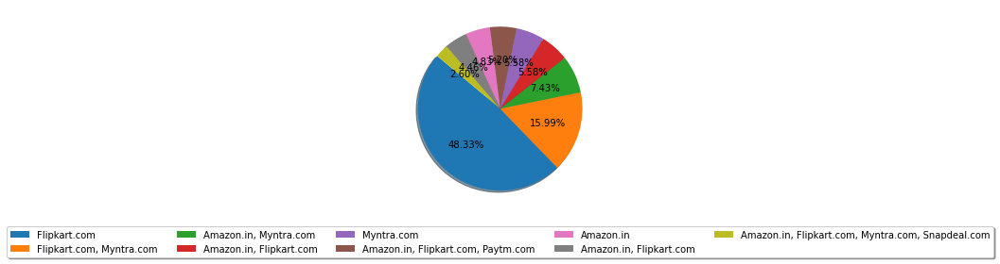

<Figure size 1800x1800 with 0 Axes>

For  Complete_ProductInfo  :


([<matplotlib.patches.Wedge at 0x20144ef2a90>,
 [Text(-0.980851297208519, -0.497926433084613, ''),
  Text(0.5926840082334411, -0.9266745201980803, ''),
  Text(1.0736546027441525, -0.23930272461110091, ''),
  Text(1.0526213992760114, 0.31935589831129174, ''),
  Text(0.8389674317158964, 0.7114307053536788, ''),
  Text(0.5438075525031938, 0.956176419830821, ''),
  Text(0.19522862393050358, 1.0825367358192526, ''),
  Text(-0.13738513764212731, 1.0913868809707463, ''),
  Text(-0.42210549826984256, 1.0157888305796476, ''),
  Text(-0.6353114096880473, 0.8979863098734782, ''),
  Text(-0.7820953276482674, 0.7735159329133106, '')],
 [Text(-0.535009798477374, -0.2715962362279707, '37.17%'),
  Text(0.3232821863091497, -0.5054588291989528, '15.99%'),
  Text(0.5856297833149922, -0.13052875887878232, '8.92%'),
  Text(0.5741571268778243, 0.17419412635161366, '7.43%'),
  Text(0.4576185991177616, 0.3880531120110975, '5.58%'),
  Text(0.29662230136537837, 0.521550774453175, '5.58%'),
  Text(0.106488340325

<Figure size 1800x1800 with 0 Axes>

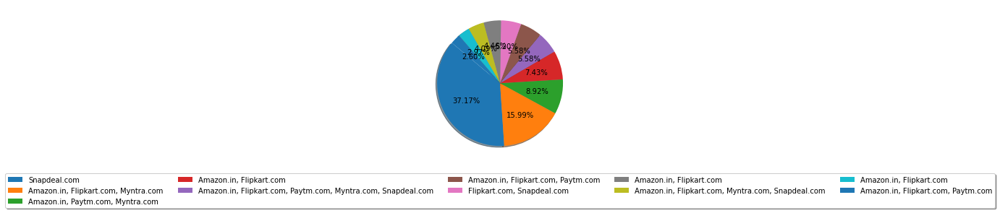

<Figure size 1800x1800 with 0 Axes>

For  Fast_WebApp  :


([<matplotlib.patches.Wedge at 0x201451095b0>,
 [Text(-1.0942250713983719, 0.11256772682802112, ''),
  Text(-0.5878659765942748, -0.9297384543853502, ''),
  Text(0.3254970789837847, -1.0507386219098565, ''),
  Text(0.9262898614641784, -0.593285001115546, ''),
  Text(1.0905660337600278, 0.14375578600154587, ''),
  Text(0.787097431585238, 0.7684254246131642, ''),
  Text(0.23302914870651445, 1.075033681264507, ''),
  Text(-0.2636204801603468, 1.0679439322548858, ''),
  Text(-0.5708794963131343, 0.9402641121989407, ''),
  Text(-0.773008502700759, 0.7825968660506702, '')],
 [Text(-0.5968500389445665, 0.06140057826982969, '18.96%'),
  Text(-0.3206541690514225, -0.5071300660283727, '16.36%'),
  Text(0.17754386126388255, -0.5731301574053761, '11.15%'),
  Text(0.5052490153440972, -0.32361000060847966, '11.15%'),
  Text(0.5948542002327424, 0.0784122469099341, '11.15%'),
  Text(0.42932587177376613, 0.4191411406980895, '9.29%'),
  Text(0.1271068083853715, 0.5863820079624582, '9.29%'),
  Text(-0.14

<Figure size 1800x1800 with 0 Axes>

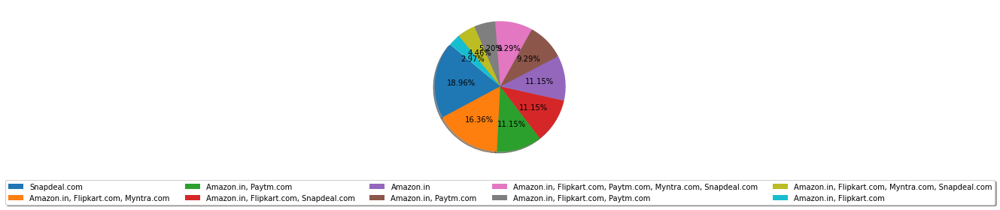

<Figure size 1800x1800 with 0 Axes>

For  Reliable_WebApp  :


([<matplotlib.patches.Wedge at 0x20144f236a0>,
 [Text(-1.099887940073445, -0.015700932488055284, ''),
  Text(-0.2829771098178365, -1.06297881226257, ''),
  Text(0.7451202910413146, -0.8091945080624972, ''),
  Text(1.0999962953208549, 0.002854869593340398, ''),
  Text(0.8942611976417634, 0.6405442298485868, ''),
  Text(0.5878659330700763, 0.9297384819053414, ''),
  Text(0.23302917386949346, 1.0750336758100658, ''),
  Text(-0.1373851504150035, 1.0913868793628807, ''),
  Text(-0.4690804612956334, 0.9949691054654289, ''),
  Text(-0.7356193352966872, 0.8178411786757012, '')],
 [Text(-0.5999388764036971, -0.0085641449934847, '22.68%'),
  Text(-0.154351150809729, -0.5798066248704927, '18.59%'),
  Text(0.4064292496588988, -0.44137882257954386, '13.38%'),
  Text(0.5999979792659207, 0.0015572015963674897, '13.01%'),
  Text(0.48777883507732545, 0.3493877617355928, '6.69%'),
  Text(0.32065414531095066, 0.507130081039277, '5.58%'),
  Text(0.1271068221106328, 0.5863820049873085, '5.58%'),
  Text(-0.

<Figure size 1800x1800 with 0 Axes>

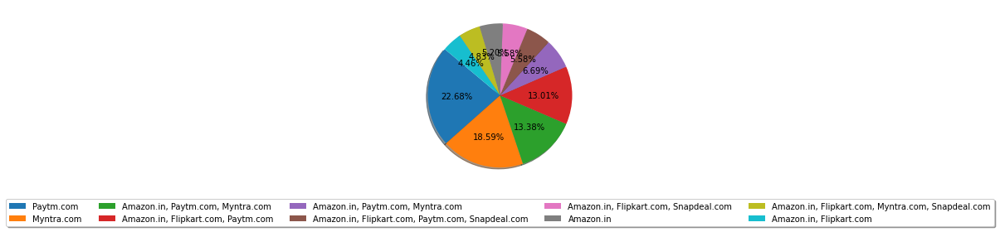

<Figure size 1800x1800 with 0 Axes>

For  Quick_Purchase  :


([<matplotlib.patches.Wedge at 0x20144e51220>,
 [Text(-1.097096927508936, -0.0798644579926046, ''),
  Text(-0.1952286619384049, -1.0825367289647683, ''),
  Text(0.7910754769558337, -0.7643295033943807, ''),
  Text(1.09988793933843, 0.015700983977526076, ''),
  Text(0.871274655833424, 0.671476339197703, ''),
  Text(0.41682716724794683, 1.017966164783512, ''),
  Text(-0.022123373351315263, 1.0997775031121333, ''),
  Text(-0.3982661324822136, 1.0253702198316763, ''),
  Text(-0.7163176108248098, 0.8347988263181954, '')],
 [Text(-0.598416505913965, -0.04356243163232977, '24.54%'),
  Text(-0.10648836105731176, -0.5904745794353281, '17.47%'),
  Text(0.431495714703182, -0.41690700185148033, '13.75%'),
  Text(0.5999388760027798, 0.008564173078650586, '11.15%'),
  Text(0.4752407213636858, 0.36625982138056523, '9.29%'),
  Text(0.2273602730443346, 0.5552542717000974, '7.43%'),
  Text(-0.01206729455526287, 0.5998786380611636, '5.58%'),
  Text(-0.21723607226302558, 0.5592928471809142, '5.58%'),
  Te

<Figure size 1800x1800 with 0 Axes>

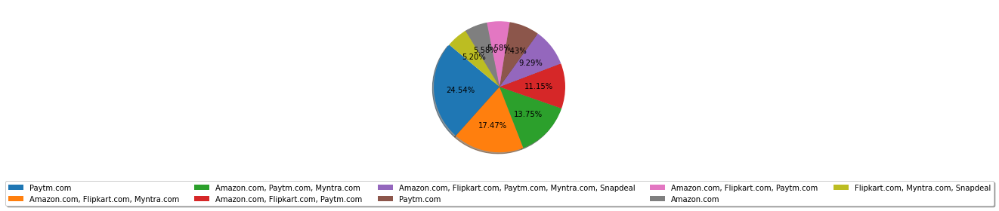

<Figure size 1800x1800 with 0 Axes>

For  PaymentOptions_Availability  :


([<matplotlib.patches.Wedge at 0x20144cf2f10>,
 [Text(-1.097954807095073, -0.0670465627517246, ''),
  Text(-0.3077262282560692, -1.056079811587786, ''),
  Text(0.6561109265962208, -0.8829034216725228, ''),
  Text(1.0763760758322716, -0.22674775274723255, ''),
  Text(1.0526214142261388, 0.31935584903452696, ''),
  Text(0.8048296933481829, 0.7498327578234162, ''),
  Text(0.4168271910751642, 1.0179661550269679, ''),
  Text(0.016414523135266267, 1.0998775220133568, ''),
  Text(-0.3132038034619367, 1.054468291366306, ''),
  Text(-0.5818213864044008, 0.9335330065522381, ''),
  Text(-0.773008447746752, 0.7825969203313781, '')],
 [Text(-0.5988844402336762, -0.0365708524100316, '24.16%'),
  Text(-0.1678506699578559, -0.5760435335933378, '14.87%'),
  Text(0.3578786872343023, -0.48158368454864875, '14.50%'),
  Text(0.587114223181239, -0.12368059240758136, '8.55%'),
  Text(0.5741571350324393, 0.17419409947337833, '7.43%'),
  Text(0.4389980145535543, 0.4089996860854997, '7.06%'),
  Text(0.227360286

<Figure size 1800x1800 with 0 Axes>

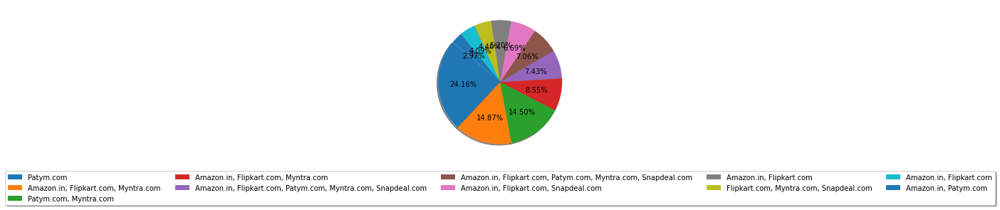

<Figure size 1800x1800 with 0 Axes>

For  Fast_Delivery  :


([<matplotlib.patches.Wedge at 0x20144cb1df0>,
 [Text(-0.9369145968956428, -0.5763601635469573, ''),
  Text(1.0203827900653208, -0.41087584711018427, ''),
  Text(0.5986838389851254, 0.9228096558543547, ''),
  Text(-0.022123373351315263, 1.0997775031121333, ''),
  Text(-0.3982661324822136, 1.0253702198316763, ''),
  Text(-0.7163176108248098, 0.8347988263181954, '')],
 [Text(-0.5110443255794415, -0.314378271025613, '39.78%'),
  Text(0.5565724309447204, -0.22411409842373683, '30.48%'),
  Text(0.3265548212646139, 0.5033507213751025, '13.38%'),
  Text(-0.01206729455526287, 0.5998786380611636, '5.58%'),
  Text(-0.21723607226302558, 0.5592928471809142, '5.58%'),
  Text(-0.3907186968135326, 0.4553448143553792, '5.20%')])

<Figure size 1800x1800 with 0 Axes>

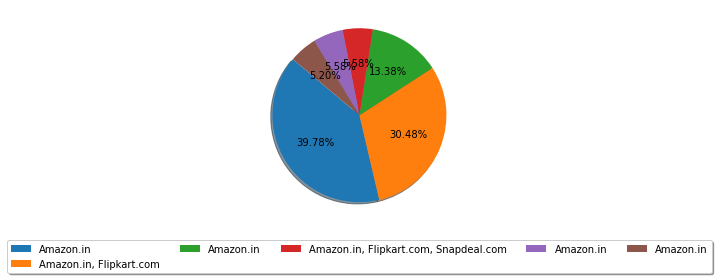

<Figure size 1800x1800 with 0 Axes>

For  CustInfo_Privacy  :


([<matplotlib.patches.Wedge at 0x2014531ab80>,
 [Text(-1.090566047219411, -0.1437556838953843, ''),
  Text(0.02212327038271425, -1.0997775051834682, ''),
  Text(0.8900864508976457, -0.6463328166884561, ''),
  Text(1.0982880257547334, -0.06134665829342466, ''),
  Text(0.9976913161625656, 0.4632623853215452, ''),
  Text(0.7503547731658116, 0.8043430327834534, ''),
  Text(0.42868713244532214, 1.0130287964691858, ''),
  Text(0.0549322978058738, 1.0986275268068642, ''),
  Text(-0.31320376643951897, 1.0544683023629016, ''),
  Text(-0.6034657276013955, 0.9196896844101919, ''),
  Text(-0.7820952823846492, 0.7735159786789644, '')],
 [Text(-0.5948542075742241, -0.07841219121566416, '26.39%'),
  Text(0.012067238390571408, -0.5998786391909826, '20.07%'),
  Text(0.4855017004896248, -0.3525451727391578, '9.29%'),
  Text(0.5990661958662181, -0.033461813614595264, '8.92%'),
  Text(0.5441952633613993, 0.25268857381175186, '6.69%'),
  Text(0.40928442172680624, 0.43873256333642907, '5.58%'),
  Text(0.233

<Figure size 1800x1800 with 0 Axes>

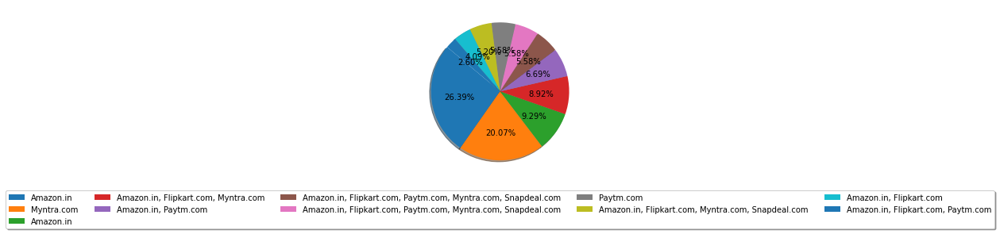

<Figure size 1800x1800 with 0 Axes>

For  FinancialInfo_Security  :


([<matplotlib.patches.Wedge at 0x20146530340>,
 [Text(-1.0942250713983719, 0.11256772682802112, ''),
  Text(-0.609420088521893, -0.9157549648819647, ''),
  Text(0.3132037787803254, -1.0544682986973697, ''),
  Text(0.9049390851088239, -0.6253680933997232, ''),
  Text(1.0994212202148808, -0.03567885285743752, ''),
  Text(0.9749693602125675, 0.5093473732598384, ''),
  Text(0.6515192618940129, 0.8862971574935129, ''),
  Text(0.25807351320212457, 1.069297929383347, ''),
  Text(-0.12462997892825277, 1.092916908256224, ''),
  Text(-0.48066822068461074, 0.9894230953560214, ''),
  Text(-0.7451203383927234, 0.8091944644604988, '')],
 [Text(-0.5968500389445665, 0.06140057826982969, '18.96%'),
  Text(-0.33241095737557796, -0.49950270811743525, '15.61%'),
  Text(0.1708384247892684, -0.5751645265622016, '12.27%'),
  Text(0.4936031373320857, -0.3411098691271217, '9.29%'),
  Text(0.5996843019353895, -0.01946119246769319, '8.92%'),
  Text(0.5318014692068549, 0.2778258399599118, '7.43%'),
  Text(0.35537

<Figure size 1800x1800 with 0 Axes>

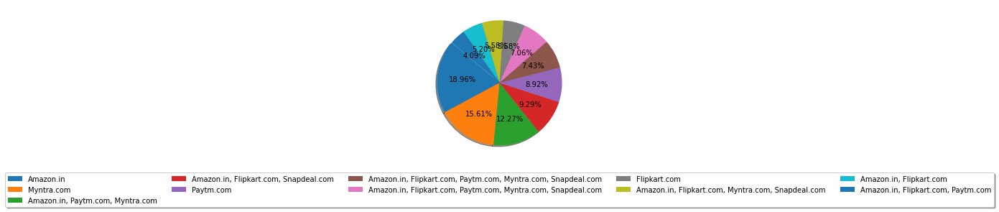

<Figure size 1800x1800 with 0 Axes>

For  Perceived_Trustworthiness  :


([<matplotlib.patches.Wedge at 0x201463531f0>,
 [Text(-1.080317542041897, -0.2071569655033461, ''),
  Text(-0.08057616016521227, -1.0970448862343922, ''),
  Text(0.7545197315208012, -0.8004373646612071, ''),
  Text(1.0989295718987135, -0.048515935593474904, ''),
  Text(0.886719554480389, 0.6509442615939562, ''),
  Text(0.3567073419722233, 1.0405574814411318, ''),
  Text(-0.15012166006441746, 1.0897079825253662, ''),
  Text(-0.49219053587425377, 0.9837420781870699, ''),
  Text(-0.7451204141549744, 0.8091943946972938, '')],
 [Text(-0.5892641138410346, -0.11299470845637058, '28.25%'),
  Text(-0.0439506328173885, -0.5983881197642138, '13.38%'),
  Text(0.41155621719316426, -0.4366021989061129, '13.01%'),
  Text(0.599416130126571, -0.026463237596440852, '11.52%'),
  Text(0.48366521153475756, 0.35506050632397607, '10.04%'),
  Text(0.19456764107575814, 0.5675768080587992, '9.29%'),
  Text(-0.08188454185331862, 0.5943861722865632, '5.58%'),
  Text(-0.2684675650223202, 0.5365865881020381, '4.83%

<Figure size 1800x1800 with 0 Axes>

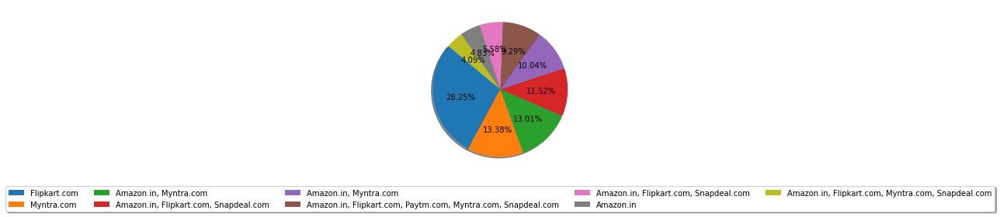

<Figure size 1800x1800 with 0 Axes>

For  MultiChannel_Assistance  :


([<matplotlib.patches.Wedge at 0x2014667e340>,
 [Text(-1.099887940073445, -0.015700932488055284, ''),
  Text(-0.15718852303862516, -1.0887110581898833, ''),
  Text(0.9331553450540475, -0.5824269069995494, ''),
  Text(1.0778245907544817, 0.21975930370506308, ''),
  Text(0.8135317652743945, 0.7403823788351042, ''),
  Text(0.45222994863118154, 1.002740282207232, ''),
  Text(0.08057626287796704, 1.0970448786903026, ''),
  Text(-0.2760743631582076, 1.0647924426886164, ''),
  Text(-0.5708793642623089, 0.9402641923733256, ''),
  Text(-0.7730083927927411, 0.7825969746120818, '')],
 [Text(-0.5999388764036971, -0.0085641449934847, '22.68%'),
  Text(-0.08573919438470462, -0.5938423953763, '22.30%'),
  Text(0.5089938245749349, -0.317687403817936, '14.50%'),
  Text(0.5879043222297172, 0.11986871111185257, '9.67%'),
  Text(0.4437445992405788, 0.40384493391005677, '7.43%'),
  Text(0.24667088107155355, 0.5469492448403083, '5.58%'),
  Text(0.04395068884252747, 0.5983881156492559, '5.58%'),
  Text(-0.15

<Figure size 1800x1800 with 0 Axes>

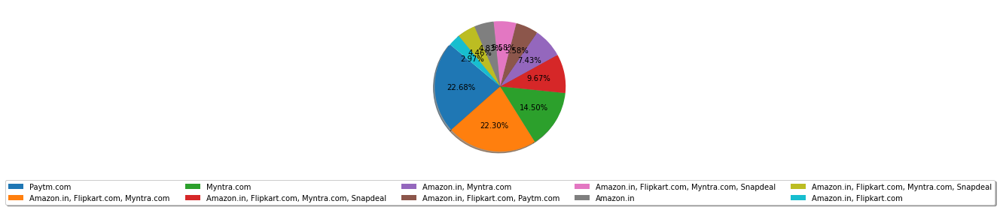

<Figure size 1800x1800 with 0 Axes>

For  Long_LoginTime  :


([<matplotlib.patches.Wedge at 0x201452b0e80>,
 [Text(-1.099421218544632, 0.03567890432505907, ''),
  Text(-0.5213273218380253, -0.9686164480872664, ''),
  Text(0.4221054863817164, -1.0157888355196936, ''),
  Text(1.0426226636416855, -0.3506251292487703, ''),
  Text(1.0030334354769297, 0.45157936989564545, ''),
  Text(0.5438074853604192, 0.9561764580170219, ''),
  Text(0.054932143514475, 1.0986275345215526, ''),
  Text(-0.30086792070102586, 1.058054107450579, ''),
  Text(-0.5818214738080671, 0.9335329520781839, ''),
  Text(-0.7730085210187596, 0.782596847957101, '')],
 [Text(-0.5996843010243447, 0.019461220540941307, '21.19%'),
  Text(-0.2843603573661956, -0.5283362444112362, '14.13%'),
  Text(0.23023935620820893, -0.5540666375561963, '14.13%'),
  Text(0.5687032710772829, -0.19125007049932927, '13.01%'),
  Text(0.5471091466237797, 0.2463160199430793, '10.78%'),
  Text(0.29662226474204684, 0.5215507952820119, '9.29%'),
  Text(0.029962987371531816, 0.5992513824663014, '5.58%'),
  Text(-0

<Figure size 1800x1800 with 0 Axes>

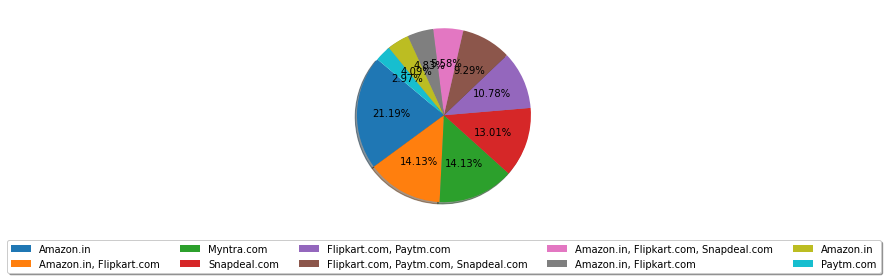

<Figure size 1800x1800 with 0 Axes>

For  LongPhoto_DisplayTime  :


([<matplotlib.patches.Wedge at 0x201450ce1c0>,
 [Text(-1.0999962954544997, -0.002854818098798089, ''),
  Text(-0.44048855663882497, -1.0079532883374331, ''),
  Text(0.4806681859459321, -0.9894231122322982, ''),
  Text(1.0466463213888737, -0.3384249960081834, ''),
  Text(1.0230271225502507, 0.4042468386104643, ''),
  Text(0.6921969033450778, 0.8549055193408716, ''),
  Text(0.30772617881740455, 1.0560798259934894, ''),
  Text(-0.07345683981741791, 1.097544574349506, ''),
  Text(-0.4339396280281544, 1.0107899876961521, ''),
  Text(-0.7260179993611092, 0.8263763456220735, '')],
 [Text(-0.5999979793388179, -0.001557173508435321, '22.30%'),
  Text(-0.24026648543935905, -0.549792702729509, '14.50%'),
  Text(0.2621826468795993, -0.5396853339448898, '13.01%'),
  Text(0.57089799348484, -0.1845954523681, '12.64%'),
  Text(0.5580147941183184, 0.22049827560570776, '9.29%'),
  Text(0.37756194727913334, 0.46631210145865715, '7.06%'),
  Text(0.16785064299131155, 0.5760435414509941, '5.58%'),
  Text(-0

<Figure size 1800x1800 with 0 Axes>

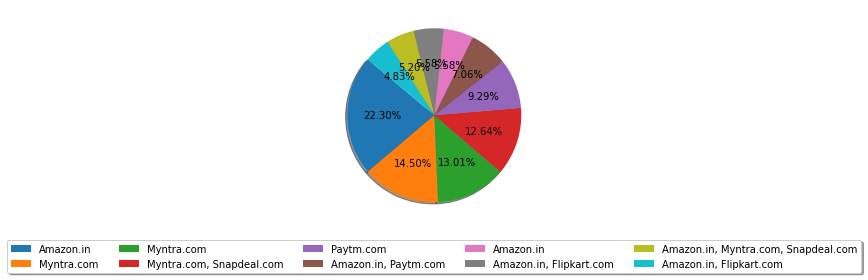

<Figure size 1800x1800 with 0 Axes>

For  LatePrice_Declare  :


([<matplotlib.patches.Wedge at 0x2014525bd30>,
 [Text(-1.0826631608417228, -0.19452629682438885, ''),
  Text(0.09907035641884071, -1.0955295817453055, ''),
  Text(1.0155147895540675, -0.4227643695925166, ''),
  Text(0.9501201329658715, 0.5543209656263373, ''),
  Text(0.1698922160606437, 1.0868011018222257, ''),
  Text(-0.4690804845845648, 0.9949690944858087, ''),
  Text(-0.6866357247306373, 0.8593784856066812, ''),
  Text(-0.7999478187527971, 0.7550387322996366, '')],
 [Text(-0.5905435422773032, -0.10610525281330299, '27.88%'),
  Text(0.054038376228458564, -0.5975615900428939, '19.33%'),
  Text(0.5539171579385822, -0.23059874705046357, '15.24%'),
  Text(0.5182473452541116, 0.30235689034163843, '14.13%'),
  Text(0.09266848148762383, 0.5928006009939412, '14.13%'),
  Text(-0.2558620825006717, 0.5427104151740774, '4.83%'),
  Text(-0.3745285771258021, 0.4687519012400079, '2.60%'),
  Text(-0.436335173865162, 0.41183930852707445, '1.86%')])

<Figure size 1800x1800 with 0 Axes>

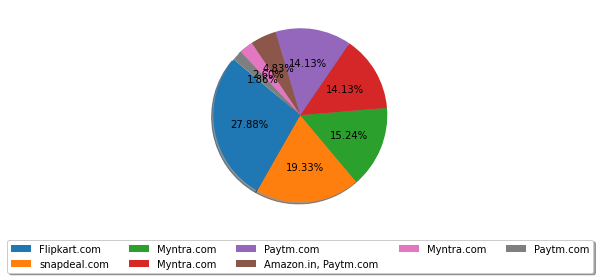

<Figure size 1800x1800 with 0 Axes>

For  Long_LoadingTime  :


([<matplotlib.patches.Wedge at 0x20145062250>,
 [Text(-1.099887940073445, -0.015700932488055284, ''),
  Text(-0.1698923178143055, -1.0868010859157637, ''),
  Text(0.86689971769289, -0.6771151153710777, ''),
  Text(1.0997629190753766, -0.022836852383966905, ''),
  Text(0.9865994647225556, 0.4864375563308892, ''),
  Text(0.7217187846798695, 0.8301337216618854, ''),
  Text(0.3809128824887738, 1.0319425255090973, ''),
  Text(0.016414548879757393, 1.0998775216291468, ''),
  Text(-0.3254970420923156, 1.0507386333380693, ''),
  Text(-0.6034657276013955, 0.9196896844101919, ''),
  Text(-0.7820952823846492, 0.7735159786789644, '')],
 [Text(-0.5999388764036971, -0.0085641449934847, '22.68%'),
  Text(-0.09266853698962117, -0.5928005923176892, '21.93%'),
  Text(0.472854391468849, -0.36933551747513327, '11.90%'),
  Text(0.5998706831320235, -0.01245646493670922, '8.55%'),
  Text(0.5381451625759394, 0.26532957618048497, '6.69%'),
  Text(0.3936647916435651, 0.4528002118155737, '5.95%'),
  Text(0.20777

<Figure size 1800x1800 with 0 Axes>

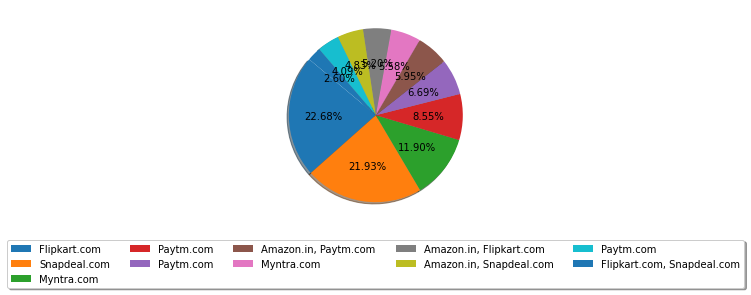

<Figure size 1800x1800 with 0 Axes>

For  Limited_PaymentMode  :


([<matplotlib.patches.Wedge at 0x2014668b2e0>,
 [Text(-1.0448755903197091, -0.3438531674334842, ''),
  Text(0.5150318772561525, -0.9719784799109513, ''),
  Text(1.0999962952540314, 0.0028548953406125946, ''),
  Text(0.8389674150636582, 0.7114307249911291, ''),
  Text(0.2580734881734004, 1.069297935423993, ''),
  Text(-0.25113047920403275, 1.0709498038725966, ''),
  Text(-0.5818214301062354, 0.9335329793152115, ''),
  Text(-0.782095336700992, 0.7735159237601784, '')],
 [Text(-0.5699321401743866, -0.18755627314553683, '32.34%'),
  Text(0.2809264785033559, -0.530170079951428, '23.05%'),
  Text(0.5999979792294716, 0.0015572156403341423, '11.52%'),
  Text(0.4576185900347226, 0.38805312272243403, '10.78%'),
  Text(0.1407673571854911, 0.583253419322178, '9.29%'),
  Text(-0.13698026138401784, 0.5841544384759617, '5.58%'),
  Text(-0.3173571436943102, 0.5091998068992062, '4.83%'),
  Text(-0.4265974563823592, 0.42191777659646096, '2.60%')])

<Figure size 1800x1800 with 0 Axes>

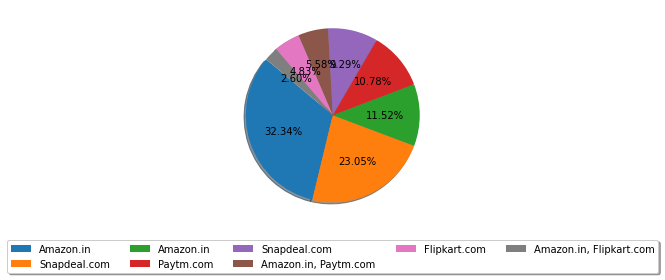

<Figure size 1800x1800 with 0 Axes>

For  Late_Delivery  :


([<matplotlib.patches.Wedge at 0x201463eb490>,
 [Text(-1.0888128165574569, -0.1564821092017168, ''),
  Text(0.17553113638782797, -1.0859046091431779, ''),
  Text(1.087774621516896, -0.16354318323847708, ''),
  Text(0.7689358577118319, 0.7865987838313568, ''),
  Text(0.042098202003718575, 1.0991941327118036, ''),
  Text(-0.5926839431622927, 0.926674561816389, '')],
 [Text(-0.593897899940431, -0.08535387774639096, '26.77%'),
  Text(0.09574425621154252, -0.5923116049871878, '23.79%'),
  Text(0.5933316117364886, -0.08920537267553295, '16.36%'),
  Text(0.4194195587519083, 0.429053882089831, '13.75%'),
  Text(0.022962655638391945, 0.5995604360246201, '9.67%'),
  Text(-0.323282150815796, 0.5054588518998484, '9.67%')])

<Figure size 1800x1800 with 0 Axes>

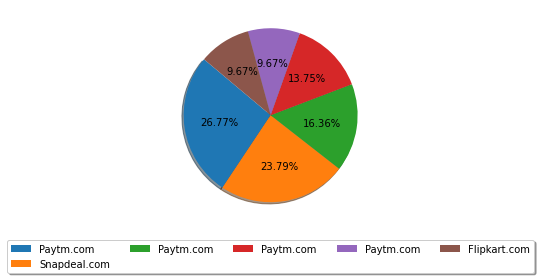

<Figure size 1800x1800 with 0 Axes>

For  ChangeWebApp_Design  :


([<matplotlib.patches.Wedge at 0x201465e2430>,
 [Text(-1.0030334883268128, -0.4515792525071826, ''),
  Text(0.7163175815149944, -0.8347988514681305, ''),
  Text(1.0133067052655529, 0.4280298132885959, ''),
  Text(0.32003867287482907, 1.0524140097245562, ''),
  Text(-0.3132038034619367, 1.054468291366306, ''),
  Text(-0.6353113676502723, 0.8979863396145515, ''),
  Text(-0.7820952914373728, 0.773515969525834, '')],
 [Text(-0.5471091754509887, -0.24631595591300864, '35.69%'),
  Text(0.3907186808263605, -0.4553448280735256, '23.42%'),
  Text(0.5527127483266651, 0.233470807248325, '16.73%'),
  Text(0.17456654884081582, 0.5740440053043033, '11.15%'),
  Text(-0.17083843825196546, 0.5751645225634395, '7.43%'),
  Text(-0.34653347326378486, 0.48981073069884623, '2.97%'),
  Text(-0.4265974316931124, 0.4219178015595458, '2.60%')])

<Figure size 1800x1800 with 0 Axes>

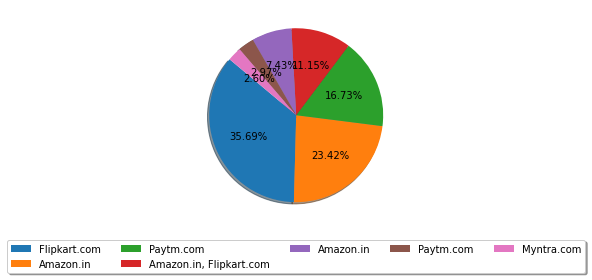

<Figure size 1800x1800 with 0 Axes>

For  Page_Disruption  :


([<matplotlib.patches.Wedge at 0x2014637cfa0>,
 [Text(-1.0965556639895049, 0.08698089314634512, ''),
  Text(-0.45222990168952015, -1.0027403033776427, ''),
  Text(0.7545196565784432, -0.8004374353044392, ''),
  Text(1.0751846224609984, 0.2323317189352342, ''),
  Text(0.6200731960626807, 0.9085753857135975, ''),
  Text(0.0035684946229065846, 1.0999942117330102, ''),
  Text(-0.48066817436637277, 0.9894231178577234, ''),
  Text(-0.7451203005115962, 0.8091944993420981, '')],
 [Text(-0.5981212712670027, 0.04744412353437006, '19.70%'),
  Text(-0.24667085546701095, -0.5469492563878051, '19.33%'),
  Text(0.41155617631551444, -0.43660223743878496, '18.22%'),
  Text(0.5864643395241809, 0.12672639214649137, '14.50%'),
  Text(0.33822174330691673, 0.4955865740255986, '9.67%'),
  Text(0.0019464516124945005, 0.59999684276346, '9.29%'),
  Text(-0.262182640563476, 0.5396853370133036, '5.20%'),
  Text(-0.4064292548245069, 0.44137881782296257, '4.09%')])

<Figure size 1800x1800 with 0 Axes>

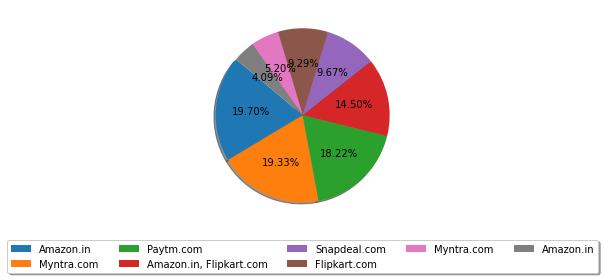

<Figure size 1800x1800 with 0 Axes>

For  WebApp_Efficiency  :


([<matplotlib.patches.Wedge at 0x20144f9e940>,
 [Text(-1.0133067052655529, -0.4280298132885956, ''),
  Text(0.5036455471608275, -0.977926972132925, ''),
  Text(1.0997629217480445, -0.0228367236749225, ''),
  Text(0.7689357656534603, 0.7865988738225645, ''),
  Text(0.2953716634117185, 1.0596016140292515, ''),
  Text(-0.12463008125451802, 1.0929168965875184, ''),
  Text(-0.48066831332108345, 0.9894230503526107, ''),
  Text(-0.7451204141549744, 0.8091943946972938, '')],
 [Text(-0.5527127483266652, -0.23347080724832484, '34.94%'),
  Text(0.274715752996815, -0.5334147120725045, '17.47%'),
  Text(0.5998706845898424, -0.012456394731775908, '16.73%'),
  Text(0.41941950853825105, 0.42905393117594426, '9.29%'),
  Text(0.1611118164063919, 0.577964516743228, '6.69%'),
  Text(-0.06798004432064618, 0.5961364890477372, '5.58%'),
  Text(-0.2621827163569546, 0.5396853001923331, '5.20%'),
  Text(-0.40642931681180416, 0.4413787607439784, '4.09%')])

<Figure size 1800x1800 with 0 Axes>

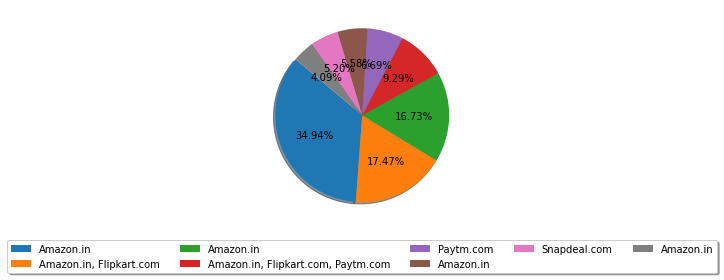

<Figure size 1800x1800 with 0 Axes>

For  Recommendation  :


([<matplotlib.patches.Wedge at 0x20144ca4580>,
 [Text(-1.0723980011996739, -0.2448724709373118, ''),
  Text(0.32549712817240867, -1.0507386066722373, ''),
  Text(1.0954650860416295, -0.09978098648442801, ''),
  Text(0.8306017049389709, 0.7211801493056191, ''),
  Text(0.2953716882134839, 1.0596016071155785, ''),
  Text(-0.15012160905150554, 1.089707989553067, ''),
  Text(-0.49219048982196345, 0.9837421012281704, ''),
  Text(-0.7451203762738503, 0.8091944295788965, '')],
 [Text(-0.5849443642907312, -0.1335668023294428, '29.37%'),
  Text(0.1775438880940411, -0.5731301490939475, '23.05%'),
  Text(0.5975264105681615, -0.05442599262786982, '14.50%'),
  Text(0.4530554754212568, 0.39337099053033764, '11.15%'),
  Text(0.16111182993462755, 0.5779645129721336, '7.43%'),
  Text(-0.08188451402809392, 0.5943861761198547, '5.58%'),
  Text(-0.26846753990288913, 0.536586600669911, '4.83%'),
  Text(-0.4064292961493729, 0.4413787797703072, '4.09%')])

<Figure size 1800x1800 with 0 Axes>

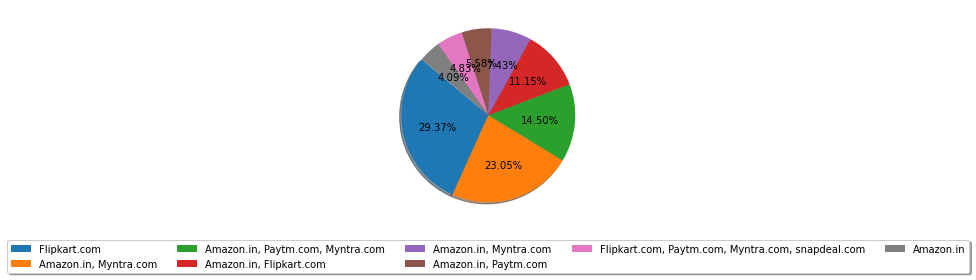

<Figure size 1800x1800 with 0 Axes>

For  Age  :


([<matplotlib.patches.Wedge at 0x20144fe07f0>,
 [Text(-1.0365597423780988, -0.368162872219687, ''),
  Text(0.7545196191072622, -0.8004374706260523, ''),
  Text(0.5438075972650422, 0.9561763943733509, ''),
  Text(-0.6561109472620664, 0.8829034063151382, '')],
 [Text(-0.5653962231153266, -0.20081611211982925, '33.09%'),
  Text(0.4115561558766884, -0.4366022567051194, '30.11%'),
  Text(0.2966223257809321, 0.5215507605672822, '29.37%'),
  Text(-0.35787869850658166, 0.4815836761718935, '7.43%')])

<Figure size 1800x1800 with 0 Axes>

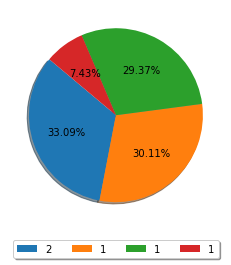

<Figure size 1800x1800 with 0 Axes>

For  Shopping_City  :


([<matplotlib.patches.Wedge at 0x201451a7c70>,
 [Text(-1.099762918540841, 0.02283687812577591, ''),
  Text(-0.2953718618258389, -1.0596015587198508, ''),
  Text(0.8426488543307088, -0.7070664101024344, ''),
  Text(1.0597930073302726, 0.2946842065904738, ''),
  Text(0.5438076867887348, 0.9561763434584049, ''),
  Text(-0.009277956236713127, 1.0999608718168432, ''),
  Text(-0.38626403937243875, 1.0299514997744736, ''),
  Text(-0.6247807953054625, 0.9053446624449022, ''),
  Text(-0.7638160606711425, 0.791571238399184, ''),
  Text(-0.8259051368419376, 0.7265539931334082, '')],
 [Text(-0.5998706828404587, 0.01245647897769595, '21.56%'),
  Text(-0.16111192463227575, -0.5779644865744641, '20.45%'),
  Text(0.4596266478167502, -0.3856725873286006, '15.99%'),
  Text(0.5780689130892396, 0.1607368399584402, '14.87%'),
  Text(0.2966223746120371, 0.5215507327954935, '10.04%'),
  Text(-0.005060703401843523, 0.5999786573546417, '6.69%'),
  Text(-0.21068947602133023, 0.5617917271497128, '4.46%'),
  Text

<Figure size 1800x1800 with 0 Axes>

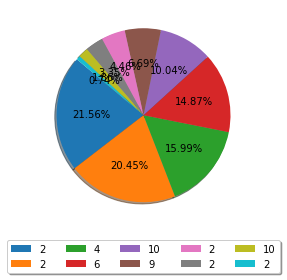

<Figure size 1800x1800 with 0 Axes>

For  PinCode  :


([<matplotlib.patches.Wedge at 0x20144e446d0>,
 [Text(-1.0646130984137048, 0.2767651543926216, ''),
  Text(-1.008238844389623, -0.4398345514666597, ''),
  Text(-0.7313642559093164, -0.8216485411526099, ''),
  Text(-0.3567074515742468, -1.0405574438691054, ''),
  Text(-0.04209815054672692, -1.0991941346825616, ''),
  Text(0.18820098125205867, -1.083780600793243, ''),
  Text(0.41021378449619395, -1.0206491321748676, ''),
  Text(0.6034657652734537, -0.9196896596912053, ''),
  Text(0.7638161625754774, -0.7915711400679487, ''),
  Text(0.8975740129665427, -0.6358937735558798, ''),
  Text(1.0000824865895286, -0.4580775262080707, ''),
  Text(1.064613109750477, -0.2767651107842523, ''),
  Text(1.0954650796188852, -0.09978105699775723, ''),
  Text(1.0970969223681868, 0.07986452861097322, ''),
  Text(1.0723979926021925, 0.2448725085892413, ''),
  Text(1.0276783491343484, 0.39227185818065086, ''),
  Text(0.9689544354606652, 0.5206988592277727, ''),
  Text(0.9016808207887183, 0.6300569001461563, ''

<Figure size 1800x1800 with 0 Axes>

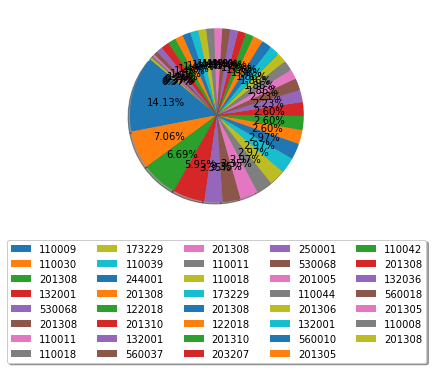

<Figure size 1800x1800 with 0 Axes>

For  Shopping_Since  :


([<matplotlib.patches.Wedge at 0x20146623040>],
 [Text(0.8426488874308756, -0.7070663706551936, '')],
 [Text(0.4596266658713867, -0.3856725658119237, '100.00%')])

<Figure size 1800x1800 with 0 Axes>

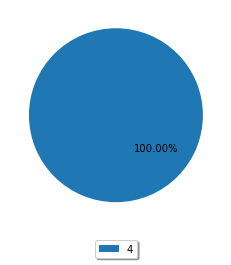

<Figure size 1800x1800 with 0 Axes>

For  Shopping_Frequency  :


([<matplotlib.patches.Wedge at 0x2014532fa90>,
 [Text(-0.8867196458990807, -0.650944137062935, ''),
  Text(0.9946646063278796, -0.4697257933290491, ''),
  Text(0.6720413989611714, 0.8708388818158683, ''),
  Text(-0.32549710357809575, 1.0507386142910475, ''),
  Text(-0.7545197034174183, 0.8004373911524195, '')],
 [Text(-0.4836652613994985, -0.35506043839796453, '42.38%'),
  Text(0.5425443307242979, -0.2562140690885722, '23.42%'),
  Text(0.36656803579700253, 0.475003026445019, '19.70%'),
  Text(-0.1775438746789613, 0.5731301532496622, '10.78%'),
  Text(-0.4115562018640463, 0.43660221335586513, '3.72%')])

<Figure size 1800x1800 with 0 Axes>

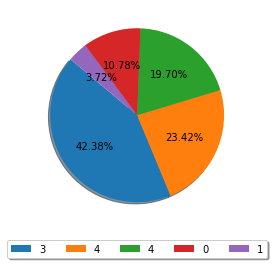

<Figure size 1800x1800 with 0 Axes>

For  TimeSpent_ForPurchase  :


([<matplotlib.patches.Wedge at 0x201452ede20>,
 [Text(-0.8135317479444937, -0.7403823978771895, ''),
  Text(1.0896103790181006, -0.15082845201098924, ''),
  Text(0.3688353870193035, 1.0363206343995668, ''),
  Text(-0.3982660364801244, 1.0253702571200378, ''),
  Text(-0.7163175326653006, 0.834798893384686, '')],
 [Text(-0.4437445897879056, -0.4038449442966488, '45.72%'),
  Text(0.594332934009873, -0.08227006473326684, '26.39%'),
  Text(0.20118293837416554, 0.5652658005815818, '17.10%'),
  Text(-0.21723601989824964, 0.5592928675200206, '5.58%'),
  Text(-0.39071865418107304, 0.4553448509371014, '5.20%')])

<Figure size 1800x1800 with 0 Axes>

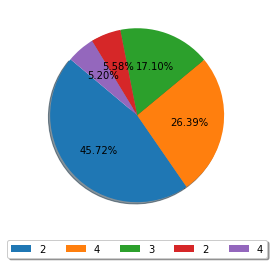

<Figure size 1800x1800 with 0 Axes>

For  Content_Readability  :


([<matplotlib.patches.Wedge at 0x20146be0eb0>,
 [Text(0.6034656737841673, -0.9196897197230276, ''),
  Text(-0.5263479164376381, 0.9658974432421681, ''),
  Text(-0.7820952099628525, 0.7735160519040065, '')],
 [Text(0.32916309479136396, -0.5016489380307423, '90.71%'),
  Text(-0.28709886351143893, 0.5268531508593643, '6.69%'),
  Text(-0.426597387252465, 0.42191784649309444, '2.60%')])

<Figure size 1800x1800 with 0 Axes>

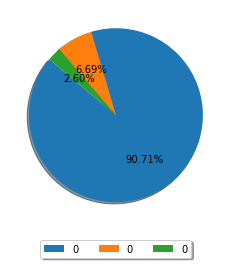

<Figure size 1800x1800 with 0 Axes>

For  Similar_ProductInfo  :


([<matplotlib.patches.Wedge at 0x201465e3af0>,
 [Text(0.17553108555296476, -1.0859046173603821, ''),
  Text(0.05493240066680606, 1.0986275216637265, ''),
  Text(-0.6765524474869855, 0.8673389105761196, '')],
 [Text(0.0957442284834353, -0.5923116094692993, '77.32%'),
  Text(0.029963127636439667, 0.5992513754529416, '15.99%'),
  Text(-0.3690286077201739, 0.47309395122333786, '6.69%')])

<Figure size 1800x1800 with 0 Axes>

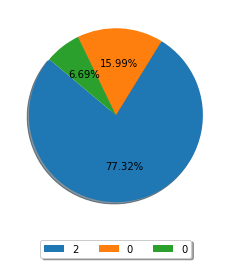

<Figure size 1800x1800 with 0 Axes>

For  Seller_ProductInfo  :


([<matplotlib.patches.Wedge at 0x2014519d820>,
 [Text(-0.08057616016521227, -1.0970448862343922, ''),
  Text(0.4404884150817248, 1.0079533501996956, ''),
  Text(-0.5598596881625563, 0.9468670073302404, '')],
 [Text(-0.0439506328173885, -0.5983881197642138, '69.89%'),
  Text(0.24026640822639533, 0.5497927364725612, '19.33%'),
  Text(-0.30537801172503065, 0.5164729130892219, '10.78%')])

<Figure size 1800x1800 with 0 Axes>

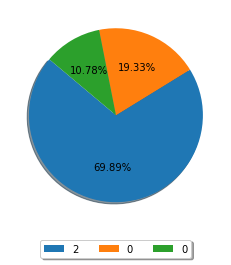

<Figure size 1800x1800 with 0 Axes>

For  ProductInfo_Clarity  :


([<matplotlib.patches.Wedge at 0x201450e6190>,
 [Text(0.5487633633924583, -0.9533408472305154, ''),
  Text(-0.5487633633924581, 0.9533408472305155, '')],
 [Text(0.2993254709413409, -0.5200040984893719, '88.85%'),
  Text(-0.29932547094134077, 0.520004098489372, '11.15%')])

<Figure size 1800x1800 with 0 Axes>

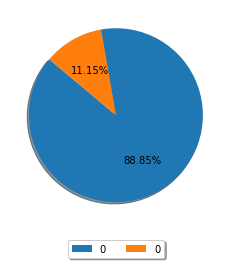

<Figure size 1800x1800 with 0 Axes>

For  Ease_Navigation  :


([<matplotlib.patches.Wedge at 0x2014668aa60>,
 [Text(0.6247808800699454, -0.9053446039486979, ''),
  Text(-0.6247809012610656, 0.9053445893246453, '')],
 [Text(0.3407895709472429, -0.4938243294265624, '91.45%'),
  Text(-0.3407895825060357, 0.4938243214498065, '8.55%')])

<Figure size 1800x1800 with 0 Axes>

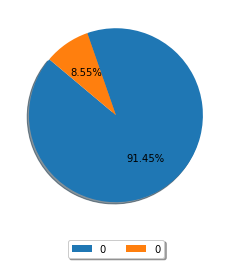

<Figure size 1800x1800 with 0 Axes>

For  Loading_ProcessingSpeed  :


([<matplotlib.patches.Wedge at 0x20146510a90>,
 [Text(0.4102137128261415, -1.020649160980105, ''),
  Text(-0.26362034267666884, 1.0679439661925318, ''),
  Text(-0.735619258724866, 0.817841247549351, '')],
 [Text(0.22375293426880444, -0.5567177241709662, '84.39%'),
  Text(-0.14379291418727388, 0.5825148906504719, '11.15%'),
  Text(-0.40124686839538143, 0.44609522593600953, '4.46%')])

<Figure size 1800x1800 with 0 Axes>

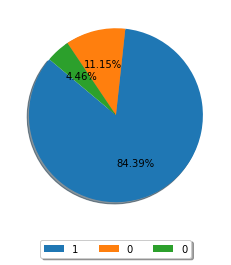

<Figure size 1800x1800 with 0 Axes>

For  UserFriendly_Interface  :


([<matplotlib.patches.Wedge at 0x2014512ba60>,
 [Text(0.49219038620430494, -0.9837421530706395, ''),
  Text(-0.4339395925392832, 1.0107900029317864, ''),
  Text(-0.7999477745704039, 0.7550387791099595, '')],
 [Text(0.2684674833841663, -0.5365866289476214, '86.99%'),
  Text(-0.23669432320324535, 0.5513400015991562, '11.15%'),
  Text(-0.4363351497656748, 0.41183933405997786, '1.86%')])

<Figure size 1800x1800 with 0 Axes>

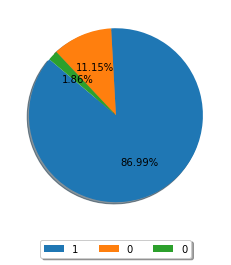

<Figure size 1800x1800 with 0 Axes>

For  Conveninet_PaymentMode  :


([<matplotlib.patches.Wedge at 0x20144f07610>,
 [Text(0.5487633633924583, -0.9533408472305154, ''),
  Text(-0.5487633633924581, 0.9533408472305155, '')],
 [Text(0.2993254709413409, -0.5200040984893719, '88.85%'),
  Text(-0.29932547094134077, 0.520004098489372, '11.15%')])

<Figure size 1800x1800 with 0 Axes>

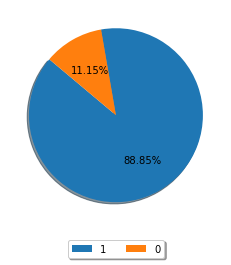

<Figure size 1800x1800 with 0 Axes>

For  TimelyFulfilment_Trust  :


([<matplotlib.patches.Wedge at 0x20144edbbb0>,
 [Text(0.4102137128261415, -1.020649160980105, ''),
  Text(-0.26362034267666884, 1.0679439661925318, ''),
  Text(-0.735619258724866, 0.817841247549351, '')],
 [Text(0.22375293426880444, -0.5567177241709662, '84.39%'),
  Text(-0.14379291418727388, 0.5825148906504719, '11.15%'),
  Text(-0.40124686839538143, 0.44609522593600953, '4.46%')])

<Figure size 1800x1800 with 0 Axes>

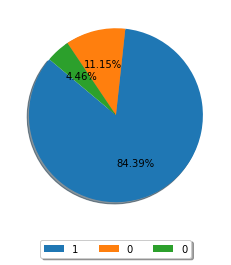

<Figure size 1800x1800 with 0 Axes>

For  Customer_Empathy  :


([<matplotlib.patches.Wedge at 0x20144e5fee0>,
 [Text(0.5150319227577488, -0.9719784558005679, ''),
  Text(-0.33774608162798586, 1.0468655999434415, ''),
  Text(-0.7065196497421234, 0.8431073386753714, '')],
 [Text(0.2809265033224084, -0.5301700668003096, '87.73%'),
  Text(-0.18422513543344682, 0.5710175999691499, '6.69%'),
  Text(-0.38537435440479456, 0.45987673018656616, '5.58%')])

<Figure size 1800x1800 with 0 Axes>

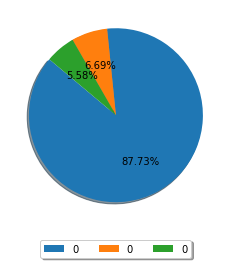

<Figure size 1800x1800 with 0 Axes>

For  CustPrivacy_Guarantee  :


([<matplotlib.patches.Wedge at 0x20144c93250>,
 [Text(0.5926838780911398, -0.9266746034346939, ''),
  Text(-0.5926838130199853, 0.9266746450529935, '')],
 [Text(0.32328211532243983, -0.5054588746007421, '90.33%'),
  Text(-0.32328207982908286, 0.5054588973016327, '9.67%')])

<Figure size 1800x1800 with 0 Axes>

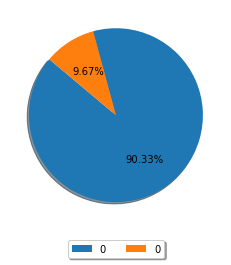

<Figure size 1800x1800 with 0 Axes>

For  VariousChannel_Responses  :


([<matplotlib.patches.Wedge at 0x201451ca9a0>,
 [Text(0.5926838780911398, -0.9266746034346939, ''),
  Text(-0.4690802400507614, 0.9949692097718, ''),
  Text(-0.7451201679276374, 0.809194621427682, '')],
 [Text(0.32328211532243983, -0.5054588746007421, '90.33%'),
  Text(-0.25586194911859705, 0.5427104780573454, '5.58%'),
  Text(-0.406429182505984, 0.4413788844150992, '4.09%')])

<Figure size 1800x1800 with 0 Axes>

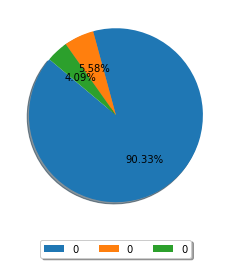

<Figure size 1800x1800 with 0 Axes>

For  Benefit_Discount  :


([<matplotlib.patches.Wedge at 0x201463e6940>,
 [Text(-0.05493234923634035, -1.0986275242352965, ''),
  Text(0.4168272863840322, 1.0179661160007853, ''),
  Text(-0.559859510858372, 0.9468671121659177, '')],
 [Text(-0.029963099583458365, -0.5992513768556161, '70.63%'),
  Text(0.2273603380276539, 0.5552542450913374, '18.59%'),
  Text(-0.3053779150136574, 0.5164729702723186, '10.78%')])

<Figure size 1800x1800 with 0 Axes>

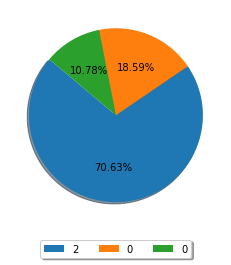

<Figure size 1800x1800 with 0 Axes>

For  Enjoy_OnlineShopping  :


([<matplotlib.patches.Wedge at 0x201463fb0d0>,
 [Text(-0.5986838389851254, -0.9228096558543547, ''),
  Text(1.0030334460469077, 0.4515793464179527, ''),
  Text(-0.32549712817240856, 1.0507386066722373, '')],
 [Text(-0.3265548212646139, -0.5033507213751025, '53.90%'),
  Text(0.5471091523892223, 0.24631600713706508, '27.88%'),
  Text(-0.177543888094041, 0.5731301490939475, '18.22%')])

<Figure size 1800x1800 with 0 Axes>

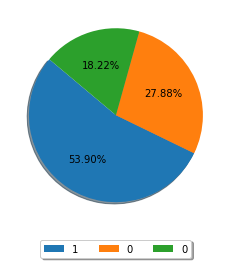

<Figure size 1800x1800 with 0 Axes>

For  Convenience_Flexibility  :


([<matplotlib.patches.Wedge at 0x2014657e280>,
 [Text(0.37420955218693275, -1.0343921940212306, ''),
  Text(-0.22604955426963388, 1.076522920803129, ''),
  Text(-0.7356194118685021, 0.8178411098020442, '')],
 [Text(0.2041143011928724, -0.5642139240115803, '83.27%'),
  Text(-0.12329975687434575, 0.5871943204380703, '12.27%'),
  Text(-0.4012469519282738, 0.446095150801115, '4.46%')])

<Figure size 1800x1800 with 0 Axes>

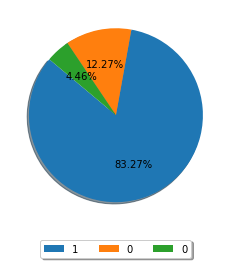

<Figure size 1800x1800 with 0 Axes>

For  Returns_ReplacementPolicy  :


([<matplotlib.patches.Wedge at 0x20146369c10>,
 [Text(0.6561108439328339, -0.8829034831020572, ''),
  Text(-0.6561107819352895, 0.8829035291742032, '')],
 [Text(0.3578786421451821, -0.4815837180556675, '92.57%'),
  Text(-0.3578786083283397, 0.481583743185929, '7.43%')])

<Figure size 1800x1800 with 0 Axes>

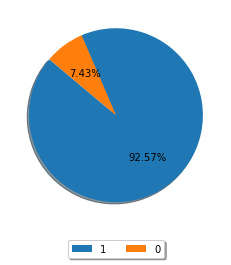

<Figure size 1800x1800 with 0 Axes>

For  Loyalty_ProgramAccess  :


([<matplotlib.patches.Wedge at 0x20144e79610>,
 [Text(-0.1952287126156068, -1.0825367198254536, ''),
  Text(0.5099798257602342, 0.9746386906528807, ''),
  Text(-0.5926838997815238, 0.9266745895619265, '')],
 [Text(-0.10648838869942188, -0.5904745744502474, '66.54%'),
  Text(0.2781708140510368, 0.5316211039924803, '23.79%'),
  Text(-0.32328212715355836, 0.5054588670337781, '9.67%')])

<Figure size 1800x1800 with 0 Axes>

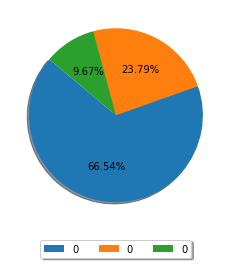

<Figure size 1800x1800 with 0 Axes>

For  QualityInfo_Satisfaction  :


([<matplotlib.patches.Wedge at 0x20145267430>,
 [Text(0.23860606246459157, -1.073809641861696, ''),
  Text(-0.2386060121959335, 1.0738096530316508, '')],
 [Text(0.13014876134432266, -0.5857143501063795, '79.18%'),
  Text(-0.1301487339250546, 0.5857143561990822, '20.82%')])

<Figure size 1800x1800 with 0 Axes>

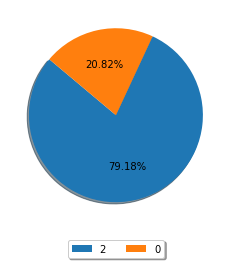

<Figure size 1800x1800 with 0 Axes>

For  WebsiteQuality_Satisfaction  :


([<matplotlib.patches.Wedge at 0x20144c7dd30>,
 [Text(0.7730083515772306, -0.7825970153226071, ''),
  Text(-0.773008301202715, 0.7825970650799126, '')],
 [Text(0.4216409190421257, -0.42687109926687655, '97.03%'),
  Text(-0.42164089156511725, 0.42687112640722497, '2.97%')])

<Figure size 1800x1800 with 0 Axes>

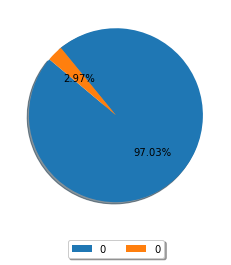

<Figure size 1800x1800 with 0 Axes>

For  NetBenefit_Satisfaction  :


([<matplotlib.patches.Wedge at 0x2014668b370>,
 [Text(0.3008678587871663, -1.058054125056382, ''),
  Text(-0.16283757935507828, 1.0878804726392413, ''),
  Text(-0.7451203952144119, 0.8091944121380961, '')],
 [Text(0.16410974115663615, -0.5771204318489355, '81.04%'),
  Text(-0.0888204978300427, 0.5933893487123133, '14.87%'),
  Text(-0.4064293064805882, 0.4413787702571433, '4.09%')])

<Figure size 1800x1800 with 0 Axes>

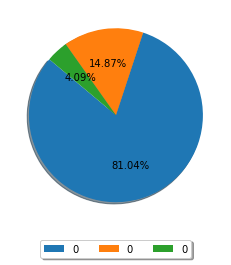

<Figure size 1800x1800 with 0 Axes>

For  User_Trust  :


([<matplotlib.patches.Wedge at 0x20145305040>,
 [Text(0.5487633633924583, -0.9533408472305154, ''),
  Text(-0.4921903631781572, 0.9837421645911869, ''),
  Text(-0.7999477392244859, 0.7550388165582178, '')],
 [Text(0.2993254709413409, -0.5200040984893719, '88.85%'),
  Text(-0.26846747082444933, 0.5365866352315565, '9.29%'),
  Text(-0.4363351304860832, 0.41183935448630055, '1.86%')])

<Figure size 1800x1800 with 0 Axes>

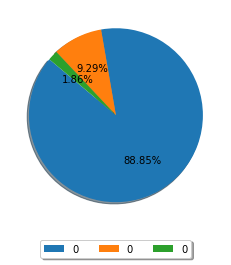

<Figure size 1800x1800 with 0 Axes>

For  Product_SeveralCategory  :


([<matplotlib.patches.Wedge at 0x20145298520>,
 [Text(0.1373851120963731, -1.0913868841864773, ''),
  Text(-0.04780319757746746, 1.098960806535597, ''),
  Text(-0.7820953548064378, 0.7735159054539167, '')],
 [Text(0.07493733387074895, -0.5953019368289876, '76.21%'),
  Text(-0.02607447140589134, 0.5994331672012346, '21.19%'),
  Text(-0.4265974662580569, 0.4219177666112272, '2.60%')])

<Figure size 1800x1800 with 0 Axes>

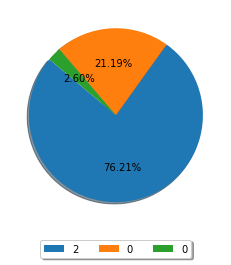

<Figure size 1800x1800 with 0 Axes>

For  Relevant_ProductInfo  :


([<matplotlib.patches.Wedge at 0x201452db7c0>,
 [Text(0.48066813962769245, -0.9894231347339991, ''),
  Text(-0.4221054150529541, 1.015788865159967, ''),
  Text(-0.7999477392244859, 0.7550388165582178, '')],
 [Text(0.2621826216151049, -0.5396853462185449, '86.62%'),
  Text(-0.23023931730161132, 0.5540666537236183, '11.52%'),
  Text(-0.4363351304860832, 0.41183935448630055, '1.86%')])

<Figure size 1800x1800 with 0 Axes>

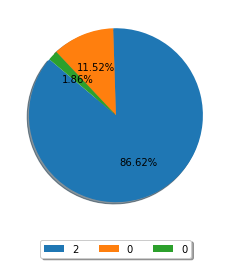

<Figure size 1800x1800 with 0 Axes>

For  Monetary_Savings  :


([<matplotlib.patches.Wedge at 0x20145004e80>,
 [Text(0.3621038325175445, -1.0386918765813595, ''),
  Text(-0.17553126347498607, 1.0859045886001566, ''),
  Text(-0.70651961027342, 0.8431073717499419, '')],
 [Text(0.19751118137320609, -0.5665592054080143, '82.90%'),
  Text(-0.09574432553181057, 0.5923115937819035, '11.52%'),
  Text(-0.38537433287641093, 0.45987674822724095, '5.58%')])

<Figure size 1800x1800 with 0 Axes>

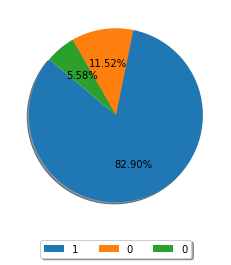

<Figure size 1800x1800 with 0 Axes>

For  Patronizing_Convenience  :


([<matplotlib.patches.Wedge at 0x2014642a610>,
 [Text(-0.029258364317942105, -1.0996108166608032, ''),
  Text(0.029258364317942237, 1.0996108166608032, '')],
 [Text(-0.0159591078097866, -0.5997877181786199, '71.38%'),
  Text(0.015959107809786672, 0.5997877181786199, '28.62%')])

<Figure size 1800x1800 with 0 Axes>

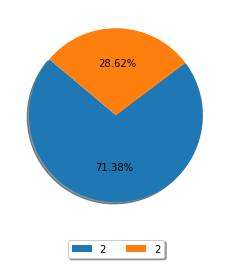

<Figure size 1800x1800 with 0 Axes>

For  Adventure_Sense  :


([<matplotlib.patches.Wedge at 0x20144f9e280>,
 [Text(-0.48707758234557924, -0.9862836451936053, ''),
  Text(0.9808513205181366, 0.4979263871676493, ''),
  Text(-0.25113037893447365, 1.0709498273851246, '')],
 [Text(-0.2656786812794068, -0.5379728973783301, '57.62%'),
  Text(0.5350098111917108, 0.2715962111823541, '21.93%'),
  Text(-0.13698020669153105, 0.584154451300977, '20.45%')])

<Figure size 1800x1800 with 0 Axes>

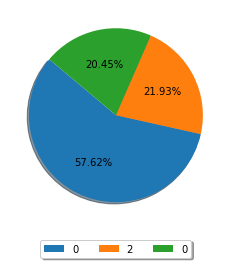

<Figure size 1800x1800 with 0 Axes>

For  Enhances_SocialStatus  :


([<matplotlib.patches.Wedge at 0x20145094160>,
 [Text(-0.9369145968956428, -0.5763601635469573, ''),
  Text(1.0836582768167131, -0.1889040473008246, ''),
  Text(-0.16283747750035785, 1.0878804878851907, '')],
 [Text(-0.5110443255794415, -0.314378271025613, '39.78%'),
  Text(0.5910863328091162, -0.10303857125499523, '37.17%'),
  Text(-0.08882044227292246, 0.5933893570282858, '23.05%')])

<Figure size 1800x1800 with 0 Axes>

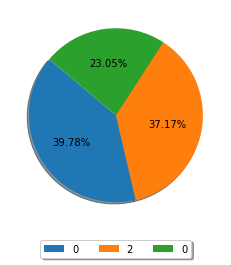

<Figure size 1800x1800 with 0 Axes>

For  Gratification_Shopping  :


([<matplotlib.patches.Wedge at 0x20144f22af0>,
 [Text(-0.7689358945351775, -0.7865987478348707, ''),
  Text(1.04078866067094, 0.3560322510936213, ''),
  Text(-0.4339394505837935, 1.010790063874312, '')],
 [Text(-0.4194195788373695, -0.42905386245538396, '47.58%'),
  Text(0.5677029058205126, 0.19419940968742977, '37.55%'),
  Text(-0.23669424577297826, 0.5513400348405337, '14.87%')])

<Figure size 1800x1800 with 0 Axes>

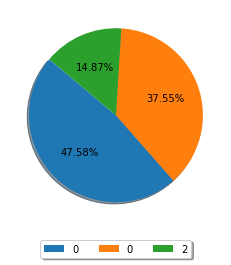

<Figure size 1800x1800 with 0 Axes>

For  Role_Fulfilment  :


([<matplotlib.patches.Wedge at 0x2014663e640>,
 [Text(-0.7870974855441215, -0.7684253693431272, ''),
  Text(1.0905660337600278, 0.14375578600154587, ''),
  Text(-0.25113047920403275, 1.0709498038725966, '')],
 [Text(-0.42932590120588443, -0.41914111055079667, '46.84%'),
  Text(0.5948542002327424, 0.0784122469099341, '32.71%'),
  Text(-0.13698026138401784, 0.5841544384759617, '20.45%')])

<Figure size 1800x1800 with 0 Axes>

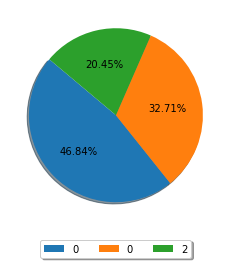

<Figure size 1800x1800 with 0 Axes>

For  Money_Worthy  :


([<matplotlib.patches.Wedge at 0x2014651d070>,
 [Text(0.45742854743821504, -1.000379489987957, ''),
  Text(-0.45742850060707113, 1.0003795114017315, '')],
 [Text(0.24950648042084453, -0.545661539993431, '85.87%'),
  Text(-0.24950645487658424, 0.5456615516736717, '14.13%')])

<Figure size 1800x1800 with 0 Axes>

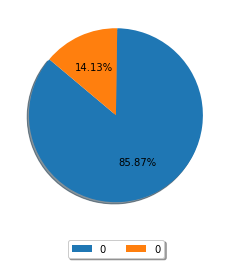

In [41]:
# Pie Plots
  
for i in new_data:
    plt.figure(figsize=(25,25)) 
    fig, ax = plt.subplots()
    print("For ",i," :")
    ax.pie(new_data[i].value_counts(), explode= None, autopct='%1.2f%%', shadow=True, startangle=140)
    
# Shrink current axis's height by 10% on the bottom
    box = ax.get_position()
    ax.set_position([box.x0, box.y0 + box.height * 0.5,box.width, box.height *2])

# Put a legend below current axis
    ax.legend(data[i],loc='upper center', bbox_to_anchor=(0.5, -0.05),fancybox=True, shadow=True, ncol=5)

# Remove patches
    ax.patches.pop()
    
    plt.show()

<Figure size 1800x1800 with 0 Axes>

For  Gender  :


([<matplotlib.patches.Wedge at 0x201465dba30>,
 [Text(-0.16989226693747422, -1.086801093868996, ''),
  Text(0.16989216518381167, 1.0868011097754533, '')],
 [Text(-0.09266850923862228, -0.592800596655816, '67.29%'),
  Text(0.09266845373662454, 0.5928006053320654, '32.71%')])

<Figure size 1800x1800 with 0 Axes>

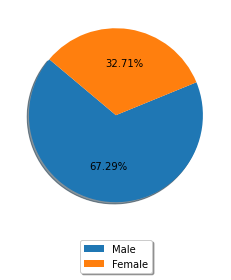

<Figure size 1800x1800 with 0 Axes>

For  Internet_Access  :


([<matplotlib.patches.Wedge at 0x201464f63a0>,
 [Text(-0.06775897834398494, -1.097911071468805, ''),
  Text(0.11895549947412869, 1.0935490794403608, ''),
  Text(-0.8087108625744557, 0.7456451842224155, '')],
 [Text(-0.03695944273308269, -0.59886058443753, '70.26%'),
  Text(0.06488481789497927, 0.5964813160583786, '28.25%'),
  Text(-0.44111501594970304, 0.4067155550304084, '1.49%')])

<Figure size 1800x1800 with 0 Axes>

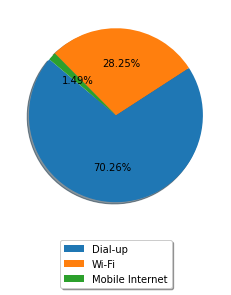

<Figure size 1800x1800 with 0 Axes>

For  Device_Used  :


([<matplotlib.patches.Wedge at 0x201451a0940>,
 [Text(-0.6411243122366016, -0.8938454095978481, ''),
  Text(0.9865995558096801, 0.48643737158666395, ''),
  Text(-0.2636201427004038, 1.0679440155563487, ''),
  Text(-0.7356191055812056, 0.8178413852966279, '')],
 [Text(-0.34970417031087353, -0.48755204159882615, '52.42%'),
  Text(0.5381452122598254, 0.26532947541090757, '31.97%'),
  Text(-0.14379280510931114, 0.5825149175761901, '11.15%'),
  Text(-0.4012467848624757, 0.44609530107088785, '4.46%')])

<Figure size 1800x1800 with 0 Axes>

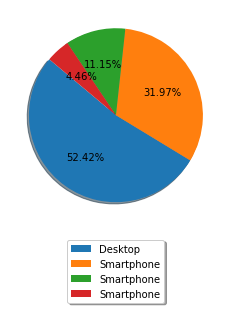

<Figure size 1800x1800 with 0 Axes>

For  Screen_Size  :


([<matplotlib.patches.Wedge at 0x20144e2ceb0>,
 [Text(-0.7119748577019501, -0.8385056958663358, ''),
  Text(0.9922130668218323, 0.4748823328236314, ''),
  Text(-0.3982660604806461, 1.0253702477979487, ''),
  Text(-0.782095246173751, 0.773516015291487, '')],
 [Text(-0.38834992238288185, -0.4573667431998195, '49.81%'),
  Text(0.541207127357363, 0.259026726994708, '36.80%'),
  Text(-0.2172360329894433, 0.5592928624352447, '10.78%'),
  Text(-0.42659740700386417, 0.4219178265226292, '2.60%')])

<Figure size 1800x1800 with 0 Axes>

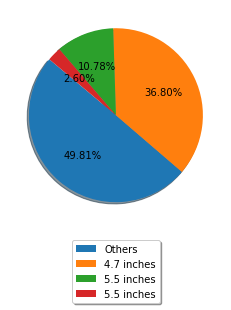

<Figure size 1800x1800 with 0 Axes>

For  Operating_System  :


([<matplotlib.patches.Wedge at 0x20145027f10>,
 [Text(-0.8221228599292508, -0.7308310360006269, ''),
  Text(1.0999962954544997, 0.002854818098797954, ''),
  Text(-0.16283747750035785, 1.0878804878851907, '')],
 [Text(-0.4484306508705004, -0.3986351105457965, '45.35%'),
  Text(0.5999979793388179, 0.0015571735084352475, '31.60%'),
  Text(-0.08882044227292246, 0.5933893570282858, '23.05%')])

<Figure size 1800x1800 with 0 Axes>

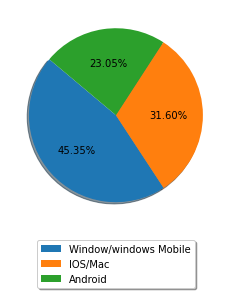

<Figure size 1800x1800 with 0 Axes>

For  Browser_Used  :


([<matplotlib.patches.Wedge at 0x201450aefa0>,
 [Text(0.2760744005431055, -1.0647924329956358, ''),
  Text(-0.11185779599245929, 1.0942978723710055, ''),
  Text(-0.6765525540700257, 0.8673388274378849, ''),
  Text(-0.7999477480609662, 0.7550388071961527, '')],
 [Text(0.15058603665987572, -0.580795872543074, '80.30%'),
  Text(-0.06101334326861415, 0.596889748566003, '14.87%'),
  Text(-0.3690286658563776, 0.4730939058752099, '2.97%'),
  Text(-0.43633513530598156, 0.4118393493797196, '1.86%')])

<Figure size 1800x1800 with 0 Axes>

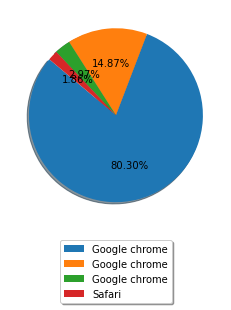

<Figure size 1800x1800 with 0 Axes>

For  Channel_FirstUsed  :


([<matplotlib.patches.Wedge at 0x2014649bbe0>,
 [Text(0.44571455985879294, -1.0056532857450835, ''),
  Text(-0.21346193810851974, 1.0790894314091648, ''),
  Text(-0.6663773153187421, 0.8751807091273127, '')],
 [Text(0.24311703265025067, -0.5485381558609546, '85.50%'),
  Text(-0.11643378442282894, 0.5885942353140898, '7.43%'),
  Text(-0.36347853562840476, 0.47737129588762506, '7.06%')])

<Figure size 1800x1800 with 0 Axes>

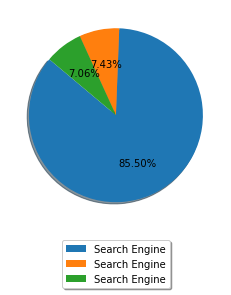

<Figure size 1800x1800 with 0 Axes>

For  Login_Mode  :


([<matplotlib.patches.Wedge at 0x2014644ef70>,
 [Text(-1.0448755903197091, -0.3438531674334842, ''),
  Text(0.7638161116233112, -0.7915711892335683, ''),
  Text(0.5769679339503232, 0.9365404439708388, ''),
  Text(-0.50364550138076, 0.9779269957102744, ''),
  Text(-0.773008447746752, 0.7825969203313781, '')],
 [Text(-0.5699321401743866, -0.18755627314553683, '32.34%'),
  Text(0.41662696997635157, -0.43176610321830994, '31.97%'),
  Text(0.3147097821547217, 0.510840242165912, '26.02%'),
  Text(-0.2747157280258691, 0.5334147249328769, '6.69%'),
  Text(-0.4216409714982283, 0.42687104745347887, '2.97%')])

<Figure size 1800x1800 with 0 Axes>

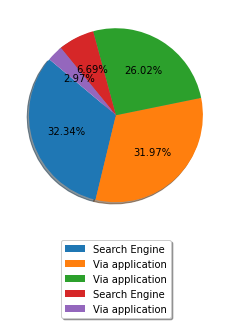

<Figure size 1800x1800 with 0 Axes>

For  Payment_Mode  :


([<matplotlib.patches.Wedge at 0x20146553190>,
 [Text(-0.5659912416148503, -0.9432146703774706, ''),
  Text(0.9628074330248428, 0.5319791790212404, ''),
  Text(-0.37420945534014344, 1.0343922290572534, '')],
 [Text(-0.3087224954262819, -0.5144807292968021, '55.02%'),
  Text(0.5251676907408233, 0.2901704612843129, '28.25%'),
  Text(-0.20411424836735095, 0.5642139431221381, '16.73%')])

<Figure size 1800x1800 with 0 Axes>

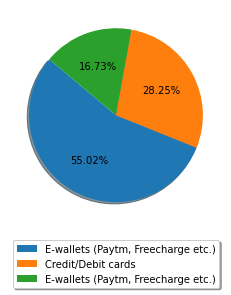

<Figure size 1800x1800 with 0 Axes>

For  Abandon_Frequency  :


([<matplotlib.patches.Wedge at 0x20144cf23a0>,
 [Text(-0.2953719114293669, -1.0596015448924951, ''),
  Text(0.8135318519238901, 0.7403822836246732, ''),
  Text(-0.3377457875840782, 1.0468656948096118, '')],
 [Text(-0.1611119516887456, -0.57796447903227, '63.57%'),
  Text(0.44374464650394, 0.4038448819770944, '18.59%'),
  Text(-0.1842249750458608, 0.5710176517143336, '17.84%')])

<Figure size 1800x1800 with 0 Axes>

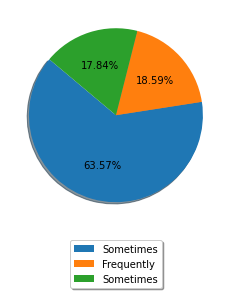

<Figure size 1800x1800 with 0 Axes>

For  Abandon_Reason  :


([<matplotlib.patches.Wedge at 0x20145267910>,
 [Text(-0.7217187555338461, -0.8301337470014556, ''),
  Text(1.0942250819377184, -0.1125676243792754, ''),
  Text(0.6306416458191045, 0.9012719426225202, ''),
  Text(-0.20084513137305132, 1.0815087762952929, ''),
  Text(-0.7163176499045621, 0.8347987927849473, '')],
 [Text(-0.3936647757457342, -0.45280022563715755, '49.44%'),
  Text(0.5968500446933008, -0.061400522388695665, '20.07%'),
  Text(0.34398635226496604, 0.4916028777941019, '13.75%'),
  Text(-0.10955188983984616, 0.5899138779792507, '11.52%'),
  Text(-0.3907187181297611, 0.45534479606451667, '5.20%')])

<Figure size 1800x1800 with 0 Axes>

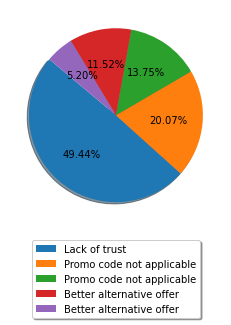

<Figure size 1800x1800 with 0 Axes>

For  Shopped_From  :


([<matplotlib.patches.Wedge at 0x20146510e20>,
 [Text(-1.0631621773570608, -0.2822874149468831, ''),
  Text(0.17553123805755416, -1.085904592708762, ''),
  Text(0.9529846605823196, -0.54938168580214, ''),
  Text(1.080317527495318, 0.2071570413633167, ''),
  Text(0.7313642174451717, 0.8216485753902406, ''),
  Text(0.1952285859226028, 1.0825367426737353, ''),
  Text(-0.2636204551633142, 1.0679439384253684, ''),
  Text(-0.5926840299238232, 0.9266745063253099, ''),
  Text(-0.782095336700992, 0.7735159237601784, '')],
 [Text(-0.5799066421947604, -0.15397495360739077, '30.48%'),
  Text(0.0957443116677568, -0.5923115960229611, '16.36%'),
  Text(0.5198098148630833, -0.29966273771025814, '11.90%'),
  Text(0.5892641059065371, 0.11299474983453636, '10.78%'),
  Text(0.3989259367882754, 0.44817195021285844, '10.04%'),
  Text(0.10648831959414698, 0.5904745869129465, '7.43%'),
  Text(-0.14379297554362594, 0.5825148755047463, '5.95%'),
  Text(-0.32328219814026715, 0.5054588216319872, '4.46%'),
  Text(

<Figure size 1800x1800 with 0 Axes>

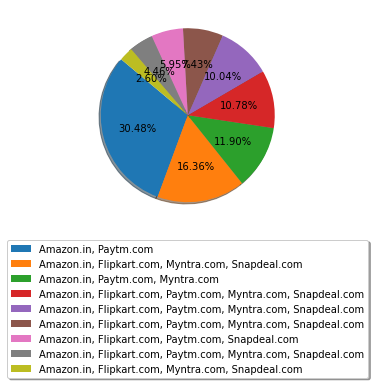

<Figure size 1800x1800 with 0 Axes>

For  Easy_WebApp  :


([<matplotlib.patches.Wedge at 0x201465b0eb0>,
 [Text(-1.0986629368985865, -0.05421947145973387, ''),
  Text(-0.2829771098178365, -1.06297881226257, ''),
  Text(0.7638161486794324, -0.7915711534767543, ''),
  Text(1.0986629330912887, 0.05421954860791923, ''),
  Text(0.8790570762154808, 0.6612553642546052, ''),
  Text(0.4639095428255282, 0.997390563458172, ''),
  Text(-0.02212339909346528, 1.0997775025942982, ''),
  Text(-0.4102138083862115, 1.0206491225731205, ''),
  Text(-0.6353114096880473, 0.8979863098734782, ''),
  Text(-0.7820953276482674, 0.7735159329133106, '')],
 [Text(-0.5992706928537743, -0.029574257159854834, '23.79%'),
  Text(-0.154351150809729, -0.5798066248704927, '16.36%'),
  Text(0.4166269901887813, -0.43176608371459324, '16.36%'),
  Text(0.5992706907770665, 0.02957429924068321, '10.78%'),
  Text(0.4794856779357167, 0.3606847441388755, '8.18%'),
  Text(0.2530415688139244, 0.5440312164317301, '7.43%'),
  Text(-0.012067308596435605, 0.599878637778708, '7.06%'),
  Text(-0.

<Figure size 1800x1800 with 0 Axes>

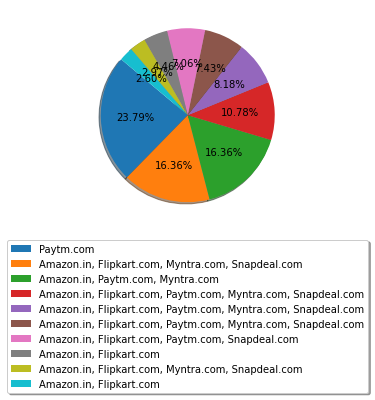

<Figure size 1800x1800 with 0 Axes>

For  Visually_AppealingWebApp  :


([<matplotlib.patches.Wedge at 0x2014526a700>,
 [Text(-1.0448755903197091, -0.3438531674334842, ''),
  Text(0.30086780925607826, -1.0580541391410216, ''),
  Text(1.0297006660001335, -0.38693221426870344, ''),
  Text(1.0526213992760114, 0.31935589831129174, ''),
  Text(0.8389674317158964, 0.7114307053536788, ''),
  Text(0.5438075525031938, 0.956176419830821, ''),
  Text(0.18257288984585235, 1.0847428911467152, ''),
  Text(-0.18820099393591674, 1.083780598590662, ''),
  Text(-0.5036455242707939, 0.9779269839216, ''),
  Text(-0.7451203383927234, 0.8091944644604988, '')],
 [Text(-0.5699321401743866, -0.18755627314553683, '32.34%'),
  Text(0.16410971413967904, -0.5771204395314663, '16.36%'),
  Text(0.5616549087273455, -0.2110539350556564, '13.38%'),
  Text(0.5741571268778243, 0.17419412635161366, '7.43%'),
  Text(0.4576185991177616, 0.3880531120110975, '5.58%'),
  Text(0.29662230136537837, 0.521550774453175, '5.58%'),
  Text(0.09958521264319217, 0.591677940625481, '5.58%'),
  Text(-0.102655

<Figure size 1800x1800 with 0 Axes>

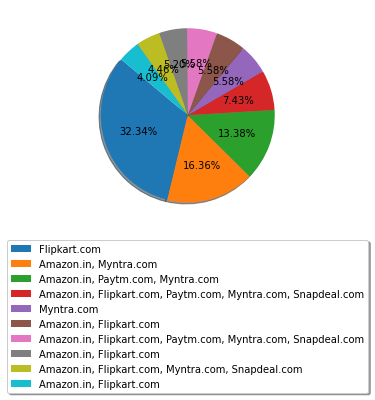

<Figure size 1800x1800 with 0 Axes>

For  Product_Variety  :


([<matplotlib.patches.Wedge at 0x20146b7aeb0>,
 [Text(-0.7503547355117961, -0.8043430679100942, ''),
  Text(1.0505272565689083, -0.3261786062969232, ''),
  Text(0.9976912836322475, 0.4632624553794952, ''),
  Text(0.7313642559093169, 0.8216485411526094, ''),
  Text(0.4049103973288842, 1.0227646699681043, ''),
  Text(0.042098137682479886, 1.0991941351752506, ''),
  Text(-0.3008678464043938, 1.0580541285775422, ''),
  Text(-0.5926840082334419, 0.9266745201980799, ''),
  Text(-0.7820953185955444, 0.7735159420664414, '')],
 [Text(-0.4092844011882524, -0.438732582496415, '48.33%'),
  Text(0.5730148672194044, -0.17791560343468538, '15.99%'),
  Text(0.5441952456175895, 0.25268861202517917, '7.43%'),
  Text(0.39892595776871825, 0.4481719315377869, '5.58%'),
  Text(0.22086021672484588, 0.5578716381644204, '5.58%'),
  Text(0.022962620554079938, 0.5995604373683184, '5.20%'),
  Text(-0.1641097344023966, 0.5771204337695685, '4.83%'),
  Text(-0.32328218630915007, 0.5054588291989526, '4.46%'),
  Text(

<Figure size 1800x1800 with 0 Axes>

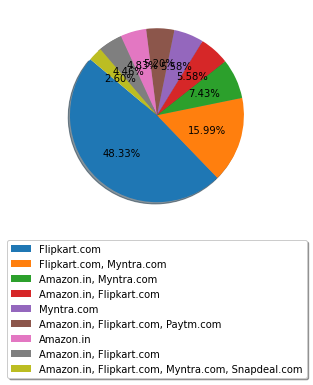

<Figure size 1800x1800 with 0 Axes>

For  Complete_ProductInfo  :


([<matplotlib.patches.Wedge at 0x20144e793d0>,
 [Text(-0.980851297208519, -0.497926433084613, ''),
  Text(0.5926840082334411, -0.9266745201980803, ''),
  Text(1.0736546027441525, -0.23930272461110091, ''),
  Text(1.0526213992760114, 0.31935589831129174, ''),
  Text(0.8389674317158964, 0.7114307053536788, ''),
  Text(0.5438075525031938, 0.956176419830821, ''),
  Text(0.19522862393050358, 1.0825367358192526, ''),
  Text(-0.13738513764212731, 1.0913868809707463, ''),
  Text(-0.42210549826984256, 1.0157888305796476, ''),
  Text(-0.6353114096880473, 0.8979863098734782, ''),
  Text(-0.7820953276482674, 0.7735159329133106, '')],
 [Text(-0.535009798477374, -0.2715962362279707, '37.17%'),
  Text(0.3232821863091497, -0.5054588291989528, '15.99%'),
  Text(0.5856297833149922, -0.13052875887878232, '8.92%'),
  Text(0.5741571268778243, 0.17419412635161366, '7.43%'),
  Text(0.4576185991177616, 0.3880531120110975, '5.58%'),
  Text(0.29662230136537837, 0.521550774453175, '5.58%'),
  Text(0.106488340325

<Figure size 1800x1800 with 0 Axes>

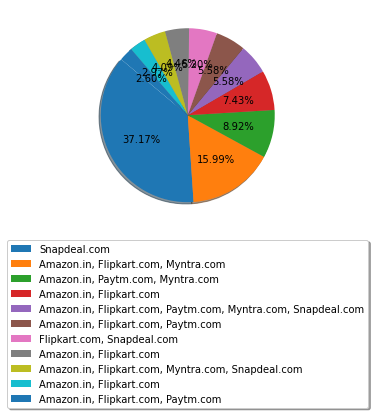

<Figure size 1800x1800 with 0 Axes>

For  Fast_WebApp  :


([<matplotlib.patches.Wedge at 0x20144e514f0>,
 [Text(-1.0942250713983719, 0.11256772682802112, ''),
  Text(-0.5878659765942748, -0.9297384543853502, ''),
  Text(0.3254970789837847, -1.0507386219098565, ''),
  Text(0.9262898614641784, -0.593285001115546, ''),
  Text(1.0905660337600278, 0.14375578600154587, ''),
  Text(0.787097431585238, 0.7684254246131642, ''),
  Text(0.23302914870651445, 1.075033681264507, ''),
  Text(-0.2636204801603468, 1.0679439322548858, ''),
  Text(-0.5708794963131343, 0.9402641121989407, ''),
  Text(-0.773008502700759, 0.7825968660506702, '')],
 [Text(-0.5968500389445665, 0.06140057826982969, '18.96%'),
  Text(-0.3206541690514225, -0.5071300660283727, '16.36%'),
  Text(0.17754386126388255, -0.5731301574053761, '11.15%'),
  Text(0.5052490153440972, -0.32361000060847966, '11.15%'),
  Text(0.5948542002327424, 0.0784122469099341, '11.15%'),
  Text(0.42932587177376613, 0.4191411406980895, '9.29%'),
  Text(0.1271068083853715, 0.5863820079624582, '9.29%'),
  Text(-0.14

<Figure size 1800x1800 with 0 Axes>

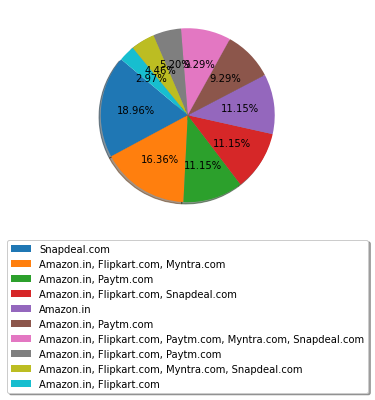

<Figure size 1800x1800 with 0 Axes>

For  Reliable_WebApp  :


([<matplotlib.patches.Wedge at 0x20144cdebb0>,
 [Text(-1.099887940073445, -0.015700932488055284, ''),
  Text(-0.2829771098178365, -1.06297881226257, ''),
  Text(0.7451202910413146, -0.8091945080624972, ''),
  Text(1.0999962953208549, 0.002854869593340398, ''),
  Text(0.8942611976417634, 0.6405442298485868, ''),
  Text(0.5878659330700763, 0.9297384819053414, ''),
  Text(0.23302917386949346, 1.0750336758100658, ''),
  Text(-0.1373851504150035, 1.0913868793628807, ''),
  Text(-0.4690804612956334, 0.9949691054654289, ''),
  Text(-0.7356193352966872, 0.8178411786757012, '')],
 [Text(-0.5999388764036971, -0.0085641449934847, '22.68%'),
  Text(-0.154351150809729, -0.5798066248704927, '18.59%'),
  Text(0.4064292496588988, -0.44137882257954386, '13.38%'),
  Text(0.5999979792659207, 0.0015572015963674897, '13.01%'),
  Text(0.48777883507732545, 0.3493877617355928, '6.69%'),
  Text(0.32065414531095066, 0.507130081039277, '5.58%'),
  Text(0.1271068221106328, 0.5863820049873085, '5.58%'),
  Text(-0.

<Figure size 1800x1800 with 0 Axes>

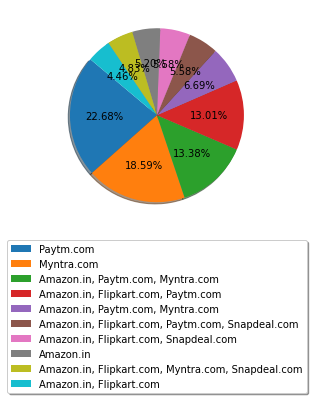

<Figure size 1800x1800 with 0 Axes>

For  Quick_Purchase  :


([<matplotlib.patches.Wedge at 0x201450410d0>,
 [Text(-1.097096927508936, -0.0798644579926046, ''),
  Text(-0.1952286619384049, -1.0825367289647683, ''),
  Text(0.7910754769558337, -0.7643295033943807, ''),
  Text(1.09988793933843, 0.015700983977526076, ''),
  Text(0.871274655833424, 0.671476339197703, ''),
  Text(0.41682716724794683, 1.017966164783512, ''),
  Text(-0.022123373351315263, 1.0997775031121333, ''),
  Text(-0.3982661324822136, 1.0253702198316763, ''),
  Text(-0.7163176108248098, 0.8347988263181954, '')],
 [Text(-0.598416505913965, -0.04356243163232977, '24.54%'),
  Text(-0.10648836105731176, -0.5904745794353281, '17.47%'),
  Text(0.431495714703182, -0.41690700185148033, '13.75%'),
  Text(0.5999388760027798, 0.008564173078650586, '11.15%'),
  Text(0.4752407213636858, 0.36625982138056523, '9.29%'),
  Text(0.2273602730443346, 0.5552542717000974, '7.43%'),
  Text(-0.01206729455526287, 0.5998786380611636, '5.58%'),
  Text(-0.21723607226302558, 0.5592928471809142, '5.58%'),
  Te

<Figure size 1800x1800 with 0 Axes>

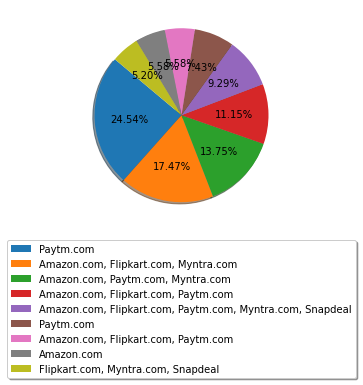

<Figure size 1800x1800 with 0 Axes>

For  PaymentOptions_Availability  :


([<matplotlib.patches.Wedge at 0x20144ebbdf0>,
 [Text(-1.097954807095073, -0.0670465627517246, ''),
  Text(-0.3077262282560692, -1.056079811587786, ''),
  Text(0.6561109265962208, -0.8829034216725228, ''),
  Text(1.0763760758322716, -0.22674775274723255, ''),
  Text(1.0526214142261388, 0.31935584903452696, ''),
  Text(0.8048296933481829, 0.7498327578234162, ''),
  Text(0.4168271910751642, 1.0179661550269679, ''),
  Text(0.016414523135266267, 1.0998775220133568, ''),
  Text(-0.3132038034619367, 1.054468291366306, ''),
  Text(-0.5818213864044008, 0.9335330065522381, ''),
  Text(-0.773008447746752, 0.7825969203313781, '')],
 [Text(-0.5988844402336762, -0.0365708524100316, '24.16%'),
  Text(-0.1678506699578559, -0.5760435335933378, '14.87%'),
  Text(0.3578786872343023, -0.48158368454864875, '14.50%'),
  Text(0.587114223181239, -0.12368059240758136, '8.55%'),
  Text(0.5741571350324393, 0.17419409947337833, '7.43%'),
  Text(0.4389980145535543, 0.4089996860854997, '7.06%'),
  Text(0.227360286

<Figure size 1800x1800 with 0 Axes>

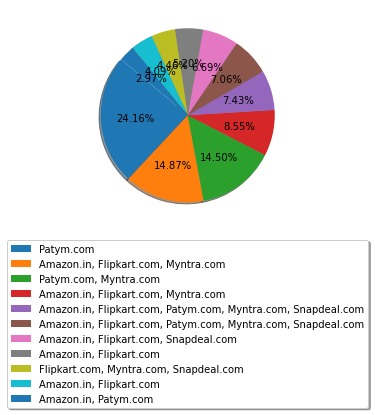

<Figure size 1800x1800 with 0 Axes>

For  Fast_Delivery  :


([<matplotlib.patches.Wedge at 0x20145322070>,
 [Text(-0.9369145968956428, -0.5763601635469573, ''),
  Text(1.0203827900653208, -0.41087584711018427, ''),
  Text(0.5986838389851254, 0.9228096558543547, ''),
  Text(-0.022123373351315263, 1.0997775031121333, ''),
  Text(-0.3982661324822136, 1.0253702198316763, ''),
  Text(-0.7163176108248098, 0.8347988263181954, '')],
 [Text(-0.5110443255794415, -0.314378271025613, '39.78%'),
  Text(0.5565724309447204, -0.22411409842373683, '30.48%'),
  Text(0.3265548212646139, 0.5033507213751025, '13.38%'),
  Text(-0.01206729455526287, 0.5998786380611636, '5.58%'),
  Text(-0.21723607226302558, 0.5592928471809142, '5.58%'),
  Text(-0.3907186968135326, 0.4553448143553792, '5.20%')])

<Figure size 1800x1800 with 0 Axes>

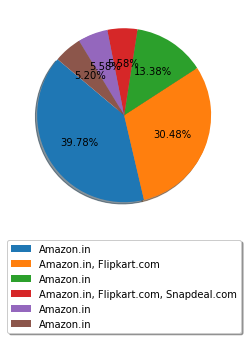

<Figure size 1800x1800 with 0 Axes>

For  CustInfo_Privacy  :


([<matplotlib.patches.Wedge at 0x20144f851c0>,
 [Text(-1.090566047219411, -0.1437556838953843, ''),
  Text(0.02212327038271425, -1.0997775051834682, ''),
  Text(0.8900864508976457, -0.6463328166884561, ''),
  Text(1.0982880257547334, -0.06134665829342466, ''),
  Text(0.9976913161625656, 0.4632623853215452, ''),
  Text(0.7503547731658116, 0.8043430327834534, ''),
  Text(0.42868713244532214, 1.0130287964691858, ''),
  Text(0.0549322978058738, 1.0986275268068642, ''),
  Text(-0.31320376643951897, 1.0544683023629016, ''),
  Text(-0.6034657276013955, 0.9196896844101919, ''),
  Text(-0.7820952823846492, 0.7735159786789644, '')],
 [Text(-0.5948542075742241, -0.07841219121566416, '26.39%'),
  Text(0.012067238390571408, -0.5998786391909826, '20.07%'),
  Text(0.4855017004896248, -0.3525451727391578, '9.29%'),
  Text(0.5990661958662181, -0.033461813614595264, '8.92%'),
  Text(0.5441952633613993, 0.25268857381175186, '6.69%'),
  Text(0.40928442172680624, 0.43873256333642907, '5.58%'),
  Text(0.233

<Figure size 1800x1800 with 0 Axes>

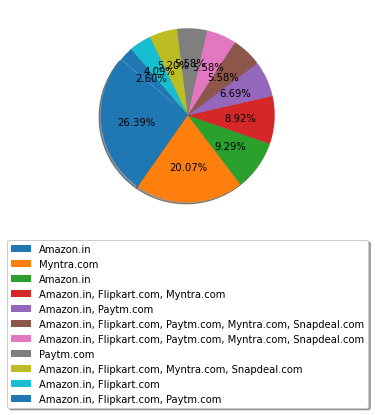

<Figure size 1800x1800 with 0 Axes>

For  FinancialInfo_Security  :


([<matplotlib.patches.Wedge at 0x2014515e790>,
 [Text(-1.0942250713983719, 0.11256772682802112, ''),
  Text(-0.609420088521893, -0.9157549648819647, ''),
  Text(0.3132037787803254, -1.0544682986973697, ''),
  Text(0.9049390851088239, -0.6253680933997232, ''),
  Text(1.0994212202148808, -0.03567885285743752, ''),
  Text(0.9749693602125675, 0.5093473732598384, ''),
  Text(0.6515192618940129, 0.8862971574935129, ''),
  Text(0.25807351320212457, 1.069297929383347, ''),
  Text(-0.12462997892825277, 1.092916908256224, ''),
  Text(-0.48066822068461074, 0.9894230953560214, ''),
  Text(-0.7451203383927234, 0.8091944644604988, '')],
 [Text(-0.5968500389445665, 0.06140057826982969, '18.96%'),
  Text(-0.33241095737557796, -0.49950270811743525, '15.61%'),
  Text(0.1708384247892684, -0.5751645265622016, '12.27%'),
  Text(0.4936031373320857, -0.3411098691271217, '9.29%'),
  Text(0.5996843019353895, -0.01946119246769319, '8.92%'),
  Text(0.5318014692068549, 0.2778258399599118, '7.43%'),
  Text(0.35537

<Figure size 1800x1800 with 0 Axes>

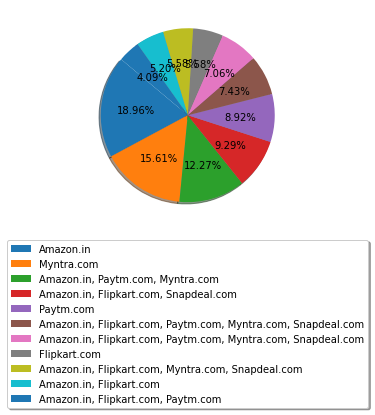

<Figure size 1800x1800 with 0 Axes>

For  Perceived_Trustworthiness  :


([<matplotlib.patches.Wedge at 0x20145158940>,
 [Text(-1.080317542041897, -0.2071569655033461, ''),
  Text(-0.08057616016521227, -1.0970448862343922, ''),
  Text(0.7545197315208012, -0.8004373646612071, ''),
  Text(1.0989295718987135, -0.048515935593474904, ''),
  Text(0.886719554480389, 0.6509442615939562, ''),
  Text(0.3567073419722233, 1.0405574814411318, ''),
  Text(-0.15012166006441746, 1.0897079825253662, ''),
  Text(-0.49219053587425377, 0.9837420781870699, ''),
  Text(-0.7451204141549744, 0.8091943946972938, '')],
 [Text(-0.5892641138410346, -0.11299470845637058, '28.25%'),
  Text(-0.0439506328173885, -0.5983881197642138, '13.38%'),
  Text(0.41155621719316426, -0.4366021989061129, '13.01%'),
  Text(0.599416130126571, -0.026463237596440852, '11.52%'),
  Text(0.48366521153475756, 0.35506050632397607, '10.04%'),
  Text(0.19456764107575814, 0.5675768080587992, '9.29%'),
  Text(-0.08188454185331862, 0.5943861722865632, '5.58%'),
  Text(-0.2684675650223202, 0.5365865881020381, '4.83%

<Figure size 1800x1800 with 0 Axes>

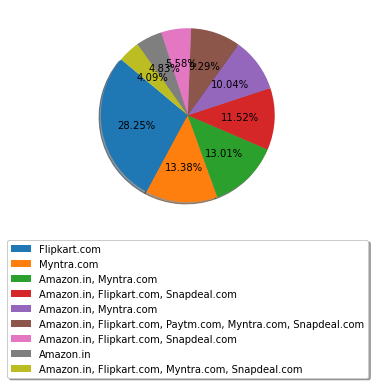

<Figure size 1800x1800 with 0 Axes>

For  MultiChannel_Assistance  :


([<matplotlib.patches.Wedge at 0x20145027820>,
 [Text(-1.099887940073445, -0.015700932488055284, ''),
  Text(-0.15718852303862516, -1.0887110581898833, ''),
  Text(0.9331553450540475, -0.5824269069995494, ''),
  Text(1.0778245907544817, 0.21975930370506308, ''),
  Text(0.8135317652743945, 0.7403823788351042, ''),
  Text(0.45222994863118154, 1.002740282207232, ''),
  Text(0.08057626287796704, 1.0970448786903026, ''),
  Text(-0.2760743631582076, 1.0647924426886164, ''),
  Text(-0.5708793642623089, 0.9402641923733256, ''),
  Text(-0.7730083927927411, 0.7825969746120818, '')],
 [Text(-0.5999388764036971, -0.0085641449934847, '22.68%'),
  Text(-0.08573919438470462, -0.5938423953763, '22.30%'),
  Text(0.5089938245749349, -0.317687403817936, '14.50%'),
  Text(0.5879043222297172, 0.11986871111185257, '9.67%'),
  Text(0.4437445992405788, 0.40384493391005677, '7.43%'),
  Text(0.24667088107155355, 0.5469492448403083, '5.58%'),
  Text(0.04395068884252747, 0.5983881156492559, '5.58%'),
  Text(-0.15

<Figure size 1800x1800 with 0 Axes>

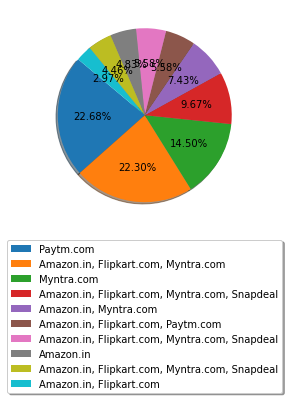

<Figure size 1800x1800 with 0 Axes>

For  Long_LoginTime  :


([<matplotlib.patches.Wedge at 0x201451ae0a0>,
 [Text(-1.099421218544632, 0.03567890432505907, ''),
  Text(-0.5213273218380253, -0.9686164480872664, ''),
  Text(0.4221054863817164, -1.0157888355196936, ''),
  Text(1.0426226636416855, -0.3506251292487703, ''),
  Text(1.0030334354769297, 0.45157936989564545, ''),
  Text(0.5438074853604192, 0.9561764580170219, ''),
  Text(0.054932143514475, 1.0986275345215526, ''),
  Text(-0.30086792070102586, 1.058054107450579, ''),
  Text(-0.5818214738080671, 0.9335329520781839, ''),
  Text(-0.7730085210187596, 0.782596847957101, '')],
 [Text(-0.5996843010243447, 0.019461220540941307, '21.19%'),
  Text(-0.2843603573661956, -0.5283362444112362, '14.13%'),
  Text(0.23023935620820893, -0.5540666375561963, '14.13%'),
  Text(0.5687032710772829, -0.19125007049932927, '13.01%'),
  Text(0.5471091466237797, 0.2463160199430793, '10.78%'),
  Text(0.29662226474204684, 0.5215507952820119, '9.29%'),
  Text(0.029962987371531816, 0.5992513824663014, '5.58%'),
  Text(-0

<Figure size 1800x1800 with 0 Axes>

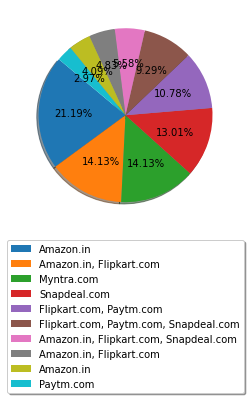

<Figure size 1800x1800 with 0 Axes>

For  LongPhoto_DisplayTime  :


([<matplotlib.patches.Wedge at 0x20146c2f940>,
 [Text(-1.0999962954544997, -0.002854818098798089, ''),
  Text(-0.44048855663882497, -1.0079532883374331, ''),
  Text(0.4806681859459321, -0.9894231122322982, ''),
  Text(1.0466463213888737, -0.3384249960081834, ''),
  Text(1.0230271225502507, 0.4042468386104643, ''),
  Text(0.6921969033450778, 0.8549055193408716, ''),
  Text(0.30772617881740455, 1.0560798259934894, ''),
  Text(-0.07345683981741791, 1.097544574349506, ''),
  Text(-0.4339396280281544, 1.0107899876961521, ''),
  Text(-0.7260179993611092, 0.8263763456220735, '')],
 [Text(-0.5999979793388179, -0.001557173508435321, '22.30%'),
  Text(-0.24026648543935905, -0.549792702729509, '14.50%'),
  Text(0.2621826468795993, -0.5396853339448898, '13.01%'),
  Text(0.57089799348484, -0.1845954523681, '12.64%'),
  Text(0.5580147941183184, 0.22049827560570776, '9.29%'),
  Text(0.37756194727913334, 0.46631210145865715, '7.06%'),
  Text(0.16785064299131155, 0.5760435414509941, '5.58%'),
  Text(-0

<Figure size 1800x1800 with 0 Axes>

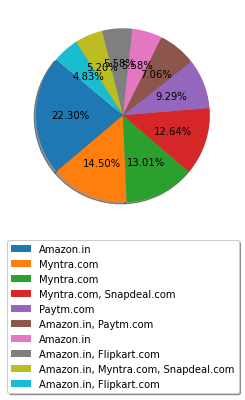

<Figure size 1800x1800 with 0 Axes>

For  LatePrice_Declare  :


([<matplotlib.patches.Wedge at 0x20144f9e850>,
 [Text(-1.0826631608417228, -0.19452629682438885, ''),
  Text(0.09907035641884071, -1.0955295817453055, ''),
  Text(1.0155147895540675, -0.4227643695925166, ''),
  Text(0.9501201329658715, 0.5543209656263373, ''),
  Text(0.1698922160606437, 1.0868011018222257, ''),
  Text(-0.4690804845845648, 0.9949690944858087, ''),
  Text(-0.6866357247306373, 0.8593784856066812, ''),
  Text(-0.7999478187527971, 0.7550387322996366, '')],
 [Text(-0.5905435422773032, -0.10610525281330299, '27.88%'),
  Text(0.054038376228458564, -0.5975615900428939, '19.33%'),
  Text(0.5539171579385822, -0.23059874705046357, '15.24%'),
  Text(0.5182473452541116, 0.30235689034163843, '14.13%'),
  Text(0.09266848148762383, 0.5928006009939412, '14.13%'),
  Text(-0.2558620825006717, 0.5427104151740774, '4.83%'),
  Text(-0.3745285771258021, 0.4687519012400079, '2.60%'),
  Text(-0.436335173865162, 0.41183930852707445, '1.86%')])

<Figure size 1800x1800 with 0 Axes>

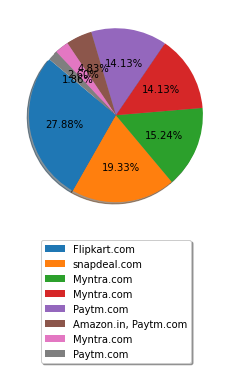

<Figure size 1800x1800 with 0 Axes>

For  Long_LoadingTime  :


([<matplotlib.patches.Wedge at 0x20144fd3460>,
 [Text(-1.099887940073445, -0.015700932488055284, ''),
  Text(-0.1698923178143055, -1.0868010859157637, ''),
  Text(0.86689971769289, -0.6771151153710777, ''),
  Text(1.0997629190753766, -0.022836852383966905, ''),
  Text(0.9865994647225556, 0.4864375563308892, ''),
  Text(0.7217187846798695, 0.8301337216618854, ''),
  Text(0.3809128824887738, 1.0319425255090973, ''),
  Text(0.016414548879757393, 1.0998775216291468, ''),
  Text(-0.3254970420923156, 1.0507386333380693, ''),
  Text(-0.6034657276013955, 0.9196896844101919, ''),
  Text(-0.7820952823846492, 0.7735159786789644, '')],
 [Text(-0.5999388764036971, -0.0085641449934847, '22.68%'),
  Text(-0.09266853698962117, -0.5928005923176892, '21.93%'),
  Text(0.472854391468849, -0.36933551747513327, '11.90%'),
  Text(0.5998706831320235, -0.01245646493670922, '8.55%'),
  Text(0.5381451625759394, 0.26532957618048497, '6.69%'),
  Text(0.3936647916435651, 0.4528002118155737, '5.95%'),
  Text(0.20777

<Figure size 1800x1800 with 0 Axes>

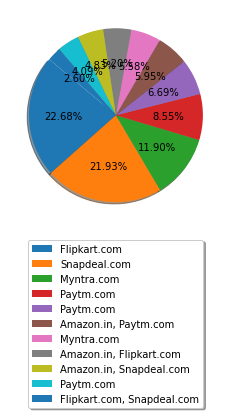

<Figure size 1800x1800 with 0 Axes>

For  Limited_PaymentMode  :


([<matplotlib.patches.Wedge at 0x20144e6eb80>,
 [Text(-1.0448755903197091, -0.3438531674334842, ''),
  Text(0.5150318772561525, -0.9719784799109513, ''),
  Text(1.0999962952540314, 0.0028548953406125946, ''),
  Text(0.8389674150636582, 0.7114307249911291, ''),
  Text(0.2580734881734004, 1.069297935423993, ''),
  Text(-0.25113047920403275, 1.0709498038725966, ''),
  Text(-0.5818214301062354, 0.9335329793152115, ''),
  Text(-0.782095336700992, 0.7735159237601784, '')],
 [Text(-0.5699321401743866, -0.18755627314553683, '32.34%'),
  Text(0.2809264785033559, -0.530170079951428, '23.05%'),
  Text(0.5999979792294716, 0.0015572156403341423, '11.52%'),
  Text(0.4576185900347226, 0.38805312272243403, '10.78%'),
  Text(0.1407673571854911, 0.583253419322178, '9.29%'),
  Text(-0.13698026138401784, 0.5841544384759617, '5.58%'),
  Text(-0.3173571436943102, 0.5091998068992062, '4.83%'),
  Text(-0.4265974563823592, 0.42191777659646096, '2.60%')])

<Figure size 1800x1800 with 0 Axes>

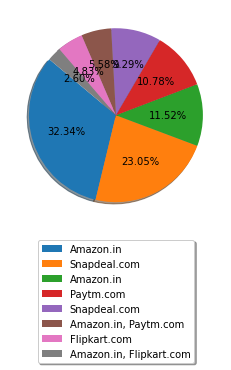

<Figure size 1800x1800 with 0 Axes>

For  Late_Delivery  :


([<matplotlib.patches.Wedge at 0x201450f2f40>,
 [Text(-1.0888128165574569, -0.1564821092017168, ''),
  Text(0.17553113638782797, -1.0859046091431779, ''),
  Text(1.087774621516896, -0.16354318323847708, ''),
  Text(0.7689358577118319, 0.7865987838313568, ''),
  Text(0.042098202003718575, 1.0991941327118036, ''),
  Text(-0.5926839431622927, 0.926674561816389, '')],
 [Text(-0.593897899940431, -0.08535387774639096, '26.77%'),
  Text(0.09574425621154252, -0.5923116049871878, '23.79%'),
  Text(0.5933316117364886, -0.08920537267553295, '16.36%'),
  Text(0.4194195587519083, 0.429053882089831, '13.75%'),
  Text(0.022962655638391945, 0.5995604360246201, '9.67%'),
  Text(-0.323282150815796, 0.5054588518998484, '9.67%')])

<Figure size 1800x1800 with 0 Axes>

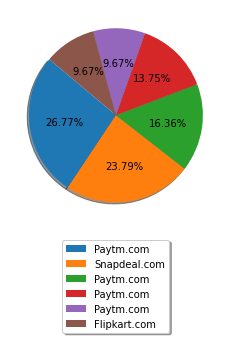

<Figure size 1800x1800 with 0 Axes>

For  ChangeWebApp_Design  :


([<matplotlib.patches.Wedge at 0x20144e561f0>,
 [Text(-1.0030334883268128, -0.4515792525071826, ''),
  Text(0.7163175815149944, -0.8347988514681305, ''),
  Text(1.0133067052655529, 0.4280298132885959, ''),
  Text(0.32003867287482907, 1.0524140097245562, ''),
  Text(-0.3132038034619367, 1.054468291366306, ''),
  Text(-0.6353113676502723, 0.8979863396145515, ''),
  Text(-0.7820952914373728, 0.773515969525834, '')],
 [Text(-0.5471091754509887, -0.24631595591300864, '35.69%'),
  Text(0.3907186808263605, -0.4553448280735256, '23.42%'),
  Text(0.5527127483266651, 0.233470807248325, '16.73%'),
  Text(0.17456654884081582, 0.5740440053043033, '11.15%'),
  Text(-0.17083843825196546, 0.5751645225634395, '7.43%'),
  Text(-0.34653347326378486, 0.48981073069884623, '2.97%'),
  Text(-0.4265974316931124, 0.4219178015595458, '2.60%')])

<Figure size 1800x1800 with 0 Axes>

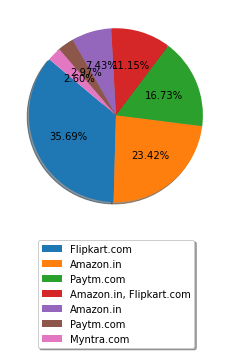

<Figure size 1800x1800 with 0 Axes>

For  Page_Disruption  :


([<matplotlib.patches.Wedge at 0x20146377c70>,
 [Text(-1.0965556639895049, 0.08698089314634512, ''),
  Text(-0.45222990168952015, -1.0027403033776427, ''),
  Text(0.7545196565784432, -0.8004374353044392, ''),
  Text(1.0751846224609984, 0.2323317189352342, ''),
  Text(0.6200731960626807, 0.9085753857135975, ''),
  Text(0.0035684946229065846, 1.0999942117330102, ''),
  Text(-0.48066817436637277, 0.9894231178577234, ''),
  Text(-0.7451203005115962, 0.8091944993420981, '')],
 [Text(-0.5981212712670027, 0.04744412353437006, '19.70%'),
  Text(-0.24667085546701095, -0.5469492563878051, '19.33%'),
  Text(0.41155617631551444, -0.43660223743878496, '18.22%'),
  Text(0.5864643395241809, 0.12672639214649137, '14.50%'),
  Text(0.33822174330691673, 0.4955865740255986, '9.67%'),
  Text(0.0019464516124945005, 0.59999684276346, '9.29%'),
  Text(-0.262182640563476, 0.5396853370133036, '5.20%'),
  Text(-0.4064292548245069, 0.44137881782296257, '4.09%')])

<Figure size 1800x1800 with 0 Axes>

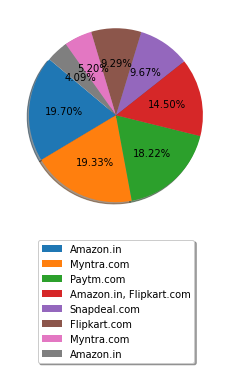

<Figure size 1800x1800 with 0 Axes>

For  WebApp_Efficiency  :


([<matplotlib.patches.Wedge at 0x201465930a0>,
 [Text(-1.0133067052655529, -0.4280298132885956, ''),
  Text(0.5036455471608275, -0.977926972132925, ''),
  Text(1.0997629217480445, -0.0228367236749225, ''),
  Text(0.7689357656534603, 0.7865988738225645, ''),
  Text(0.2953716634117185, 1.0596016140292515, ''),
  Text(-0.12463008125451802, 1.0929168965875184, ''),
  Text(-0.48066831332108345, 0.9894230503526107, ''),
  Text(-0.7451204141549744, 0.8091943946972938, '')],
 [Text(-0.5527127483266652, -0.23347080724832484, '34.94%'),
  Text(0.274715752996815, -0.5334147120725045, '17.47%'),
  Text(0.5998706845898424, -0.012456394731775908, '16.73%'),
  Text(0.41941950853825105, 0.42905393117594426, '9.29%'),
  Text(0.1611118164063919, 0.577964516743228, '6.69%'),
  Text(-0.06798004432064618, 0.5961364890477372, '5.58%'),
  Text(-0.2621827163569546, 0.5396853001923331, '5.20%'),
  Text(-0.40642931681180416, 0.4413787607439784, '4.09%')])

<Figure size 1800x1800 with 0 Axes>

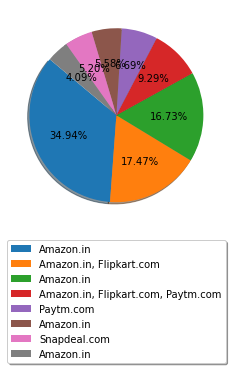

<Figure size 1800x1800 with 0 Axes>

For  Recommendation  :


([<matplotlib.patches.Wedge at 0x20146423250>,
 [Text(-1.0723980011996739, -0.2448724709373118, ''),
  Text(0.32549712817240867, -1.0507386066722373, ''),
  Text(1.0954650860416295, -0.09978098648442801, ''),
  Text(0.8306017049389709, 0.7211801493056191, ''),
  Text(0.2953716882134839, 1.0596016071155785, ''),
  Text(-0.15012160905150554, 1.089707989553067, ''),
  Text(-0.49219048982196345, 0.9837421012281704, ''),
  Text(-0.7451203762738503, 0.8091944295788965, '')],
 [Text(-0.5849443642907312, -0.1335668023294428, '29.37%'),
  Text(0.1775438880940411, -0.5731301490939475, '23.05%'),
  Text(0.5975264105681615, -0.05442599262786982, '14.50%'),
  Text(0.4530554754212568, 0.39337099053033764, '11.15%'),
  Text(0.16111182993462755, 0.5779645129721336, '7.43%'),
  Text(-0.08188451402809392, 0.5943861761198547, '5.58%'),
  Text(-0.26846753990288913, 0.536586600669911, '4.83%'),
  Text(-0.4064292961493729, 0.4413787797703072, '4.09%')])

<Figure size 1800x1800 with 0 Axes>

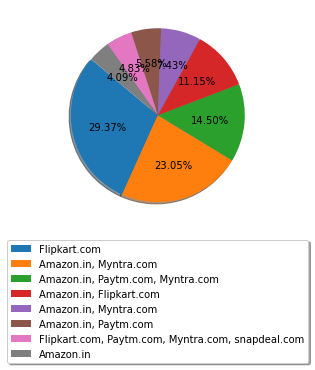

<Figure size 1800x1800 with 0 Axes>

For  Age  :


([<matplotlib.patches.Wedge at 0x2014657e400>,
 [Text(-1.0365597423780988, -0.368162872219687, ''),
  Text(0.7545196191072622, -0.8004374706260523, ''),
  Text(0.5438075972650422, 0.9561763943733509, ''),
  Text(-0.6561109472620664, 0.8829034063151382, '')],
 [Text(-0.5653962231153266, -0.20081611211982925, '33.09%'),
  Text(0.4115561558766884, -0.4366022567051194, '30.11%'),
  Text(0.2966223257809321, 0.5215507605672822, '29.37%'),
  Text(-0.35787869850658166, 0.4815836761718935, '7.43%')])

<Figure size 1800x1800 with 0 Axes>

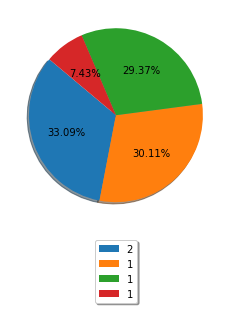

<Figure size 1800x1800 with 0 Axes>

For  Shopping_City  :


([<matplotlib.patches.Wedge at 0x2014512bfa0>,
 [Text(-1.099762918540841, 0.02283687812577591, ''),
  Text(-0.2953718618258389, -1.0596015587198508, ''),
  Text(0.8426488543307088, -0.7070664101024344, ''),
  Text(1.0597930073302726, 0.2946842065904738, ''),
  Text(0.5438076867887348, 0.9561763434584049, ''),
  Text(-0.009277956236713127, 1.0999608718168432, ''),
  Text(-0.38626403937243875, 1.0299514997744736, ''),
  Text(-0.6247807953054625, 0.9053446624449022, ''),
  Text(-0.7638160606711425, 0.791571238399184, ''),
  Text(-0.8259051368419376, 0.7265539931334082, '')],
 [Text(-0.5998706828404587, 0.01245647897769595, '21.56%'),
  Text(-0.16111192463227575, -0.5779644865744641, '20.45%'),
  Text(0.4596266478167502, -0.3856725873286006, '15.99%'),
  Text(0.5780689130892396, 0.1607368399584402, '14.87%'),
  Text(0.2966223746120371, 0.5215507327954935, '10.04%'),
  Text(-0.005060703401843523, 0.5999786573546417, '6.69%'),
  Text(-0.21068947602133023, 0.5617917271497128, '4.46%'),
  Text

<Figure size 1800x1800 with 0 Axes>

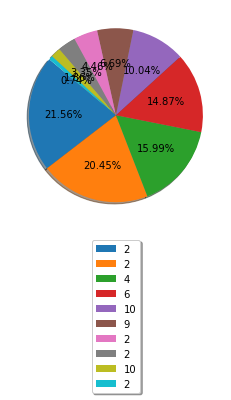

<Figure size 1800x1800 with 0 Axes>

For  PinCode  :


([<matplotlib.patches.Wedge at 0x2014521f8b0>,
 [Text(-1.0646130984137048, 0.2767651543926216, ''),
  Text(-1.008238844389623, -0.4398345514666597, ''),
  Text(-0.7313642559093164, -0.8216485411526099, ''),
  Text(-0.3567074515742468, -1.0405574438691054, ''),
  Text(-0.04209815054672692, -1.0991941346825616, ''),
  Text(0.18820098125205867, -1.083780600793243, ''),
  Text(0.41021378449619395, -1.0206491321748676, ''),
  Text(0.6034657652734537, -0.9196896596912053, ''),
  Text(0.7638161625754774, -0.7915711400679487, ''),
  Text(0.8975740129665427, -0.6358937735558798, ''),
  Text(1.0000824865895286, -0.4580775262080707, ''),
  Text(1.064613109750477, -0.2767651107842523, ''),
  Text(1.0954650796188852, -0.09978105699775723, ''),
  Text(1.0970969223681868, 0.07986452861097322, ''),
  Text(1.0723979926021925, 0.2448725085892413, ''),
  Text(1.0276783491343484, 0.39227185818065086, ''),
  Text(0.9689544354606652, 0.5206988592277727, ''),
  Text(0.9016808207887183, 0.6300569001461563, ''

<Figure size 1800x1800 with 0 Axes>

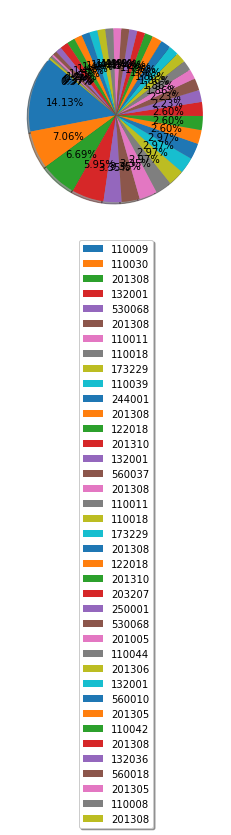

<Figure size 1800x1800 with 0 Axes>

For  Shopping_Since  :


([<matplotlib.patches.Wedge at 0x201465efe50>],
 [Text(0.8426488874308756, -0.7070663706551936, '')],
 [Text(0.4596266658713867, -0.3856725658119237, '100.00%')])

<Figure size 1800x1800 with 0 Axes>

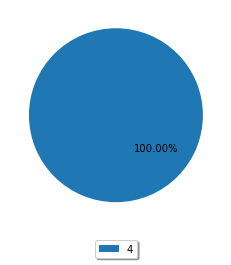

<Figure size 1800x1800 with 0 Axes>

For  Shopping_Frequency  :


([<matplotlib.patches.Wedge at 0x201452587f0>,
 [Text(-0.8867196458990807, -0.650944137062935, ''),
  Text(0.9946646063278796, -0.4697257933290491, ''),
  Text(0.6720413989611714, 0.8708388818158683, ''),
  Text(-0.32549710357809575, 1.0507386142910475, ''),
  Text(-0.7545197034174183, 0.8004373911524195, '')],
 [Text(-0.4836652613994985, -0.35506043839796453, '42.38%'),
  Text(0.5425443307242979, -0.2562140690885722, '23.42%'),
  Text(0.36656803579700253, 0.475003026445019, '19.70%'),
  Text(-0.1775438746789613, 0.5731301532496622, '10.78%'),
  Text(-0.4115562018640463, 0.43660221335586513, '3.72%')])

<Figure size 1800x1800 with 0 Axes>

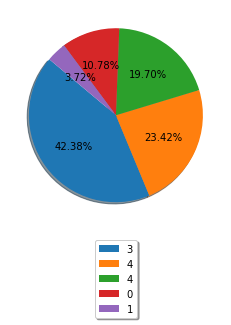

<Figure size 1800x1800 with 0 Axes>

For  TimeSpent_ForPurchase  :


([<matplotlib.patches.Wedge at 0x20146bfc970>,
 [Text(-0.8135317479444937, -0.7403823978771895, ''),
  Text(1.0896103790181006, -0.15082845201098924, ''),
  Text(0.3688353870193035, 1.0363206343995668, ''),
  Text(-0.3982660364801244, 1.0253702571200378, ''),
  Text(-0.7163175326653006, 0.834798893384686, '')],
 [Text(-0.4437445897879056, -0.4038449442966488, '45.72%'),
  Text(0.594332934009873, -0.08227006473326684, '26.39%'),
  Text(0.20118293837416554, 0.5652658005815818, '17.10%'),
  Text(-0.21723601989824964, 0.5592928675200206, '5.58%'),
  Text(-0.39071865418107304, 0.4553448509371014, '5.20%')])

<Figure size 1800x1800 with 0 Axes>

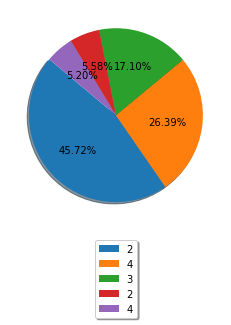

<Figure size 1800x1800 with 0 Axes>

For  Content_Readability  :


([<matplotlib.patches.Wedge at 0x20145305ca0>,
 [Text(0.6034656737841673, -0.9196897197230276, ''),
  Text(-0.5263479164376381, 0.9658974432421681, ''),
  Text(-0.7820952099628525, 0.7735160519040065, '')],
 [Text(0.32916309479136396, -0.5016489380307423, '90.71%'),
  Text(-0.28709886351143893, 0.5268531508593643, '6.69%'),
  Text(-0.426597387252465, 0.42191784649309444, '2.60%')])

<Figure size 1800x1800 with 0 Axes>

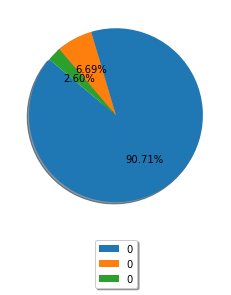

<Figure size 1800x1800 with 0 Axes>

For  Similar_ProductInfo  :


([<matplotlib.patches.Wedge at 0x20144cb5520>,
 [Text(0.17553108555296476, -1.0859046173603821, ''),
  Text(0.05493240066680606, 1.0986275216637265, ''),
  Text(-0.6765524474869855, 0.8673389105761196, '')],
 [Text(0.0957442284834353, -0.5923116094692993, '77.32%'),
  Text(0.029963127636439667, 0.5992513754529416, '15.99%'),
  Text(-0.3690286077201739, 0.47309395122333786, '6.69%')])

<Figure size 1800x1800 with 0 Axes>

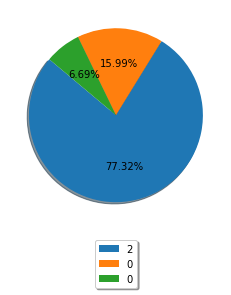

<Figure size 1800x1800 with 0 Axes>

For  Seller_ProductInfo  :


([<matplotlib.patches.Wedge at 0x20144e51b80>,
 [Text(-0.08057616016521227, -1.0970448862343922, ''),
  Text(0.4404884150817248, 1.0079533501996956, ''),
  Text(-0.5598596881625563, 0.9468670073302404, '')],
 [Text(-0.0439506328173885, -0.5983881197642138, '69.89%'),
  Text(0.24026640822639533, 0.5497927364725612, '19.33%'),
  Text(-0.30537801172503065, 0.5164729130892219, '10.78%')])

<Figure size 1800x1800 with 0 Axes>

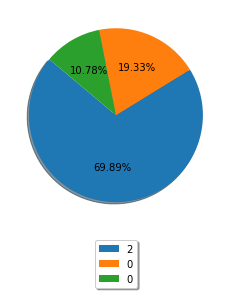

<Figure size 1800x1800 with 0 Axes>

For  ProductInfo_Clarity  :


([<matplotlib.patches.Wedge at 0x2014668a5b0>,
 [Text(0.5487633633924583, -0.9533408472305154, ''),
  Text(-0.5487633633924581, 0.9533408472305155, '')],
 [Text(0.2993254709413409, -0.5200040984893719, '88.85%'),
  Text(-0.29932547094134077, 0.520004098489372, '11.15%')])

<Figure size 1800x1800 with 0 Axes>

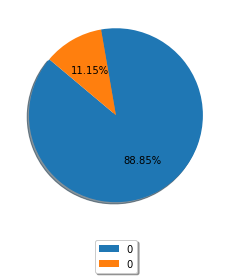

<Figure size 1800x1800 with 0 Axes>

For  Ease_Navigation  :


([<matplotlib.patches.Wedge at 0x20144f83820>,
 [Text(0.6247808800699454, -0.9053446039486979, ''),
  Text(-0.6247809012610656, 0.9053445893246453, '')],
 [Text(0.3407895709472429, -0.4938243294265624, '91.45%'),
  Text(-0.3407895825060357, 0.4938243214498065, '8.55%')])

<Figure size 1800x1800 with 0 Axes>

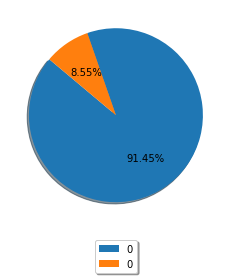

<Figure size 1800x1800 with 0 Axes>

For  Loading_ProcessingSpeed  :


([<matplotlib.patches.Wedge at 0x201450f9ac0>,
 [Text(0.4102137128261415, -1.020649160980105, ''),
  Text(-0.26362034267666884, 1.0679439661925318, ''),
  Text(-0.735619258724866, 0.817841247549351, '')],
 [Text(0.22375293426880444, -0.5567177241709662, '84.39%'),
  Text(-0.14379291418727388, 0.5825148906504719, '11.15%'),
  Text(-0.40124686839538143, 0.44609522593600953, '4.46%')])

<Figure size 1800x1800 with 0 Axes>

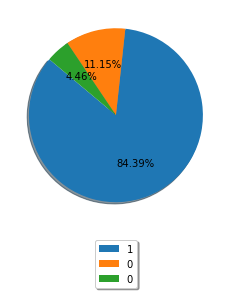

<Figure size 1800x1800 with 0 Axes>

For  UserFriendly_Interface  :


([<matplotlib.patches.Wedge at 0x20146532c40>,
 [Text(0.49219038620430494, -0.9837421530706395, ''),
  Text(-0.4339395925392832, 1.0107900029317864, ''),
  Text(-0.7999477745704039, 0.7550387791099595, '')],
 [Text(0.2684674833841663, -0.5365866289476214, '86.99%'),
  Text(-0.23669432320324535, 0.5513400015991562, '11.15%'),
  Text(-0.4363351497656748, 0.41183933405997786, '1.86%')])

<Figure size 1800x1800 with 0 Axes>

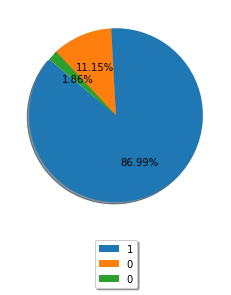

<Figure size 1800x1800 with 0 Axes>

For  Conveninet_PaymentMode  :


([<matplotlib.patches.Wedge at 0x20144e5c700>,
 [Text(0.5487633633924583, -0.9533408472305154, ''),
  Text(-0.5487633633924581, 0.9533408472305155, '')],
 [Text(0.2993254709413409, -0.5200040984893719, '88.85%'),
  Text(-0.29932547094134077, 0.520004098489372, '11.15%')])

<Figure size 1800x1800 with 0 Axes>

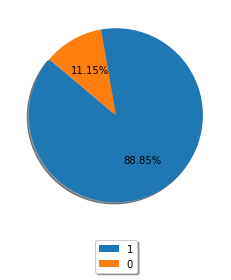

<Figure size 1800x1800 with 0 Axes>

For  TimelyFulfilment_Trust  :


([<matplotlib.patches.Wedge at 0x20144c64c40>,
 [Text(0.4102137128261415, -1.020649160980105, ''),
  Text(-0.26362034267666884, 1.0679439661925318, ''),
  Text(-0.735619258724866, 0.817841247549351, '')],
 [Text(0.22375293426880444, -0.5567177241709662, '84.39%'),
  Text(-0.14379291418727388, 0.5825148906504719, '11.15%'),
  Text(-0.40124686839538143, 0.44609522593600953, '4.46%')])

<Figure size 1800x1800 with 0 Axes>

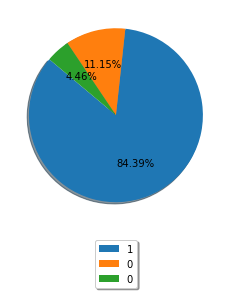

<Figure size 1800x1800 with 0 Axes>

For  Customer_Empathy  :


([<matplotlib.patches.Wedge at 0x201450fff10>,
 [Text(0.5150319227577488, -0.9719784558005679, ''),
  Text(-0.33774608162798586, 1.0468655999434415, ''),
  Text(-0.7065196497421234, 0.8431073386753714, '')],
 [Text(0.2809265033224084, -0.5301700668003096, '87.73%'),
  Text(-0.18422513543344682, 0.5710175999691499, '6.69%'),
  Text(-0.38537435440479456, 0.45987673018656616, '5.58%')])

<Figure size 1800x1800 with 0 Axes>

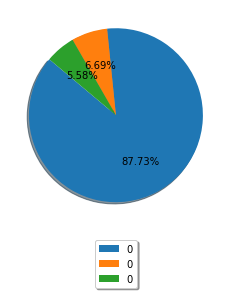

<Figure size 1800x1800 with 0 Axes>

For  CustPrivacy_Guarantee  :


([<matplotlib.patches.Wedge at 0x20144ce6790>,
 [Text(0.5926838780911398, -0.9266746034346939, ''),
  Text(-0.5926838130199853, 0.9266746450529935, '')],
 [Text(0.32328211532243983, -0.5054588746007421, '90.33%'),
  Text(-0.32328207982908286, 0.5054588973016327, '9.67%')])

<Figure size 1800x1800 with 0 Axes>

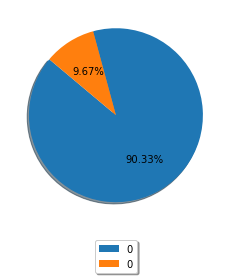

<Figure size 1800x1800 with 0 Axes>

For  VariousChannel_Responses  :


([<matplotlib.patches.Wedge at 0x2014533d640>,
 [Text(0.5926838780911398, -0.9266746034346939, ''),
  Text(-0.4690802400507614, 0.9949692097718, ''),
  Text(-0.7451201679276374, 0.809194621427682, '')],
 [Text(0.32328211532243983, -0.5054588746007421, '90.33%'),
  Text(-0.25586194911859705, 0.5427104780573454, '5.58%'),
  Text(-0.406429182505984, 0.4413788844150992, '4.09%')])

<Figure size 1800x1800 with 0 Axes>

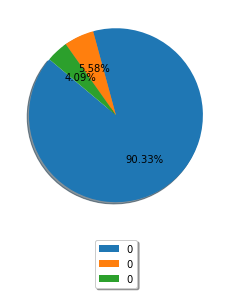

<Figure size 1800x1800 with 0 Axes>

For  Benefit_Discount  :


([<matplotlib.patches.Wedge at 0x201452b0760>,
 [Text(-0.05493234923634035, -1.0986275242352965, ''),
  Text(0.4168272863840322, 1.0179661160007853, ''),
  Text(-0.559859510858372, 0.9468671121659177, '')],
 [Text(-0.029963099583458365, -0.5992513768556161, '70.63%'),
  Text(0.2273603380276539, 0.5552542450913374, '18.59%'),
  Text(-0.3053779150136574, 0.5164729702723186, '10.78%')])

<Figure size 1800x1800 with 0 Axes>

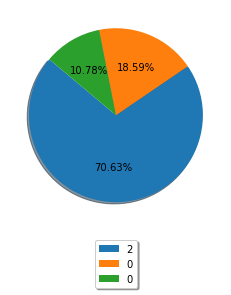

<Figure size 1800x1800 with 0 Axes>

For  Enjoy_OnlineShopping  :


([<matplotlib.patches.Wedge at 0x2014641ff10>,
 [Text(-0.5986838389851254, -0.9228096558543547, ''),
  Text(1.0030334460469077, 0.4515793464179527, ''),
  Text(-0.32549712817240856, 1.0507386066722373, '')],
 [Text(-0.3265548212646139, -0.5033507213751025, '53.90%'),
  Text(0.5471091523892223, 0.24631600713706508, '27.88%'),
  Text(-0.177543888094041, 0.5731301490939475, '18.22%')])

<Figure size 1800x1800 with 0 Axes>

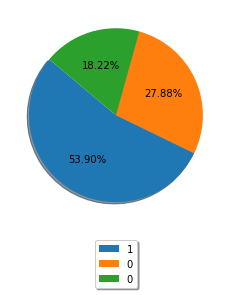

<Figure size 1800x1800 with 0 Axes>

For  Convenience_Flexibility  :


([<matplotlib.patches.Wedge at 0x20144e53b50>,
 [Text(0.37420955218693275, -1.0343921940212306, ''),
  Text(-0.22604955426963388, 1.076522920803129, ''),
  Text(-0.7356194118685021, 0.8178411098020442, '')],
 [Text(0.2041143011928724, -0.5642139240115803, '83.27%'),
  Text(-0.12329975687434575, 0.5871943204380703, '12.27%'),
  Text(-0.4012469519282738, 0.446095150801115, '4.46%')])

<Figure size 1800x1800 with 0 Axes>

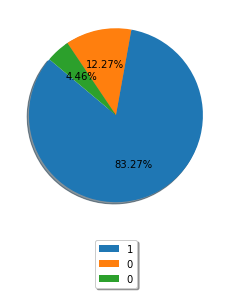

<Figure size 1800x1800 with 0 Axes>

For  Returns_ReplacementPolicy  :


([<matplotlib.patches.Wedge at 0x20144c78430>,
 [Text(0.6561108439328339, -0.8829034831020572, ''),
  Text(-0.6561107819352895, 0.8829035291742032, '')],
 [Text(0.3578786421451821, -0.4815837180556675, '92.57%'),
  Text(-0.3578786083283397, 0.481583743185929, '7.43%')])

<Figure size 1800x1800 with 0 Axes>

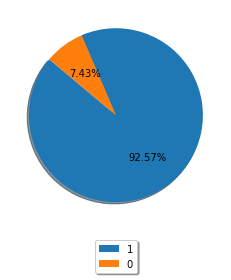

<Figure size 1800x1800 with 0 Axes>

For  Loyalty_ProgramAccess  :


([<matplotlib.patches.Wedge at 0x20146510af0>,
 [Text(-0.1952287126156068, -1.0825367198254536, ''),
  Text(0.5099798257602342, 0.9746386906528807, ''),
  Text(-0.5926838997815238, 0.9266745895619265, '')],
 [Text(-0.10648838869942188, -0.5904745744502474, '66.54%'),
  Text(0.2781708140510368, 0.5316211039924803, '23.79%'),
  Text(-0.32328212715355836, 0.5054588670337781, '9.67%')])

<Figure size 1800x1800 with 0 Axes>

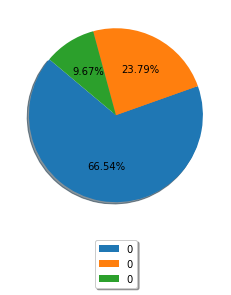

<Figure size 1800x1800 with 0 Axes>

For  QualityInfo_Satisfaction  :


([<matplotlib.patches.Wedge at 0x2014657e670>,
 [Text(0.23860606246459157, -1.073809641861696, ''),
  Text(-0.2386060121959335, 1.0738096530316508, '')],
 [Text(0.13014876134432266, -0.5857143501063795, '79.18%'),
  Text(-0.1301487339250546, 0.5857143561990822, '20.82%')])

<Figure size 1800x1800 with 0 Axes>

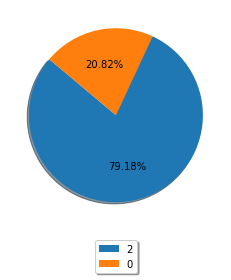

<Figure size 1800x1800 with 0 Axes>

For  WebsiteQuality_Satisfaction  :


([<matplotlib.patches.Wedge at 0x201466297f0>,
 [Text(0.7730083515772306, -0.7825970153226071, ''),
  Text(-0.773008301202715, 0.7825970650799126, '')],
 [Text(0.4216409190421257, -0.42687109926687655, '97.03%'),
  Text(-0.42164089156511725, 0.42687112640722497, '2.97%')])

<Figure size 1800x1800 with 0 Axes>

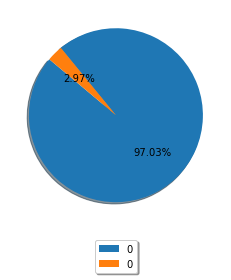

<Figure size 1800x1800 with 0 Axes>

For  NetBenefit_Satisfaction  :


([<matplotlib.patches.Wedge at 0x201465ae460>,
 [Text(0.3008678587871663, -1.058054125056382, ''),
  Text(-0.16283757935507828, 1.0878804726392413, ''),
  Text(-0.7451203952144119, 0.8091944121380961, '')],
 [Text(0.16410974115663615, -0.5771204318489355, '81.04%'),
  Text(-0.0888204978300427, 0.5933893487123133, '14.87%'),
  Text(-0.4064293064805882, 0.4413787702571433, '4.09%')])

<Figure size 1800x1800 with 0 Axes>

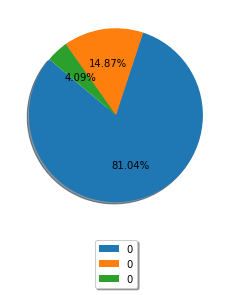

<Figure size 1800x1800 with 0 Axes>

For  User_Trust  :


([<matplotlib.patches.Wedge at 0x20144eed7c0>,
 [Text(0.5487633633924583, -0.9533408472305154, ''),
  Text(-0.4921903631781572, 0.9837421645911869, ''),
  Text(-0.7999477392244859, 0.7550388165582178, '')],
 [Text(0.2993254709413409, -0.5200040984893719, '88.85%'),
  Text(-0.26846747082444933, 0.5365866352315565, '9.29%'),
  Text(-0.4363351304860832, 0.41183935448630055, '1.86%')])

<Figure size 1800x1800 with 0 Axes>

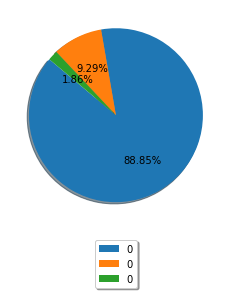

<Figure size 1800x1800 with 0 Axes>

For  Product_SeveralCategory  :


([<matplotlib.patches.Wedge at 0x20145239ca0>,
 [Text(0.1373851120963731, -1.0913868841864773, ''),
  Text(-0.04780319757746746, 1.098960806535597, ''),
  Text(-0.7820953548064378, 0.7735159054539167, '')],
 [Text(0.07493733387074895, -0.5953019368289876, '76.21%'),
  Text(-0.02607447140589134, 0.5994331672012346, '21.19%'),
  Text(-0.4265974662580569, 0.4219177666112272, '2.60%')])

<Figure size 1800x1800 with 0 Axes>

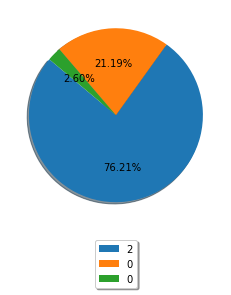

<Figure size 1800x1800 with 0 Axes>

For  Relevant_ProductInfo  :


([<matplotlib.patches.Wedge at 0x2014526d190>,
 [Text(0.48066813962769245, -0.9894231347339991, ''),
  Text(-0.4221054150529541, 1.015788865159967, ''),
  Text(-0.7999477392244859, 0.7550388165582178, '')],
 [Text(0.2621826216151049, -0.5396853462185449, '86.62%'),
  Text(-0.23023931730161132, 0.5540666537236183, '11.52%'),
  Text(-0.4363351304860832, 0.41183935448630055, '1.86%')])

<Figure size 1800x1800 with 0 Axes>

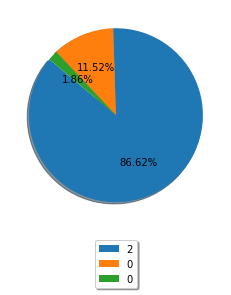

<Figure size 1800x1800 with 0 Axes>

For  Monetary_Savings  :


([<matplotlib.patches.Wedge at 0x201466952b0>,
 [Text(0.3621038325175445, -1.0386918765813595, ''),
  Text(-0.17553126347498607, 1.0859045886001566, ''),
  Text(-0.70651961027342, 0.8431073717499419, '')],
 [Text(0.19751118137320609, -0.5665592054080143, '82.90%'),
  Text(-0.09574432553181057, 0.5923115937819035, '11.52%'),
  Text(-0.38537433287641093, 0.45987674822724095, '5.58%')])

<Figure size 1800x1800 with 0 Axes>

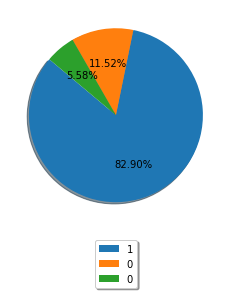

<Figure size 1800x1800 with 0 Axes>

For  Patronizing_Convenience  :


([<matplotlib.patches.Wedge at 0x201451f0940>,
 [Text(-0.029258364317942105, -1.0996108166608032, ''),
  Text(0.029258364317942237, 1.0996108166608032, '')],
 [Text(-0.0159591078097866, -0.5997877181786199, '71.38%'),
  Text(0.015959107809786672, 0.5997877181786199, '28.62%')])

<Figure size 1800x1800 with 0 Axes>

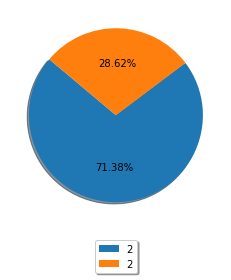

<Figure size 1800x1800 with 0 Axes>

For  Adventure_Sense  :


([<matplotlib.patches.Wedge at 0x201452fedf0>,
 [Text(-0.48707758234557924, -0.9862836451936053, ''),
  Text(0.9808513205181366, 0.4979263871676493, ''),
  Text(-0.25113037893447365, 1.0709498273851246, '')],
 [Text(-0.2656786812794068, -0.5379728973783301, '57.62%'),
  Text(0.5350098111917108, 0.2715962111823541, '21.93%'),
  Text(-0.13698020669153105, 0.584154451300977, '20.45%')])

<Figure size 1800x1800 with 0 Axes>

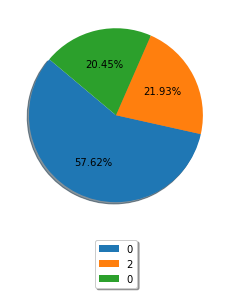

<Figure size 1800x1800 with 0 Axes>

For  Enhances_SocialStatus  :


([<matplotlib.patches.Wedge at 0x201464683d0>,
 [Text(-0.9369145968956428, -0.5763601635469573, ''),
  Text(1.0836582768167131, -0.1889040473008246, ''),
  Text(-0.16283747750035785, 1.0878804878851907, '')],
 [Text(-0.5110443255794415, -0.314378271025613, '39.78%'),
  Text(0.5910863328091162, -0.10303857125499523, '37.17%'),
  Text(-0.08882044227292246, 0.5933893570282858, '23.05%')])

<Figure size 1800x1800 with 0 Axes>

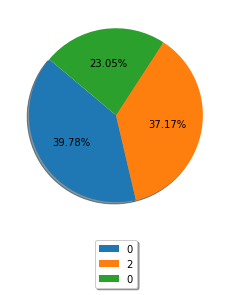

<Figure size 1800x1800 with 0 Axes>

For  Gratification_Shopping  :


([<matplotlib.patches.Wedge at 0x20144c9f430>,
 [Text(-0.7689358945351775, -0.7865987478348707, ''),
  Text(1.04078866067094, 0.3560322510936213, ''),
  Text(-0.4339394505837935, 1.010790063874312, '')],
 [Text(-0.4194195788373695, -0.42905386245538396, '47.58%'),
  Text(0.5677029058205126, 0.19419940968742977, '37.55%'),
  Text(-0.23669424577297826, 0.5513400348405337, '14.87%')])

<Figure size 1800x1800 with 0 Axes>

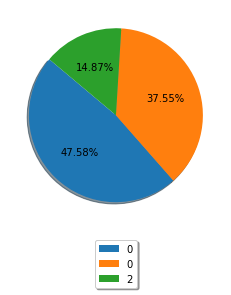

<Figure size 1800x1800 with 0 Axes>

For  Role_Fulfilment  :


([<matplotlib.patches.Wedge at 0x20144e2ccd0>,
 [Text(-0.7870974855441215, -0.7684253693431272, ''),
  Text(1.0905660337600278, 0.14375578600154587, ''),
  Text(-0.25113047920403275, 1.0709498038725966, '')],
 [Text(-0.42932590120588443, -0.41914111055079667, '46.84%'),
  Text(0.5948542002327424, 0.0784122469099341, '32.71%'),
  Text(-0.13698026138401784, 0.5841544384759617, '20.45%')])

<Figure size 1800x1800 with 0 Axes>

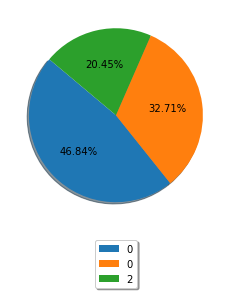

<Figure size 1800x1800 with 0 Axes>

For  Money_Worthy  :


([<matplotlib.patches.Wedge at 0x201465c0fa0>,
 [Text(0.45742854743821504, -1.000379489987957, ''),
  Text(-0.45742850060707113, 1.0003795114017315, '')],
 [Text(0.24950648042084453, -0.545661539993431, '85.87%'),
  Text(-0.24950645487658424, 0.5456615516736717, '14.13%')])

<Figure size 1800x1800 with 0 Axes>

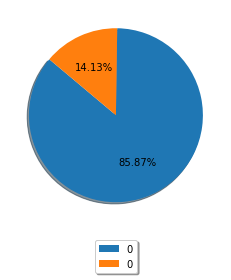

In [42]:
# Pie Plots
  
for i in new_data:
    plt.figure(figsize=(25,25)) 
    fig, ax = plt.subplots()
    print("For ",i," :")
    ax.pie(new_data[i].value_counts(), explode= None, autopct='%1.2f%%', shadow=True, startangle=140)
    
# Shrink current axis's height by 10% on the bottom
    box = ax.get_position()
    ax.set_position([box.x0, box.y0 + box.height * 0.5,box.width, box.height *2])

# Put a legend below current axis
    ax.legend(data[i],loc='upper center', bbox_to_anchor=(0.5, -0.05),fancybox=True, shadow=True)

# Remove patches
    ax.patches.pop()
    
    plt.show()

### Findings:-

- There are more females (67.29%) than males(32.71%) for shopping online.

- The maximum shoppers is from 31-40 years (30.11%), closely followed by 21-30 years (29.37%) and least is of 51 years and above (7.06%). The reason can be due to lack of tech-savvy age group.

- Maximum online shoppers reside in Delhi (21.56%) followed by Greater Noida (15.99%) and least being Bulandshahr (0.74%). However, if we take the Noida and Greater Noida areas then they constitute (30.86%) of the shoppers.

- Maximum shoppers reside have pincode 201308 (14.12%)

- Maximum shoppers are people who have done online purchase for more than 4 years (36.43%) and the least are between 1 and 2 years of online shopping experience (5.95%). However, we see a spike in online shopping promising a good number for business in future.

- 42.38% of shoppers have done less than 10 times shopping through online channel. Whereas, most frequent shoppers say 42 times and above only constitute 2.23%. This indicates people are slowly inclining to online shopping

- 52.79% of shoppers use their mobile ineternet connection for shopping. Least shoppers, use Dial-up connection 1.49%

- 52.42% of shoppers use their smartphones for shopping. While the least frequent device used happens to be tablet (4.46%)

- The above two points tells us that convenience happens to be a vital factor to increase the frequency for online shopping as our mobile phones are usually with us even on the go.

- Maximum shoppers have different screen (49.81%) size of the device they use for shopping. but bare minimum screen size preferred by the shopper is 5.5 inches (36.80%). 

- Maximum shoppers use windows (45.35%) as the operating system for their device and least used is iOS/MAC (23.05%)

- Maximum shoppers use Google Chrome browser (80.30%) for shopping, while minimum used browser is Mozilla Firefox (1.86%). This could be due to popularity of google chrome.

- Maximum shoppers use search engines (85.50%) to arrive at a shopping e-portal for the first time

- Maximum shoppers use search engines (32.34%) to arrive at a shopping e-portal next time. However, the e-retailer's app (31.97%) and direct url (26.02%) is followed closely for the shoppers consequent visit. Social Media happens to be least influencer for a buyer to make a repeat purchase by th same e-retailer. This shows that the buyer is gaining trust and inclined more towards particular e-retailers.

- The shoppers spends more than 15 minutes (45.72%) in the e-retailer's shopping platform before making the purchase. Whereas, impulsive buyers constitute only (10.78%). This points out that shoppers do their research before buying the product. Perhaps a feature which could help them in comparing the similar products to the one a buyer wants can help them save time and increase loyalty towards a particular e-retailer.

- Maximum shoppers use their Credit/Debit cards (55.02%) to make an online purchase while, least use e-wallets(16.73%). The ratio of pre-paid to post-paid is 193:76. This shows that 71.75% of shoppers have complete faith on online shopping. Therefore, tie-ups with banks and e-wallet providers in providing some additional incentives can be beneficial for the e-retailers.

- According to the data provided, shoppers show a greater tendency to abandon the cart (sometimes,frequently and very frequently all combined- 82.16%) than to make a confirmed purchase (never-17.84%).

- The prime most reason for abandoning the card happens to be that shoppers are lured to better alternative offer (49.44%). In broader sense, it comprises about half the time. Least factor influcing abandoning of the cart by a shopper is the e-retailer not having the shopper's preferred mode of payment (5.20%).

- It is necessary for the content on the site must be easy to read and understand.

- Majorly shoppers in their research compare the product they wish to purchase with the similar product.

- Complete information about the seller is equally important to detailed information of the product for buyers to make a purchase.

- Site/app must be easy to navigate and more user-friendly.

- The site/app must have a good loading and processing speed as the buyer's don't like too much time waiting for the page to load

- Majority of the shoppers prefer convenient payment method

- Trust is a major component for the shoppers to make a purchase online

- Maximum shoppers prefer responsiveness and availability of several communication channels (email, online rep, twitter, phone etc.)

- Maximum shoppers prefer e-retailer to keep the privacy of their patrons secured.

- Maximum shoppers are lured to stay loyal if the e-retailers provide monetary benefit and discounts to their users.

- 53.90% shoppers feel enjoyed while shopping online, providing them a good experience to engage in loyalty

- Majorly the shoppers think online shopping is convenient and flexible

- The return policy is very important for the purchaser to be loyal to any e-retailer

- Maximum shoppers prefer gaining access to loyalty programs conducted by the e-retailers provides add-on benefits

- Majority people agree to quality information being displayed on the page improves customer satisfaction and minimum are indifferent, however, nobody disagrees.

- Majority people derive satisfaction by shopping on a good quality website or application.

- Majority people agree to net benefits derived from shopping online can lead to customer satifcation,

- 88.85% users agree that satifaction can only exist if the user has trust on the e-retailer

- About 3/4th of the users are of the opinion that variety and wide range of products help the e-retailers to sustain customer loyalty

- Maximum users agree that providing complete and relevant information about the products is very necessary for a purchaser to buy a product online.

- Maximum users engage into monetary benfits provided by the e-retailers.

- Maximum people agree to online retailers provide convenience of shopping, few seeems indifferent but none disagree.

- Maximum users agree that online shopping gives a sense of adventure. This maybe because there's no physical store and money is being involved in the transaction.

- There is a very close call between users feeling sense of enhanced social status being associated with their preferred online store and being indifferent to be associated with their favorite online store.

- There is a very close call between users feeling sense of gratification being associated with their preferred online store and being indifferent to be associated with their favorite online store.

- Maximum users feel a sense a of role accomplishment by shopping online.

- Majority people get money worth deals online, few are indifferent but none disagree.

- As per the dataset, every user has shopped on amazon.in, followed by paytm.com and flipkart.

- As per the dataset, every user finds amazon.in to be the easiest website to browse, followed by paytm.com and flipkart.

- There's a very close call between Flipkart.com and Amazon.in to be visually appealing.

- There's a very close call between Amazon.in and Flipkart.com to be having wide variety of products.

- Maximum users find details posted about the products to be relevant and complete on amazon.in

- Maximum users find amazon.in to be fastest loading website & application.

- Maximum users find amazon.in to be most reliable website & application.

- Maximum users find amazon.in to be quickest website & application for the purchase of product.

- Amazon.in provides maximum channel partners to facilitate payment.

- There's a very close call between Amazon.in and Flipkart.com for speedy order delivery.

- Amazon.in and Flipkart.com scores most in customer information privacy.

- Amazon.in provides maximum security for customer's finances.

- Amazon.in is perceived as the most trustworthy, followed by flipkart.com.

- Amazon.in has the most online assistance presence through multiple channels.

- Amazon.in takes the longest time to get the user logged in due to promotions, sales etc. This can be a turn-off for the user.

- Amazon.in takes the longest time to display graphics and photo due to promotions, sales etc. This can be a turn-off for the user.

- Myntra.com scores maximum in delay for display of price followed by Paytm.com. whereas, amazon.in, flipkart.com and snapdeal are the quickest in displaying price.

- Myntra.com and amazon.in takes  maximum time in loading the page due to offers, promotions and sales advertisements. Whereas snapdeal.com is the quickest to load.

- Snapdeal.com has the most limited channels for the payment.

- Paytm.com has the longest delivery period according to the users in the dataset.

- Amazon.in scores the most for change in website/app whereas, snapdeal.com scores the least.

- Amazon.in provides frequent disruption while navigating pages mainly due to ads and promotions whereas, paytm.com provides least disruption.

- Amazon.in is the most efficient website as per user ratings and snapdeal.com is the least efficient.

- Amazon.in is the most recommended website/app and paytm.com is the least recommended.

- Female are doing more shopping compared to men and females with age group 21-30 and men of age group 31-40 are shopping more than other age groups.

- There are more customers in Great Noida and they belong to above 4 years of online shopping experience.

- Maximum customers using the e-retail shop for more than 15 mins to make purchase decision and max customers uses credit/debit card as payment option.

In [43]:
new_datap=new_data.drop(["PinCode","Shopping_Since"],axis=1)

<Figure size 3600x3600 with 0 Axes>

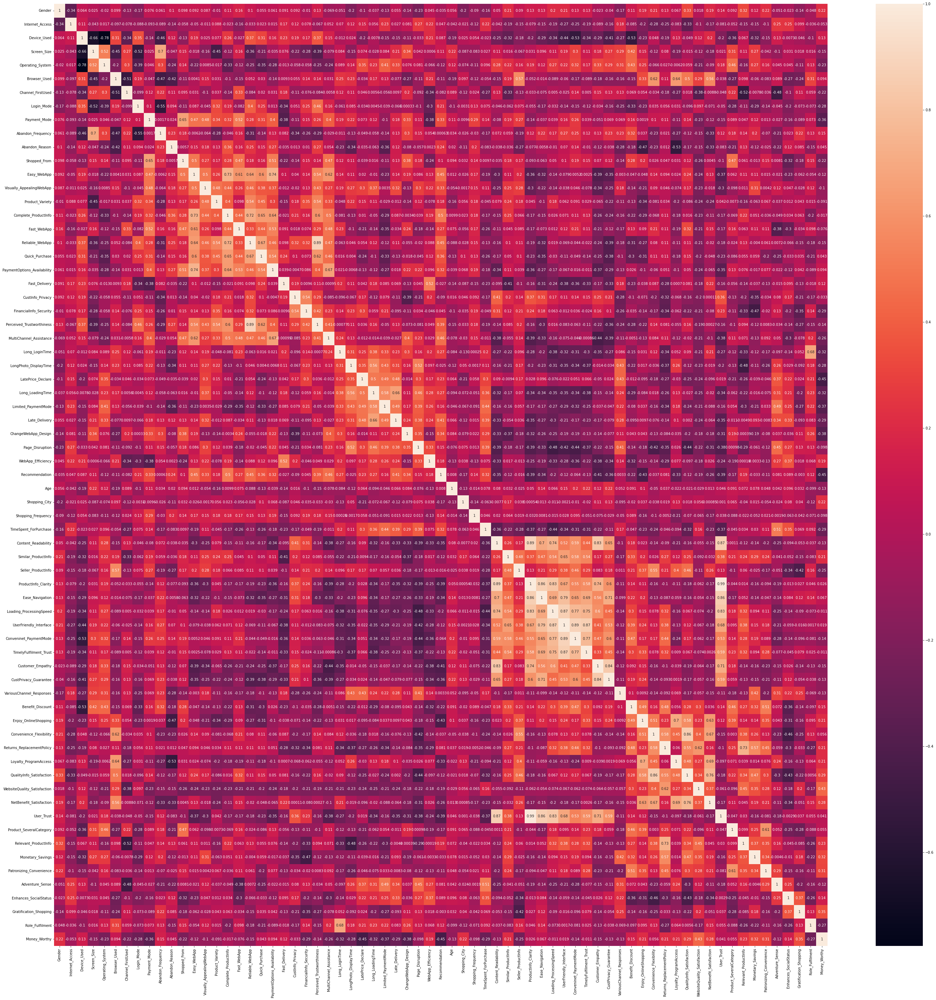

In [44]:
# plotting heat map to check correlation only for the continuous data

plt.figure(figsize=(50,50))                      
plot=sns.heatmap(new_datap.corr(method = "kendall"), annot = True)
fig=plot.get_figure()
fig.savefig("heat.png")

In [45]:
corr=new_datap.corr(method="kendall")
print(corr)

                               Gender  Internet_Access  Device_Used  \
Gender                       1.000000        -0.335142     0.063648   
Internet_Access             -0.335142         1.000000     0.107601   
Device_Used                  0.063648         0.107601     1.000000   
Screen_Size                  0.024868        -0.043135    -0.655473   
Operating_System            -0.019766         0.017444    -0.776845   
Browser_Used                 0.099278        -0.096552     0.309454   
Channel_FirstUsed           -0.125619        -0.077775    -0.344490   
Login_Mode                  -0.174511        -0.088146     0.353829   
Payment_Mode                 0.075849        -0.093013    -0.141386   
Abandon_Frequency            0.061482        -0.089064    -0.460826   
Abandon_Reason               0.103178        -0.136465     0.116746   
Shopped_From                 0.098418        -0.057800    -0.132700   
Easy_WebApp                  0.092443        -0.049554     0.194510   
Visual

In [46]:
def calc_vif(data):

    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = data.columns
    vif["VIF"] = [variance_inflation_factor(data.values, i) for i in range(data.shape[1])]

    return(vif)

In [47]:
calc_vif(data=new_datap.drop(["User_Trust"],axis=1))
# A rule of thumb for interpreting the variance inflation factor:
# 1 = not correlated.
# Between 1 and 5 = moderately correlated.
# Greater than 5 = highly correlated.

<IPython.core.display.Javascript object>

,variables,VIF
0,Gender,2.262256
1,Internet_Access,1.972110
2,Device_Used,37.034346
3,Screen_Size,29.274813
4,Operating_System,37.945534
5,Browser_Used,inf
6,Channel_FirstUsed,inf
7,Login_Mode,inf
8,Payment_Mode,inf
9,Abandon_Frequency,inf


The following Variables have a very high multi-collinearity:

- Device_Used

- Screen_Size	

- Operating_System	

- Browser_Used	
-	Channel_FirstUsed

-	Login_Mode	 

-	Payment_Mode	 

-	Abandon_Frequency	 

-	Abandon_Reason	 

-	Qualityinfo_Satisfaction	 

-	Shopped_From	 

-	Easy_WebApp	 

-	Visually_AppealingWebApp	 

-	Product_Variety	 

-	Complete_Productinfo

-	Fast_WebApp	

-	Reliable_WebApp	

-	Quick_Purchase

-	PaymentOptions_Availability	

-	Fast_Delivery	

-	Custinfo_Privacy	

-	Financialinfo_Security	 

-	Perceived_Trustworthiness

-	MultiChannel_Assistance

-	Long_LoginTime	 

-	LongPhoto_DisplayTime

-	LatePrice_Declare	

-	Long_LoadingTime

-	Limited_PaymentMode	

-	Late_Delivery	

-	ChangeWebApp_Design

-	Page_Disruption	 

-	WebApp_Efficiency

-	Recommendation	 

-	TimeSpent_ForPurchase	

-	Content_Readability

-	Similar_Productinfo	 

-	Seller_Productinfo	

-	Productinfo_Clarity	

-	Ease_Navigation	 

-	Loading_ProcessingSpeed	 

-	UserFriendly_Interface

-	Conveninet_PaymentMode

-	TimelyFulfilment_Trust

-	Customer_Empathy	

-	CustPrivacy_Guarantee	

-	VariousChannel_Responses

-	Benefit_Discount	

-	Enjoy_OnlineShopping

-	Convenience_Flexibility	 

-	Returns_ReplacementPolicy

-	Loyalty_ProgramAccess	

-	WebsiteQuality_Satisfaction	

-	NetBenefit_Satisfaction	 

-	Product_SeveralCategory	

-	Relevant_Productinfo	

-	Monetary_Savings	

-	Patronizing_Convenience	 

-	Adventure_Sense	 

-	Enhances_SocialStatus

-	Gratification_Shopping	 

-	Role_Fulfilment	 

-	Money_Worthy	 

As Trust forms the root cause for any shopper to make a purchase online therefore, we are choosing User_Trust to be the depnedent variable.

In [48]:
feature_data= new_data.drop(["User_Trust"],axis=1)
target_data=new_data[["User_Trust"]]

#### Hypothesis Testing

In [49]:
for i in feature_data:
    crosstab= pd.crosstab(feature_data[i], target_data["User_Trust"])
    
    print (" h0: Average ", i, " of an user does not affect the trust of the user")
    print (" ha: Average ",i," of an user does affect the trust of the user ")
    
# defining the table
    stat, p, dof, expected = ss(crosstab)
    
# interpret p-value
    alpha = 0.05
    print("The result for chi-square test between" ,i, "& "," Trust of the user")
    print("p value is " , str(p))
    if p <= alpha:
        print('Dependent (reject H0)')
    else:
        print('Independent (H0 holds true)')

<IPython.core.display.Javascript object>

 h0: Average  Gender  of an user does not affect the trust of the user
 ha: Average  Gender  of an user does affect the trust of the user 
The result for chi-square test between Gender &   Trust of the user
p value is  0.003348890461951865
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  Internet_Access  of an user does not affect the trust of the user
 ha: Average  Internet_Access  of an user does affect the trust of the user 
The result for chi-square test between Internet_Access &   Trust of the user
p value is  0.44019466570256527
Independent (H0 holds true)


<IPython.core.display.Javascript object>

 h0: Average  Device_Used  of an user does not affect the trust of the user
 ha: Average  Device_Used  of an user does affect the trust of the user 
The result for chi-square test between Device_Used &   Trust of the user
p value is  1.5930052653306626e-18
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  Screen_Size  of an user does not affect the trust of the user
 ha: Average  Screen_Size  of an user does affect the trust of the user 
The result for chi-square test between Screen_Size &   Trust of the user
p value is  7.413472472499492e-40
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  Operating_System  of an user does not affect the trust of the user
 ha: Average  Operating_System  of an user does affect the trust of the user 
The result for chi-square test between Operating_System &   Trust of the user
p value is  7.748107860687543e-08
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  Browser_Used  of an user does not affect the trust of the user
 ha: Average  Browser_Used  of an user does affect the trust of the user 
The result for chi-square test between Browser_Used &   Trust of the user
p value is  1.630331064302981e-56
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  Channel_FirstUsed  of an user does not affect the trust of the user
 ha: Average  Channel_FirstUsed  of an user does affect the trust of the user 
The result for chi-square test between Channel_FirstUsed &   Trust of the user
p value is  8.894814114567787e-14
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  Login_Mode  of an user does not affect the trust of the user
 ha: Average  Login_Mode  of an user does affect the trust of the user 
The result for chi-square test between Login_Mode &   Trust of the user
p value is  1.6998053015277147e-39
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  Payment_Mode  of an user does not affect the trust of the user
 ha: Average  Payment_Mode  of an user does affect the trust of the user 
The result for chi-square test between Payment_Mode &   Trust of the user
p value is  0.0007784158990017829
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  Abandon_Frequency  of an user does not affect the trust of the user
 ha: Average  Abandon_Frequency  of an user does affect the trust of the user 
The result for chi-square test between Abandon_Frequency &   Trust of the user
p value is  0.03874097091149429
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  Abandon_Reason  of an user does not affect the trust of the user
 ha: Average  Abandon_Reason  of an user does affect the trust of the user 
The result for chi-square test between Abandon_Reason &   Trust of the user
p value is  3.609334363494861e-15
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  Shopped_From  of an user does not affect the trust of the user
 ha: Average  Shopped_From  of an user does affect the trust of the user 
The result for chi-square test between Shopped_From &   Trust of the user
p value is  9.85178684934017e-22
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  Easy_WebApp  of an user does not affect the trust of the user
 ha: Average  Easy_WebApp  of an user does affect the trust of the user 
The result for chi-square test between Easy_WebApp &   Trust of the user
p value is  3.1894416397613e-29
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  Visually_AppealingWebApp  of an user does not affect the trust of the user
 ha: Average  Visually_AppealingWebApp  of an user does affect the trust of the user 
The result for chi-square test between Visually_AppealingWebApp &   Trust of the user
p value is  6.826042772698626e-06
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  Product_Variety  of an user does not affect the trust of the user
 ha: Average  Product_Variety  of an user does affect the trust of the user 
The result for chi-square test between Product_Variety &   Trust of the user
p value is  1.518144833309969e-12
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  Complete_ProductInfo  of an user does not affect the trust of the user
 ha: Average  Complete_ProductInfo  of an user does affect the trust of the user 
The result for chi-square test between Complete_ProductInfo &   Trust of the user
p value is  2.0072139871175667e-05
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  Fast_WebApp  of an user does not affect the trust of the user
 ha: Average  Fast_WebApp  of an user does affect the trust of the user 
The result for chi-square test between Fast_WebApp &   Trust of the user
p value is  7.755014315082676e-25
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  Reliable_WebApp  of an user does not affect the trust of the user
 ha: Average  Reliable_WebApp  of an user does affect the trust of the user 
The result for chi-square test between Reliable_WebApp &   Trust of the user
p value is  1.3756731235372124e-12
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  Quick_Purchase  of an user does not affect the trust of the user
 ha: Average  Quick_Purchase  of an user does affect the trust of the user 
The result for chi-square test between Quick_Purchase &   Trust of the user
p value is  7.898646319103743e-12
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  PaymentOptions_Availability  of an user does not affect the trust of the user
 ha: Average  PaymentOptions_Availability  of an user does affect the trust of the user 
The result for chi-square test between PaymentOptions_Availability &   Trust of the user
p value is  2.6802938189669697e-08
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  Fast_Delivery  of an user does not affect the trust of the user
 ha: Average  Fast_Delivery  of an user does affect the trust of the user 
The result for chi-square test between Fast_Delivery &   Trust of the user
p value is  2.2604577565409326e-08
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  CustInfo_Privacy  of an user does not affect the trust of the user
 ha: Average  CustInfo_Privacy  of an user does affect the trust of the user 
The result for chi-square test between CustInfo_Privacy &   Trust of the user
p value is  1.5147165604864244e-40
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  FinancialInfo_Security  of an user does not affect the trust of the user
 ha: Average  FinancialInfo_Security  of an user does affect the trust of the user 
The result for chi-square test between FinancialInfo_Security &   Trust of the user
p value is  2.2361438135071396e-41
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  Perceived_Trustworthiness  of an user does not affect the trust of the user
 ha: Average  Perceived_Trustworthiness  of an user does affect the trust of the user 
The result for chi-square test between Perceived_Trustworthiness &   Trust of the user
p value is  5.253526798192487e-11
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  MultiChannel_Assistance  of an user does not affect the trust of the user
 ha: Average  MultiChannel_Assistance  of an user does affect the trust of the user 
The result for chi-square test between MultiChannel_Assistance &   Trust of the user
p value is  4.255120490028722e-18
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  Long_LoginTime  of an user does not affect the trust of the user
 ha: Average  Long_LoginTime  of an user does affect the trust of the user 
The result for chi-square test between Long_LoginTime &   Trust of the user
p value is  5.792971898576749e-17
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  LongPhoto_DisplayTime  of an user does not affect the trust of the user
 ha: Average  LongPhoto_DisplayTime  of an user does affect the trust of the user 
The result for chi-square test between LongPhoto_DisplayTime &   Trust of the user
p value is  1.463770483206752e-12
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  LatePrice_Declare  of an user does not affect the trust of the user
 ha: Average  LatePrice_Declare  of an user does affect the trust of the user 
The result for chi-square test between LatePrice_Declare &   Trust of the user
p value is  5.674248608809409e-62
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  Long_LoadingTime  of an user does not affect the trust of the user
 ha: Average  Long_LoadingTime  of an user does affect the trust of the user 
The result for chi-square test between Long_LoadingTime &   Trust of the user
p value is  2.0779445577816863e-40
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  Limited_PaymentMode  of an user does not affect the trust of the user
 ha: Average  Limited_PaymentMode  of an user does affect the trust of the user 
The result for chi-square test between Limited_PaymentMode &   Trust of the user
p value is  8.232383263034783e-28
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  Late_Delivery  of an user does not affect the trust of the user
 ha: Average  Late_Delivery  of an user does affect the trust of the user 
The result for chi-square test between Late_Delivery &   Trust of the user
p value is  4.697976769615517e-18
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  ChangeWebApp_Design  of an user does not affect the trust of the user
 ha: Average  ChangeWebApp_Design  of an user does affect the trust of the user 
The result for chi-square test between ChangeWebApp_Design &   Trust of the user
p value is  5.368045942380726e-11
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  Page_Disruption  of an user does not affect the trust of the user
 ha: Average  Page_Disruption  of an user does affect the trust of the user 
The result for chi-square test between Page_Disruption &   Trust of the user
p value is  1.0244953290907242e-26
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  WebApp_Efficiency  of an user does not affect the trust of the user
 ha: Average  WebApp_Efficiency  of an user does affect the trust of the user 
The result for chi-square test between WebApp_Efficiency &   Trust of the user
p value is  2.952102782956151e-10
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  Recommendation  of an user does not affect the trust of the user
 ha: Average  Recommendation  of an user does affect the trust of the user 
The result for chi-square test between Recommendation &   Trust of the user
p value is  1.68762511922861e-11
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  Age  of an user does not affect the trust of the user
 ha: Average  Age  of an user does affect the trust of the user 
The result for chi-square test between Age &   Trust of the user
p value is  0.019735314057718247
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  Shopping_City  of an user does not affect the trust of the user
 ha: Average  Shopping_City  of an user does affect the trust of the user 
The result for chi-square test between Shopping_City &   Trust of the user
p value is  1.1756772317909858e-18
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  PinCode  of an user does not affect the trust of the user
 ha: Average  PinCode  of an user does affect the trust of the user 
The result for chi-square test between PinCode &   Trust of the user
p value is  2.4033606415601903e-49
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  Shopping_Since  of an user does not affect the trust of the user
 ha: Average  Shopping_Since  of an user does affect the trust of the user 
The result for chi-square test between Shopping_Since &   Trust of the user
p value is  1.0
Independent (H0 holds true)


<IPython.core.display.Javascript object>

 h0: Average  Shopping_Frequency  of an user does not affect the trust of the user
 ha: Average  Shopping_Frequency  of an user does affect the trust of the user 
The result for chi-square test between Shopping_Frequency &   Trust of the user
p value is  0.013855341145617496
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  TimeSpent_ForPurchase  of an user does not affect the trust of the user
 ha: Average  TimeSpent_ForPurchase  of an user does affect the trust of the user 
The result for chi-square test between TimeSpent_ForPurchase &   Trust of the user
p value is  2.447397627798821e-14
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  Content_Readability  of an user does not affect the trust of the user
 ha: Average  Content_Readability  of an user does affect the trust of the user 
The result for chi-square test between Content_Readability &   Trust of the user
p value is  5.240002319473075e-57
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  Similar_ProductInfo  of an user does not affect the trust of the user
 ha: Average  Similar_ProductInfo  of an user does affect the trust of the user 
The result for chi-square test between Similar_ProductInfo &   Trust of the user
p value is  2.3375188769228024e-45
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  Seller_ProductInfo  of an user does not affect the trust of the user
 ha: Average  Seller_ProductInfo  of an user does affect the trust of the user 
The result for chi-square test between Seller_ProductInfo &   Trust of the user
p value is  7.852771183038441e-23
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  ProductInfo_Clarity  of an user does not affect the trust of the user
 ha: Average  ProductInfo_Clarity  of an user does affect the trust of the user 
The result for chi-square test between ProductInfo_Clarity &   Trust of the user
p value is  3.8671603833748833e-59
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  Ease_Navigation  of an user does not affect the trust of the user
 ha: Average  Ease_Navigation  of an user does affect the trust of the user 
The result for chi-square test between Ease_Navigation &   Trust of the user
p value is  3.8381190623828584e-45
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  Loading_ProcessingSpeed  of an user does not affect the trust of the user
 ha: Average  Loading_ProcessingSpeed  of an user does affect the trust of the user 
The result for chi-square test between Loading_ProcessingSpeed &   Trust of the user
p value is  5.891225958243284e-56
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  UserFriendly_Interface  of an user does not affect the trust of the user
 ha: Average  UserFriendly_Interface  of an user does affect the trust of the user 
The result for chi-square test between UserFriendly_Interface &   Trust of the user
p value is  3.5871430054747286e-79
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  Conveninet_PaymentMode  of an user does not affect the trust of the user
 ha: Average  Conveninet_PaymentMode  of an user does affect the trust of the user 
The result for chi-square test between Conveninet_PaymentMode &   Trust of the user
p value is  4.073849116991436e-23
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  TimelyFulfilment_Trust  of an user does not affect the trust of the user
 ha: Average  TimelyFulfilment_Trust  of an user does affect the trust of the user 
The result for chi-square test between TimelyFulfilment_Trust &   Trust of the user
p value is  1.2077981648710912e-44
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  Customer_Empathy  of an user does not affect the trust of the user
 ha: Average  Customer_Empathy  of an user does affect the trust of the user 
The result for chi-square test between Customer_Empathy &   Trust of the user
p value is  1.7218978624760967e-47
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  CustPrivacy_Guarantee  of an user does not affect the trust of the user
 ha: Average  CustPrivacy_Guarantee  of an user does affect the trust of the user 
The result for chi-square test between CustPrivacy_Guarantee &   Trust of the user
p value is  2.2498367136807164e-27
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  VariousChannel_Responses  of an user does not affect the trust of the user
 ha: Average  VariousChannel_Responses  of an user does affect the trust of the user 
The result for chi-square test between VariousChannel_Responses &   Trust of the user
p value is  0.46093684930958845
Independent (H0 holds true)


<IPython.core.display.Javascript object>

 h0: Average  Benefit_Discount  of an user does not affect the trust of the user
 ha: Average  Benefit_Discount  of an user does affect the trust of the user 
The result for chi-square test between Benefit_Discount &   Trust of the user
p value is  8.30451448476278e-23
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  Enjoy_OnlineShopping  of an user does not affect the trust of the user
 ha: Average  Enjoy_OnlineShopping  of an user does affect the trust of the user 
The result for chi-square test between Enjoy_OnlineShopping &   Trust of the user
p value is  9.067216435092732e-14
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  Convenience_Flexibility  of an user does not affect the trust of the user
 ha: Average  Convenience_Flexibility  of an user does affect the trust of the user 
The result for chi-square test between Convenience_Flexibility &   Trust of the user
p value is  0.14779344996553448
Independent (H0 holds true)


<IPython.core.display.Javascript object>

 h0: Average  Returns_ReplacementPolicy  of an user does not affect the trust of the user
 ha: Average  Returns_ReplacementPolicy  of an user does affect the trust of the user 
The result for chi-square test between Returns_ReplacementPolicy &   Trust of the user
p value is  0.257676122359274
Independent (H0 holds true)


<IPython.core.display.Javascript object>

 h0: Average  Loyalty_ProgramAccess  of an user does not affect the trust of the user
 ha: Average  Loyalty_ProgramAccess  of an user does affect the trust of the user 
The result for chi-square test between Loyalty_ProgramAccess &   Trust of the user
p value is  7.1547580014795554e-06
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  QualityInfo_Satisfaction  of an user does not affect the trust of the user
 ha: Average  QualityInfo_Satisfaction  of an user does affect the trust of the user 
The result for chi-square test between QualityInfo_Satisfaction &   Trust of the user
p value is  0.01181149223757099
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  WebsiteQuality_Satisfaction  of an user does not affect the trust of the user
 ha: Average  WebsiteQuality_Satisfaction  of an user does affect the trust of the user 
The result for chi-square test between WebsiteQuality_Satisfaction &   Trust of the user
p value is  0.5960195294907924
Independent (H0 holds true)


<IPython.core.display.Javascript object>

 h0: Average  NetBenefit_Satisfaction  of an user does not affect the trust of the user
 ha: Average  NetBenefit_Satisfaction  of an user does affect the trust of the user 
The result for chi-square test between NetBenefit_Satisfaction &   Trust of the user
p value is  0.09533690672657526
Independent (H0 holds true)


<IPython.core.display.Javascript object>

 h0: Average  Product_SeveralCategory  of an user does not affect the trust of the user
 ha: Average  Product_SeveralCategory  of an user does affect the trust of the user 
The result for chi-square test between Product_SeveralCategory &   Trust of the user
p value is  1.282632761210706e-15
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  Relevant_ProductInfo  of an user does not affect the trust of the user
 ha: Average  Relevant_ProductInfo  of an user does affect the trust of the user 
The result for chi-square test between Relevant_ProductInfo &   Trust of the user
p value is  8.172547213686449e-58
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  Monetary_Savings  of an user does not affect the trust of the user
 ha: Average  Monetary_Savings  of an user does affect the trust of the user 
The result for chi-square test between Monetary_Savings &   Trust of the user
p value is  0.13774299523369046
Independent (H0 holds true)


<IPython.core.display.Javascript object>

 h0: Average  Patronizing_Convenience  of an user does not affect the trust of the user
 ha: Average  Patronizing_Convenience  of an user does affect the trust of the user 
The result for chi-square test between Patronizing_Convenience &   Trust of the user
p value is  1.1438077938589067e-05
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  Adventure_Sense  of an user does not affect the trust of the user
 ha: Average  Adventure_Sense  of an user does affect the trust of the user 
The result for chi-square test between Adventure_Sense &   Trust of the user
p value is  6.561352133525623e-08
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  Enhances_SocialStatus  of an user does not affect the trust of the user
 ha: Average  Enhances_SocialStatus  of an user does affect the trust of the user 
The result for chi-square test between Enhances_SocialStatus &   Trust of the user
p value is  1.188245534275392e-09
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  Gratification_Shopping  of an user does not affect the trust of the user
 ha: Average  Gratification_Shopping  of an user does affect the trust of the user 
The result for chi-square test between Gratification_Shopping &   Trust of the user
p value is  1.2670083794481977e-16
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  Role_Fulfilment  of an user does not affect the trust of the user
 ha: Average  Role_Fulfilment  of an user does affect the trust of the user 
The result for chi-square test between Role_Fulfilment &   Trust of the user
p value is  1.592813797268307e-11
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  Money_Worthy  of an user does not affect the trust of the user
 ha: Average  Money_Worthy  of an user does affect the trust of the user 
The result for chi-square test between Money_Worthy &   Trust of the user
p value is  3.180439830765015e-08
Dependent (reject H0)


From the above chi square test we find the following variables to be insignificant :

- Internet_Access

- Shopping_Since

- VariousChannel_Responses

- Convenience_Flexibility

- Returns_ReplacementPolicy

- WebsiteQuality_Satisfaction

- NetBenefit_Satisfaction

- Monetary_Savings

In [50]:
new_data= new_data.drop(["Internet_Access","Shopping_Since","VariousChannel_Responses","Convenience_Flexibility",
                         "Returns_ReplacementPolicy","WebsiteQuality_Satisfaction","NetBenefit_Satisfaction","Monetary_Savings"],axis=1)

In [51]:
def outlier(mydata):                        # Outlier Plotting
    for i in mydata.columns:
        fig = px.box(mydata, y= i, width=600, height=400, title=i, template="plotly_dark")
        fig.show()

In [52]:
outlier(mydata= new_data.drop(["User_Trust"],axis=1))

### Outlier Treatment

In [53]:
for i in new_data.drop(["Browser_Used","QualityInfo_Satisfaction","Content_Readability","Similar_ProductInfo","Customer_Empathy",
                                            "ProductInfo_Clarity","Ease_Navigation","Loading_ProcessingSpeed","UserFriendly_Interface","TimelyFulfilment_Trust",
                                            "Conveninet_PaymentMode","Product_SeveralCategory","Relevant_ProductInfo","Money_Worthy","CustPrivacy_Guarantee","User_Trust"],axis=1).columns:
    new_data[i] = np.where(new_data[i] > (new_data[i].quantile(0.75) + (new_data[i].quantile(0.75) - new_data[i].quantile(0.25))*1.5),
                           (new_data[i].quantile(0.75) + (new_data[i].quantile(0.75) - new_data[i].quantile(0.25))*1.5),
                          np.where(new_data[i] < (new_data[i].quantile(0.25) - (new_data[i].quantile(0.75) - new_data[i].quantile(0.25))*1.5),
                           (new_data[i].quantile(0.25) - (new_data[i].quantile(0.75) - new_data[i].quantile(0.25))*1.5),new_data[i]))
    

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [54]:
outlier(mydata= new_data.drop(["User_Trust"],axis=1))

There are no outliers

In [55]:
data_features1= pd.DataFrame(new_data.drop(["Browser_Used","QualityInfo_Satisfaction","Content_Readability","Similar_ProductInfo","Customer_Empathy",
                                            "ProductInfo_Clarity","Ease_Navigation","Loading_ProcessingSpeed","UserFriendly_Interface","TimelyFulfilment_Trust",
                                            "Conveninet_PaymentMode","Product_SeveralCategory","Relevant_ProductInfo","Money_Worthy","CustPrivacy_Guarantee","User_Trust"], axis=1))
data_rest=pd.DataFrame(new_data[["Browser_Used","QualityInfo_Satisfaction","Content_Readability","Similar_ProductInfo","Customer_Empathy",
                                            "ProductInfo_Clarity","Ease_Navigation","Loading_ProcessingSpeed","UserFriendly_Interface","TimelyFulfilment_Trust",
                                            "Conveninet_PaymentMode","Product_SeveralCategory","Relevant_ProductInfo","Money_Worthy","CustPrivacy_Guarantee","User_Trust"]])


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [56]:
# Removing skewness using Yeo-Johnson
# Removing data skewness
pt = PowerTransformer(method='yeo-johnson',standardize='True')
    
data_noskew= pt.fit_transform(data_features1.values)
data_noskewtab= pd.DataFrame(data_noskew)
data_noskewtab.columns = data_features1.columns

print(data_noskewtab)

<IPython.core.display.Javascript object>

       Gender  Device_Used  Screen_Size  Operating_System  Channel_FirstUsed  \
0    1.434161    -1.826002     0.940101          0.994971      -2.220446e-16   
1   -0.697272     0.647141    -1.797827         -0.156765      -2.220446e-16   
2   -0.697272     0.647141    -0.636518         -1.313730      -2.220446e-16   
3    1.434161     0.647141    -0.636518         -0.156765      -2.220446e-16   
4   -0.697272     0.647141    -1.797827         -0.156765      -2.220446e-16   
5   -0.697272     0.647141    -0.636518         -1.313730      -2.220446e-16   
6    1.434161     2.282350     0.940101         -1.313730      -2.220446e-16   
7    1.434161    -1.826002     0.940101          0.994971      -2.220446e-16   
8   -0.697272     0.647141    -0.636518         -1.313730      -2.220446e-16   
9   -0.697272    -0.742501     0.940101          0.994971      -2.220446e-16   
10   1.434161    -0.742501     0.940101          0.994971      -2.220446e-16   
11  -0.697272    -0.742501     0.940101 

In [57]:
data_final=pd.DataFrame()
data_final=pd.concat([data_noskewtab,data_rest], axis=1)
print(data_final)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

       Gender  Device_Used  Screen_Size  Operating_System  Channel_FirstUsed  \
0    1.434161    -1.826002     0.940101          0.994971      -2.220446e-16   
1   -0.697272     0.647141    -1.797827         -0.156765      -2.220446e-16   
2   -0.697272     0.647141    -0.636518         -1.313730      -2.220446e-16   
3    1.434161     0.647141    -0.636518         -0.156765      -2.220446e-16   
4   -0.697272     0.647141    -1.797827         -0.156765      -2.220446e-16   
5   -0.697272     0.647141    -0.636518         -1.313730      -2.220446e-16   
6    1.434161     2.282350     0.940101         -1.313730      -2.220446e-16   
7    1.434161    -1.826002     0.940101          0.994971      -2.220446e-16   
8   -0.697272     0.647141    -0.636518         -1.313730      -2.220446e-16   
9   -0.697272    -0.742501     0.940101          0.994971      -2.220446e-16   
10   1.434161    -0.742501     0.940101          0.994971      -2.220446e-16   
11  -0.697272    -0.742501     0.940101 

<AxesSubplot:ylabel='Density'>

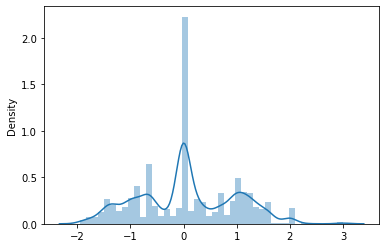

In [58]:
# Dist Plot
sns.distplot(data_final,kde=True, hist=True)

In [59]:
# Dropping indifferent values from the column User_Trust as it is negligible and of not much importance in model building
data_final.drop(data_final.index[data_final['User_Trust'] == 2], inplace = True)

### Splitting the data

In [60]:
def split (data,target):
    data_reset_index = data.reset_index(drop=True)
# Data split
    global x
    global y
    global x_train
    global y_train
    global x_test
    global y_test
# Segregate Feature & Target Variables
    x = data_reset_index.drop(target, axis=1)
    y = data_reset_index[target]
    x_train,x_test,y_train,y_test = train_test_split(x,y, test_size=0.3, random_state=3)
    
    print(x_train.info())
    ("\n")
    print(x_test.info())
    ("\n")
    print(y_train.shape)
    ("\n")
    print(y_test.shape)
    ("\n")

In [61]:
split(data=data_final,
      target="User_Trust")

<class 'pandas.core.frame.DataFrame'>
Int64Index: 184 entries, 70 to 152
Data columns (total 62 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Gender                       184 non-null    float64
 1   Device_Used                  184 non-null    float64
 2   Screen_Size                  184 non-null    float64
 3   Operating_System             184 non-null    float64
 4   Channel_FirstUsed            184 non-null    float64
 5   Login_Mode                   184 non-null    float64
 6   Payment_Mode                 184 non-null    float64
 7   Abandon_Frequency            184 non-null    float64
 8   Abandon_Reason               184 non-null    float64
 9   Shopped_From                 184 non-null    float64
 10  Easy_WebApp                  184 non-null    float64
 11  Visually_AppealingWebApp     184 non-null    float64
 12  Product_Variety              184 non-null    float64
 13  Complete_ProductInf

#### Sorting class imbalance issue using SMOTE

In [62]:
# Smote
sm = SMOTE(random_state = 5)

columns = x_train.columns

train_data = pd.concat([x_train,y_train], axis = 1)

train_data.head()

# Fitting the model
x_os_train, y_os_train  = sm.fit_resample(train_data.drop('User_Trust', axis = 1), train_data['User_Trust'])

y_os_train.value_counts()

## Number of records in Oversampled Train dataset

print('the number of records in x_os_train :', len(x_os_train))
print('the number of records in y_os_train :', len(y_os_train))
print('the number of records in x_test :', len(x_test))
print('the number of records in y_test :', len(y_test))

# Target Class Distribution for Train and test Dataset

print('the ratio of 0 and 1 in y_os_train:')

print(y_os_train.value_counts(normalize = True)*100)

print('the ratio of 0 and 1 in y_test:')

print(y_test.value_counts(normalize = True)*100)

print("Before UpSampling, counts of label '1': {}".format(sum(y_train==1)))
print("Before UpSampling, counts of label '0': {} \n".format(sum(y_train==0)))

print("After UpSampling, counts of label '1': {}".format(sum(y_os_train==1)))
print("After UpSampling, counts of label '0': {} \n".format(sum(y_os_train==0)))

<IPython.core.display.Javascript object>

,Gender,Device_Used,Screen_Size,Operating_System,Channel_FirstUsed,Login_Mode,Payment_Mode,Abandon_Frequency,Abandon_Reason,Shopped_From,Easy_WebApp,Visually_AppealingWebApp,Product_Variety,Complete_ProductInfo,Fast_WebApp,Reliable_WebApp,Quick_Purchase,PaymentOptions_Availability,Fast_Delivery,CustInfo_Privacy,FinancialInfo_Security,Perceived_Trustworthiness,MultiChannel_Assistance,Long_LoginTime,LongPhoto_DisplayTime,LatePrice_Declare,Long_LoadingTime,Limited_PaymentMode,Late_Delivery,ChangeWebApp_Design,Page_Disruption,WebApp_Efficiency,Recommendation,Age,Shopping_City,PinCode,Shopping_Frequency,TimeSpent_ForPurchase,Seller_ProductInfo,Benefit_Discount,Enjoy_OnlineShopping,Loyalty_ProgramAccess,Patronizing_Convenience,Adventure_Sense,Enhances_SocialStatus,Gratification_Shopping,Role_Fulfilment,Browser_Used,QualityInfo_Satisfaction,Content_Readability,Similar_ProductInfo,Customer_Empathy,ProductInfo_Clarity,Ease_Navigation,Loading_ProcessingSpeed,UserFriendly_Interface,TimelyFulfilment_Trust,Conveninet_PaymentMode,Product_SeveralCategory,Relevant_ProductInfo,Money_Worthy,CustPrivacy_Guarantee,User_Trust
70,-0.697272,-1.826002,0.940101,0.994971,-2.220446e-16,-0.625997,0.231553,0.738263,0.311073,0.159238,-1.041293,-0.575094,-0.305917,-0.512664,0.229686,-1.389322,-1.382742,-0.912896,-1.111966,1.473821,1.073214,-1.303004,-1.425646,-0.820823,-0.918613,0.538702,-1.665469,-0.882657,-0.994937,-1.168650,-1.495691,-1.185730,-1.264881,-0.861060,1.241359,1.642693,0.903763,-0.925619,1.369495,1.409073,0.707817,-0.706730,-0.633279,-0.846590,0.186843,0.389934,0.439985,0,0,1,1,1,1,1,1,1,1,1,0,0,0,2,1
257,-0.697272,0.647141,-1.797827,-0.156765,-2.220446e-16,1.181147,0.231553,-1.647435,-0.962135,0.159238,0.350739,1.590719,1.615918,0.923819,-1.489434,0.995153,0.624863,0.387101,-1.111966,1.114495,1.527788,0.988375,0.785530,0.473867,1.147163,0.538702,0.707645,1.085966,0.182354,-1.168650,1.254023,1.413180,0.576360,-0.861060,1.241359,1.642693,-0.096362,0.977918,1.604803,-0.643753,-0.907231,1.184987,-0.633279,1.387991,0.186843,-1.017991,0.439985,3,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0
162,-0.697272,0.647141,-0.636518,-1.313730,-2.220446e-16,1.181147,1.589852,0.738263,1.368324,1.780477,1.345887,1.117527,1.053930,1.263842,1.086710,0.995153,0.895252,1.622360,-1.111966,-1.304117,0.576750,0.988375,1.442517,0.909242,0.707366,0.043673,0.296428,-1.408905,0.182354,1.183856,0.932513,-1.185730,1.106204,1.240000,-0.492338,0.392961,1.227468,-0.081039,-0.655134,-0.643753,-0.907231,-0.706730,-0.633279,-0.846590,-1.152230,1.135698,1.194690,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
229,-0.697272,0.647141,-1.797827,-0.156765,-2.220446e-16,1.181147,0.231553,-1.647435,-0.962135,0.159238,0.350739,1.590719,1.615918,0.923819,-1.489434,0.995153,0.624863,0.387101,-1.111966,1.114495,1.527788,0.988375,0.785530,0.473867,1.147163,0.538702,0.707645,1.085966,0.182354,-1.168650,1.254023,1.413180,0.576360,-0.049714,0.180297,-0.820097,0.903763,0.977918,1.604803,-0.643753,-0.907231,1.184987,-0.633279,1.387991,0.186843,-1.017991,0.439985,3,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0
47,1.434161,0.647141,-0.636518,-0.156765,-2.220446e-16,0.036307,0.231553,-0.913983,-0.962135,0.159238,0.350739,0.367354,-0.305917,-0.512664,0.820636,0.201233,0.306931,-0.354716,1.203006,-0.010521,0.307669,0.751806,0.193169,1.280356,0.935377,0.043673,0.707645,0.537682,0.182354,-0.261337,-0.976296,0.310865,-0.338480,-1.915474,-1.353017,-1.369110,-1.088379,-0.925619,1.604803,-0.643753,1.291541,1.495234,-0.633279,-0.846590,-1.152230,-1.017991,1.194690,3,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0


1    170
0    170
Name: User_Trust, dtype: int64

the number of records in x_os_train : 340
the number of records in y_os_train : 340
the number of records in x_test : 80
the number of records in y_test : 80
the ratio of 0 and 1 in y_os_train:
1    50.0
0    50.0
Name: User_Trust, dtype: float64
the ratio of 0 and 1 in y_test:
0    86.25
1    13.75
Name: User_Trust, dtype: float64
Before UpSampling, counts of label '1': 14
Before UpSampling, counts of label '0': 170 

After UpSampling, counts of label '1': 170
After UpSampling, counts of label '0': 170 



### Scaling the data

In [63]:
scale_1= StandardScaler()
scale_2= MinMaxScaler()
scale_3= RobustScaler()
model= LinearRegression()

<IPython.core.display.Javascript object>

In [64]:
pipe1 = Pipeline([
    ('Scale',scale_1),
    ('model',model),
])    
pipe2 = Pipeline([
    ('Scale',scale_2),
    ('model',model),
])
pipe3 = Pipeline([
    ('Scale',scale_3),
    ('model',model),  
    
])

In [65]:
# Create Function Name 
def pre_process(data, pipe):

# Pipe.fit, pipe.predict and accuracy
    
    pipe.fit(x_train,y_train)
    
    y_pred = pipe.predict(x_test)
    
    score = np.sqrt(metrics.mean_squared_error(y_pred, y_test))
    
    return score

In [66]:
pre_process(data= data_final ,
           pipe= pipe1)

<IPython.core.display.Javascript object>

3.5612144956166213e-16

In [67]:
pre_process(data= data_final ,
           pipe= pipe2)

<IPython.core.display.Javascript object>

7.683489576213924e-16

In [68]:
pre_process(data= data_final ,
           pipe= pipe3)

<IPython.core.display.Javascript object>

4.682331659844243e-16

Since MinMax Scaler scores the best we use that method for scaling

In [69]:
scalar= MinMaxScaler()
scalar.fit(x_train)
x_trainsc =  scalar.transform(x_os_train)
x_testsc  =  scalar.transform(x_test)

MinMaxScaler()

#### Principal Component Analysis (PCA)

In [70]:
pca = PCA(n_components = 0.5)
pca.fit(x_trainsc)
x_train_model = pca.transform(x_trainsc)
x_test_model = pca.transform(x_testsc)
ex_variance=np.var(x_train_model,axis=0)
ex_variance_ratio = ex_variance/np.sum(ex_variance)

print("shape of x_train_pca", x_train_model.shape)
print('')    
print("Explained Variance Ratio for Training Dataset: \n", ex_variance_ratio)

print(" ")

ex_variance_1 = np.var(x_test_model , axis=0)
ex_variance_ratio_1 = ex_variance_1 / np.sum(ex_variance_1)
    
print("Explained Variance Ratio for Test Dataset: \n", ex_variance_ratio_1) 
print(" ")

PCA(n_components=0.5)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

shape of x_train_pca (340, 3)

Explained Variance Ratio for Training Dataset: 
 [0.62577413 0.23029728 0.14392859]
 


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Explained Variance Ratio for Test Dataset: 
 [0.52257598 0.24779862 0.2296254 ]
 


### Model Building

In [71]:
#### Naive Baye's Model

In [72]:
nb_model          =      GaussianNB()

## Model.fit

nb_model.fit(x_trainsc, y_os_train)

## Model.predict


y_pred_nb_0 = nb_model.predict(x_testsc)

### Naive Bayes

conf_matrix_nb = confusion_matrix(y_test, y_pred_nb_0, labels=[0, 1])

df_cmatrix_nb = pd.DataFrame(conf_matrix_nb, index = [i for i in [0, 1]],
                  columns = [i for i in ["Predict_Rejected","Predict_Accepted"]])


fig_cmatrix_nb = px.imshow(df_cmatrix_nb , title = "Confusion Matrix for NB Classifier Model")

## Saving the Classification Reports : precision, recall, f1-score ##


pred_report_nb = classification_report(y_test, y_pred_nb_0 , digits=2)

### NB Classifier

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test,  y_pred_nb_0)
roc_nb = auc(false_positive_rate, true_positive_rate)


print("The Accuracy Score For The NB Classifier Model Is :  ", accuracy_score(y_test, y_pred_nb_0))
print("\n")
print("The roc_auc score for NB Classifier Model:  ", roc_nb)



##  Confusion Matrices 


fig_cmatrix_nb.show()

### Classification Reports 

print("Title : The Classification Report for NB Classifier Model: \n  ", pred_report_nb)

GaussianNB()

<IPython.core.display.Javascript object>

The Accuracy Score For The NB Classifier Model Is :   1.0


The roc_auc score for NB Classifier Model:   1.0


Title : The Classification Report for NB Classifier Model: 
                 precision    recall  f1-score   support

           0       1.00      1.00      1.00        69
           1       1.00      1.00      1.00        11

    accuracy                           1.00        80
   macro avg       1.00      1.00      1.00        80
weighted avg       1.00      1.00      1.00        80



In [73]:
##### K Fold Cross Validation ####
    
cross_valid = True
cv_score = cross_val_score(nb_model , x , y, scoring = 'accuracy', 
                                          cv = KFold(n_splits = 10))
accuracy = accuracy_score(y_test, y_pred_nb_0)

print("The Cross Validation Score For Baseline Naive Baye's Model Classifier Model After", "Fold Cross Validation Is :  \n", cv_score)
print(" ")
print("The Accuracy Score For Baseline Naive Baye's Model Classifier Model After Cross Validation Is: \n", accuracy)

The Cross Validation Score For Baseline Naive Baye's Model Classifier Model After Fold Cross Validation Is :  
 [0.96296296 1.         1.         1.         1.         1.
 1.         1.         1.         1.        ]
 
The Accuracy Score For Baseline Naive Baye's Model Classifier Model After Cross Validation Is: 
 1.0


In [74]:
# Best Parameter Tuning

cv_method = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=100)

params_NB = {'var_smoothing': np.logspace(100,-100, num=1000)}

gs_NB = GridSearchCV(estimator=nb_model, 
                     param_grid=params_NB, 
                     cv=cv_method,
                     verbose=1, 
                     scoring='accuracy')

Data_transformed = PowerTransformer().fit_transform(x_testsc)

gs_NB.fit(Data_transformed, y_test)

print("The best Parameter is : ", gs_NB.best_params_)

print("The best score is: ", gs_NB.best_score_)

<IPython.core.display.Javascript object>

Fitting 15 folds for each of 1000 candidates, totalling 15000 fits


GridSearchCV(cv=RepeatedStratifiedKFold(n_repeats=3, n_splits=5, random_state=100),
             estimator=GaussianNB(),
             param_grid={'var_smoothing': array([1.00000000e+100, 6.30666554e+099, 3.97740302e+099, 2.50841506e+099,
       1.58197348e+099, 9.97697764e+098, 6.29214611e+098, 3.96824610e+098,
       2.50264010e+098, 1.57833141e+098, 9.95400829e+097, 6.27766011e+097,
       3.95911027e+097, 2.4...
       6.36507908e-097, 4.01424249e-097, 2.53164848e-097, 1.59662602e-097,
       1.00693863e-097, 6.35042517e-098, 4.00500076e-098, 2.52582003e-098,
       1.59295021e-098, 1.00462042e-098, 6.33580499e-099, 3.99578030e-099,
       2.52000499e-099, 1.58928287e-099, 1.00230755e-099, 6.32121848e-100,
       3.98658107e-100, 2.51420335e-100, 1.58562396e-100, 1.00000000e-100])},
             scoring='accuracy', verbose=1)

The best Parameter is :  {'var_smoothing': 1.9966424501097606}
The best score is:  1.0


In [75]:
nb_model2          =      GaussianNB(var_smoothing= 1.9966424501097606)

## Model.fit

nb_model2.fit(x_trainsc, y_os_train)

## Model.predict


y_pred_nb_0 = nb_model2.predict(x_testsc)

### Naive Bayes

conf_matrix_nb = confusion_matrix(y_test, y_pred_nb_0, labels=[0, 1])

df_cmatrix_nb = pd.DataFrame(conf_matrix_nb, index = [i for i in [0, 1]],
                  columns = [i for i in ["Predict_Rejected","Predict_Accepted"]])


fig_cmatrix_nb = px.imshow(df_cmatrix_nb , title = "Confusion Matrix for NB Classifier Model")

## Saving the Classification Reports : precision, recall, f1-score ##


pred_report_nb = classification_report(y_test, y_pred_nb_0 , digits=2)

### NB Classifier

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test,  y_pred_nb_0)
roc_nb = auc(false_positive_rate, true_positive_rate)


print("The Accuracy Score For The NB Classifier Model Is :  ", accuracy_score(y_test, y_pred_nb_0))
print("\n")
print("The roc_auc score for NB Classifier Model:  ", roc_nb)



##  Confusion Matrices 


fig_cmatrix_nb.show()

### Classification Reports 

print("Title : The Classification Report for NB Classifier Model: \n  ", pred_report_nb)

GaussianNB(var_smoothing=1.9966424501097606)

<IPython.core.display.Javascript object>

The Accuracy Score For The NB Classifier Model Is :   1.0


The roc_auc score for NB Classifier Model:   1.0


Title : The Classification Report for NB Classifier Model: 
                 precision    recall  f1-score   support

           0       1.00      1.00      1.00        69
           1       1.00      1.00      1.00        11

    accuracy                           1.00        80
   macro avg       1.00      1.00      1.00        80
weighted avg       1.00      1.00      1.00        80



#### Linear Discriminant Analysis Model

In [76]:
# Training the model
lda_model         =      LinearDiscriminantAnalysis()

## Model.fit

lda_model.fit(x_trainsc, y_os_train)

## Model.predict

y_lda_0 = lda_model.predict(x_testsc)

## Linear Discriminant Analysis Model


conf_matrix_lda =  confusion_matrix(y_test, y_lda_0 , labels=[0, 1])

df_cmatrix_lda   = pd.DataFrame(conf_matrix_lda , index = [i for i in [0, 1]],
                  columns = [i for i in ["Predict_Rejected","Predict_Accepted"]])


fig_cmatrix_lda = px.imshow(df_cmatrix_lda , title = "Confusion Matrix for Baseline Linear Discriminant Analysis Model")

## Saving the Classification Reports : precision, recall, f1-score ##

pred_report_lda = classification_report(y_test, y_lda_0 , digits=2)

### Saving the ROC_AUC Scores for Algorithms

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_lda_0)
roc_lda = auc(false_positive_rate, true_positive_rate)



##  Confusion Matrices 

fig_cmatrix_lda.show()

### Classification Reports 

print("Title : The Classification Report for Linear Discriminant Model: \n  ", pred_report_lda)

#### Printing the Accuracy Scores 

print("The Accuracy Score For The Linear Discriminant Analysis Model Is :  ",   
      accuracy_score(y_test, y_lda_0))

###  roc_auc scores 

print("The roc_auc score for Linear Discriminat Analysis Model:  ", roc_lda)

LinearDiscriminantAnalysis()

<IPython.core.display.Javascript object>

Title : The Classification Report for Linear Discriminant Model: 
                 precision    recall  f1-score   support

           0       1.00      1.00      1.00        69
           1       1.00      1.00      1.00        11

    accuracy                           1.00        80
   macro avg       1.00      1.00      1.00        80
weighted avg       1.00      1.00      1.00        80

The Accuracy Score For The Linear Discriminant Analysis Model Is :   1.0
The roc_auc score for Linear Discriminat Analysis Model:   1.0


In [77]:
##### K Fold Cross Validation ####
    
cross_valid = True
cv_score = cross_val_score(lda_model , x , y, scoring = 'accuracy', 
                                          cv = KFold(n_splits = 10))
accuracy = accuracy_score(y_test, y_lda_0)

print("The Cross Validation Score For Baseline Linear Discriminant Model After", "Fold Cross Validation Is :  \n", cv_score)
print(" ")
print("The Accuracy Score For Baseline Linear Discriminant Model After Cross Validation Is: \n", accuracy)

The Cross Validation Score For Baseline Linear Discriminant Model After Fold Cross Validation Is :  
 [0.96296296 1.         1.         1.         1.         1.
 1.         1.         1.         1.        ]
 
The Accuracy Score For Baseline Linear Discriminant Model After Cross Validation Is: 
 1.0


In [78]:
# Best Hyper Parameter Tuning

cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)

solver= ['svd','lsqr','eigen']
n_components= np.logspace(10,-10, num=2)
store_covariance= [True,False]
tol=np.logspace(100,-100, num=10)
param_grid = dict(solver= solver,
                   n_components= n_components,
                   store_covariance= store_covariance,
                   tol=tol)

gs_lda = GridSearchCV(estimator=lda_model, 
                     param_grid=param_grid, 
                     cv=cv_method,
                     verbose=1, 
                     scoring='accuracy')

Data_transformed = PowerTransformer().fit_transform(x_testsc)

gs_lda.fit(Data_transformed, y_test)

print("The Best Parameters are: ","\n",gs_lda.best_params_)
print("The Best score is: ","\n",gs_lda.best_score_)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Fitting 15 folds for each of 120 candidates, totalling 1800 fits


GridSearchCV(cv=RepeatedStratifiedKFold(n_repeats=3, n_splits=5, random_state=100),
             estimator=LinearDiscriminantAnalysis(),
             param_grid={'n_components': array([1.e+10, 1.e-10]),
                         'solver': ['svd', 'lsqr', 'eigen'],
                         'store_covariance': [True, False],
                         'tol': array([1.00000000e+100, 5.99484250e+077, 3.59381366e+055, 2.15443469e+033,
       1.29154967e+011, 7.74263683e-012, 4.64158883e-034, 2.78255940e-056,
       1.66810054e-078, 1.00000000e-100])},
             scoring='accuracy', verbose=1)

The Best Parameters are:  
 {'n_components': 1e-10, 'solver': 'lsqr', 'store_covariance': True, 'tol': 1e+100}
The Best score is:  
 0.35


In [79]:
# Training the model
lda_model2 = LinearDiscriminantAnalysis(n_components=1e-10, solver='lsqr', store_covariance=True, tol=1e+100)

## Model.fit

lda_model2.fit(x_trainsc, y_os_train)

## Model.predict

y_lda_0 = lda_model2.predict(x_testsc)

## Linear Discriminant Analysis Model


conf_matrix_lda =  confusion_matrix(y_test, y_lda_0 , labels=[0, 1])

df_cmatrix_lda   = pd.DataFrame(conf_matrix_lda , index = [i for i in [0, 1]],
                  columns = [i for i in ["Predict_Rejected","Predict_Accepted"]])


fig_cmatrix_lda = px.imshow(df_cmatrix_lda , title = "Confusion Matrix for Baseline Linear Discriminant Analysis Model")

## Saving the Classification Reports : precision, recall, f1-score ##

pred_report_lda = classification_report(y_test, y_lda_0 , digits=2)

### Saving the ROC_AUC Scores for Algorithms

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_lda_0)
roc_lda = auc(false_positive_rate, true_positive_rate)



##  Confusion Matrices 

fig_cmatrix_lda.show()

### Classification Reports 

print("Title : The Classification Report for Linear Discriminant Model: \n  ", pred_report_lda)

#### Printing the Accuracy Scores 

print("The Accuracy Score For The Linear Discriminant Analysis Model Is :  ",   
      accuracy_score(y_test, y_lda_0))
###  roc_auc scores 

print("The roc_auc score for Linear Discriminat Analysis Model:  ", roc_lda)

LinearDiscriminantAnalysis(n_components=1e-10, solver='lsqr',
                           store_covariance=True, tol=1e+100)

<IPython.core.display.Javascript object>

Title : The Classification Report for Linear Discriminant Model: 
                 precision    recall  f1-score   support

           0       0.00      0.00      0.00      69.0
           1       0.00      0.00      0.00      11.0

    accuracy                           0.00      80.0
   macro avg       0.00      0.00      0.00      80.0
weighted avg       0.00      0.00      0.00      80.0

The Accuracy Score For The Linear Discriminant Analysis Model Is :   0.0
The roc_auc score for Linear Discriminat Analysis Model:   0.0


#### Quadratic Discriminant Analysis Model

In [80]:
# Training the Model

qda_model         =      QuadraticDiscriminantAnalysis()

## Model.fit

qda_model.fit(x_trainsc, y_os_train)

## Model.predict

y_qda_0 = qda_model.predict(x_testsc)

## Quadratic Discriminant Analysis Model

conf_matrix_qda = confusion_matrix(y_test, y_qda_0 , labels=[0, 1])

df_cmatrix_qda = pd.DataFrame(conf_matrix_qda, index = [i for i in [0, 1]],
                  columns = [i for i in ["Predict_Rejected","Predict_Accepted"]])


fig_cmatrix_qda = px.imshow(df_cmatrix_qda , title = "Confusion Matrix for Baseline Quadratic Discriminant Analysis Model")

## Saving the Classification Reports : precision, recall, f1-score ##

pred_report_qda = classification_report(y_test, y_qda_0 , digits=2)

### Saving the ROC_AUC Scores for Baseline Algorithms

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_qda_0)
roc_qda = auc(false_positive_rate, true_positive_rate)

#### Printing the Accuracy Scores 

print("The Accuracy Score For The Quadratic inear Discriminant Analysis Model Is :  ",   
      accuracy_score(y_test, y_qda_0))
###  roc_auc scores 

print("The roc_auc score for Baseline Quadratic Discriminat Analysis Model:  ", roc_qda)

##  Confusion Matrices 

fig_cmatrix_qda.show()

### Classification Reports 

print("Title : The Classification Report for Quadratic Discriminant Model: \n ", pred_report_qda)



QuadraticDiscriminantAnalysis()

<IPython.core.display.Javascript object>

The Accuracy Score For The Quadratic inear Discriminant Analysis Model Is :   1.0
The roc_auc score for Baseline Quadratic Discriminat Analysis Model:   1.0


Title : The Classification Report for Quadratic Discriminant Model: 
                precision    recall  f1-score   support

           0       1.00      1.00      1.00        69
           1       1.00      1.00      1.00        11

    accuracy                           1.00        80
   macro avg       1.00      1.00      1.00        80
weighted avg       1.00      1.00      1.00        80



In [81]:
##### K Fold Cross Validation ####
    
cross_valid = True
cv_score = cross_val_score(qda_model , x , y, scoring = 'accuracy', 
                                          cv = KFold(n_splits = 10))
accuracy = accuracy_score(y_test, y_qda_0)

print("The Cross Validation Score For Baseline Quadratic Discriminant Model  After", "Fold Cross Validation Is :  \n", cv_score)
print(" ")
print("The Accuracy Score For Baseline Quadratic Discriminant Model  After Cross Validation Is: \n", accuracy)

The Cross Validation Score For Baseline Quadratic Discriminant Model  After Fold Cross Validation Is :  
 [0.92592593 0.88888889 0.88888889 0.92592593 0.88461538 0.84615385
 0.96153846 0.88461538 0.88461538 0.96153846]
 
The Accuracy Score For Baseline Quadratic Discriminant Model  After Cross Validation Is: 
 1.0


In [82]:
## Hyperparameter Tuning
store_covariance= [True,False]
tol=np.logspace(100,-100, num=10)
param_grid = dict(store_covariance= store_covariance, tol=tol)

gs_qda = GridSearchCV(estimator=qda_model, 
                     param_grid=param_grid, 
                     cv=cv_method,
                     verbose=1, 
                     scoring='accuracy')

Data_transformed = PowerTransformer().fit_transform(x_testsc)

gs_qda.fit(Data_transformed, y_test)

print("The Best Parameters are: ","\n",gs_qda.best_params_)
print("The Best score is: ","\n",gs_qda.best_score_)

<IPython.core.display.Javascript object>

Fitting 15 folds for each of 20 candidates, totalling 300 fits


GridSearchCV(cv=RepeatedStratifiedKFold(n_repeats=3, n_splits=5, random_state=100),
             estimator=QuadraticDiscriminantAnalysis(),
             param_grid={'store_covariance': [True, False],
                         'tol': array([1.00000000e+100, 5.99484250e+077, 3.59381366e+055, 2.15443469e+033,
       1.29154967e+011, 7.74263683e-012, 4.64158883e-034, 2.78255940e-056,
       1.66810054e-078, 1.00000000e-100])},
             scoring='accuracy', verbose=1)

The Best Parameters are:  
 {'store_covariance': True, 'tol': 1e+100}
The Best score is:  
 0.9541666666666667


In [83]:
# Training the Model

qda_model2         =      QuadraticDiscriminantAnalysis(store_covariance=True, tol=1e+100)

## Model.fit

qda_model2.fit(x_trainsc, y_os_train)

## Model.predict

y_qda_0 = qda_model2.predict(x_testsc)

## Quadratic Discriminant Analysis Model

conf_matrix_qda = confusion_matrix(y_test, y_qda_0 , labels=[0, 1])

df_cmatrix_qda = pd.DataFrame(conf_matrix_qda, index = [i for i in [0, 1]],
                  columns = [i for i in ["Predict_Rejected","Predict_Accepted"]])


fig_cmatrix_qda = px.imshow(df_cmatrix_qda , title = "Confusion Matrix for Baseline Quadratic Discriminant Analysis Model")

## Saving the Classification Reports : precision, recall, f1-score ##

pred_report_qda = classification_report(y_test, y_qda_0 , digits=2)

### Saving the ROC_AUC Scores for Baseline Algorithms

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_qda_0)
roc_qda = auc(false_positive_rate, true_positive_rate)


###  roc_auc scores 

print("The roc_auc score for Baseline Quadratic Discriminat Analysis Model:  ", roc_qda)

#### Printing the Accuracy Scores 

print("The Accuracy Score For The Quadratic inear Discriminant Analysis Model Is :  ",   
      accuracy_score(y_test, y_qda_0))

##  Confusion Matrices 

fig_cmatrix_qda.show()



### Classification Reports 

print("Title : The Classification Report for Quadratic Discriminant Model: \n ", pred_report_qda)



QuadraticDiscriminantAnalysis(store_covariance=True, tol=1e+100)

<IPython.core.display.Javascript object>

The roc_auc score for Baseline Quadratic Discriminat Analysis Model:   1.0
The Accuracy Score For The Quadratic inear Discriminant Analysis Model Is :   1.0


Title : The Classification Report for Quadratic Discriminant Model: 
                precision    recall  f1-score   support

           0       1.00      1.00      1.00        69
           1       1.00      1.00      1.00        11

    accuracy                           1.00        80
   macro avg       1.00      1.00      1.00        80
weighted avg       1.00      1.00      1.00        80



#### K-Nearest Neighbor Model

In [84]:
# Training the model
knn_model          =       KNeighborsClassifier()

## Model.fit

knn_model.fit(x_trainsc, y_os_train)

## Model.predict

y_knn_0 = knn_model.predict(x_testsc)

## K- Nearest Neighbor Model

conf_matrix_knn = confusion_matrix(y_test, y_knn_0 , labels=[0, 1])

df_cmatrix_knn = pd.DataFrame(conf_matrix_knn, index = [i for i in [0, 1]],
                  columns = [i for i in ["Predict_Rejected","Predict_Accepted"]])


fig_cmatrix_knn = px.imshow(df_cmatrix_knn , title = "Confusion Matrix for K-Nearest Neighbor Model")

## Saving the Classification Reports : precision, recall, f1-score ##

pred_report_knn = classification_report(y_test, y_knn_0 , digits=2)

### Saving the ROC_AUC Scores for Baseline Algorithms

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_knn_0)
roc_knn = auc(false_positive_rate, true_positive_rate)

#### Printing the Accuracy Scores 

print("The Accuracy Score For The K-Nearest Neighbor Analysis Model Is :  ",   
      accuracy_score(y_test, y_knn_0))

###  roc_auc scores 

print("The roc_auc score for K-Nearest Neighbor Analysis Model:  ", roc_knn)

##  Confusion Matrices 

fig_cmatrix_knn.show()

### Classification Reports 

print("Title : The Classification Report for K-Nearest Neighbor Model: \n ", pred_report_knn)



KNeighborsClassifier()

<IPython.core.display.Javascript object>

The Accuracy Score For The K-Nearest Neighbor Analysis Model Is :   1.0
The roc_auc score for K-Nearest Neighbor Analysis Model:   1.0


Title : The Classification Report for K-Nearest Neighbor Model: 
                precision    recall  f1-score   support

           0       1.00      1.00      1.00        69
           1       1.00      1.00      1.00        11

    accuracy                           1.00        80
   macro avg       1.00      1.00      1.00        80
weighted avg       1.00      1.00      1.00        80



In [85]:
##### K Fold Cross Validation ####
    
cross_valid = True
cv_score = cross_val_score(knn_model , x , y, scoring = 'accuracy', 
                                          cv = KFold(n_splits = 10))
accuracy = accuracy_score(y_test, y_knn_0)

print("The Cross Validation Score For Baseline K- Nearest Neighbour Classifier Model After", "Fold Cross Validation Is :  \n", cv_score)
print(" ")
print("The Accuracy Score For Baseline K- Nearest Neighbour Classifier Model After Cross Validation Is: \n", accuracy)

The Cross Validation Score For Baseline K- Nearest Neighbour Classifier Model After Fold Cross Validation Is :  
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 
The Accuracy Score For Baseline K- Nearest Neighbour Classifier Model After Cross Validation Is: 
 1.0


In [86]:
### Hyperparameter Tuning
algorithm= ['auto','ball_tree','kd_tree','brute']
metric= ['minkowski','manhattan','euclidean']
n_neighbors= [3,5,7,9,11,13,15]
weights= ['uniform','distance']
p= [1,2]

param_grid = dict(algorithm=algorithm,metric= metric, n_neighbors=n_neighbors, weights=weights, p=p)

gs_knn = GridSearchCV(estimator=knn_model, 
                     param_grid=param_grid, 
                     cv=3,
                     verbose=1, 
                     scoring='accuracy')

Data_transformed = PowerTransformer().fit_transform(x_testsc)

gs_knn.fit(Data_transformed, y_test)

print("The Best Parameters are: ","\n",gs_knn.best_params_)
print("The Best score is: ","\n",gs_knn.best_score_)

Fitting 3 folds for each of 336 candidates, totalling 1008 fits


GridSearchCV(cv=3, estimator=KNeighborsClassifier(),
             param_grid={'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                         'metric': ['minkowski', 'manhattan', 'euclidean'],
                         'n_neighbors': [3, 5, 7, 9, 11, 13, 15], 'p': [1, 2],
                         'weights': ['uniform', 'distance']},
             scoring='accuracy', verbose=1)

The Best Parameters are:  
 {'algorithm': 'auto', 'metric': 'minkowski', 'n_neighbors': 3, 'p': 1, 'weights': 'uniform'}
The Best score is:  
 1.0


In [87]:
# Training the model
knn_model2        =     KNeighborsClassifier(algorithm='auto', metric='minkowski', n_neighbors=3, p=1, weights='uniform')

## Model.fit

knn_model2.fit(x_trainsc, y_os_train)

## Model.predict

y_knn_0 = knn_model2.predict(x_testsc)

## K- Nearest Neighbor Model

conf_matrix_knn = confusion_matrix(y_test, y_knn_0 , labels=[0, 1])

df_cmatrix_knn = pd.DataFrame(conf_matrix_knn, index = [i for i in [0, 1]],
                  columns = [i for i in ["Predict_Rejected","Predict_Accepted"]])


fig_cmatrix_knn = px.imshow(df_cmatrix_knn , title = "Confusion Matrix for K-Nearest Neighbor Model")

## Saving the Classification Reports : precision, recall, f1-score ##

pred_report_knn = classification_report(y_test, y_knn_0 , digits=2)

### Saving the ROC_AUC Scores for Baseline Algorithms

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_knn_0)
roc_knn = auc(false_positive_rate, true_positive_rate)

#### Printing the Accuracy Scores 

print("The Accuracy Score For The K-Nearest Neighbor Analysis Model Is :  ",   
      accuracy_score(y_test, y_knn_0))

###  roc_auc scores 

print("The roc_auc score for K-Nearest Neighbor Analysis Model:  ", roc_knn)

##  Confusion Matrices 

fig_cmatrix_knn.show()

### Classification Reports 

print("Title : The Classification Report for K-Nearest Neighbor Model: \n ", pred_report_knn)



KNeighborsClassifier(n_neighbors=3, p=1)

<IPython.core.display.Javascript object>

The Accuracy Score For The K-Nearest Neighbor Analysis Model Is :   1.0
The roc_auc score for K-Nearest Neighbor Analysis Model:   1.0


Title : The Classification Report for K-Nearest Neighbor Model: 
                precision    recall  f1-score   support

           0       1.00      1.00      1.00        69
           1       1.00      1.00      1.00        11

    accuracy                           1.00        80
   macro avg       1.00      1.00      1.00        80
weighted avg       1.00      1.00      1.00        80



#### Support Vector Classification Model

In [88]:
# Training the model
svm_model =  svm.SVC()

## Model.fit

svm_model.fit(x_trainsc, y_os_train)

## Model.predict

y_svc_0 = svm_model.predict(x_testsc)

## Support Vector Model

conf_matrix_svc = confusion_matrix(y_test, y_svc_0 , labels=[0, 1])

df_cmatrix_svc = pd.DataFrame(conf_matrix_knn, index = [i for i in [0, 1]],
                  columns = [i for i in ["Predict_Rejected","Predict_Accepted"]])


fig_cmatrix_svc = px.imshow(df_cmatrix_svc , title = "Confusion Matrix for Support Vector Model")

## Saving the Classification Reports : precision, recall, f1-score ##

pred_report_svc = classification_report(y_test, y_svc_0 , digits=2)

### Saving the ROC_AUC Scores for Baseline Algorithms

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_svc_0)
roc_svc = auc(false_positive_rate, true_positive_rate)

#### Printing the Accuracy Scores 

print("The Accuracy Score For The Support Vector Analysis Model Is :  ",   
      accuracy_score(y_test, y_svc_0))

###  roc_auc scores 

print("The roc_auc score for Support Vector Analysis Model:  ", roc_svc)
##  Confusion Matrices 

fig_cmatrix_svc.show()

### Classification Reports 

print("Title : The Classification Report for Support Vector Model: \n ", pred_report_svc)


<IPython.core.display.Javascript object>

SVC()

<IPython.core.display.Javascript object>

The Accuracy Score For The Support Vector Analysis Model Is :   1.0
The roc_auc score for Support Vector Analysis Model:   1.0


Title : The Classification Report for Support Vector Model: 
                precision    recall  f1-score   support

           0       1.00      1.00      1.00        69
           1       1.00      1.00      1.00        11

    accuracy                           1.00        80
   macro avg       1.00      1.00      1.00        80
weighted avg       1.00      1.00      1.00        80



In [89]:
##### K Fold Cross Validation ####
    
cross_valid = True
cv_score = cross_val_score(svm_model , x , y, scoring = 'accuracy', 
                                          cv = KFold(n_splits = 10))
accuracy = accuracy_score(y_test, y_svc_0)

print("The Cross Validation Score For Baseline Support Vector Classifier Model After", "Fold Cross Validation Is :  \n", cv_score)
print(" ")
print("The Accuracy Score For Baseline Support Vector Classifier Model After Cross Validation Is: \n", accuracy)

The Cross Validation Score For Baseline Support Vector Classifier Model After Fold Cross Validation Is :  
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 
The Accuracy Score For Baseline Support Vector Classifier Model After Cross Validation Is: 
 1.0


In [90]:
# Hyper Parameter Tuning

c= [0.1,1,10,100]
gamma= ['scale','auto']
kernel=['linear','poly','rbf','sigmoid']


param_grid = dict(C=c,
                  gamma=gamma, 
                  kernel=kernel)

gs_svm = GridSearchCV(estimator=svm_model, 
                     param_grid=param_grid, 
                     cv=3,
                     refit= True,
                     verbose=1, 
                     scoring='accuracy')

#Data_transformed = PowerTransformer().fit_transform(x_testsc)

gs_svm.fit(x_testsc, y_test)

print("The Best Parameters are: ","\n",gs_svm.best_params_)
print("The Best score is: ","\n",gs_svm.best_score_)

Fitting 3 folds for each of 32 candidates, totalling 96 fits


GridSearchCV(cv=3, estimator=SVC(),
             param_grid={'C': [0.1, 1, 10, 100], 'gamma': ['scale', 'auto'],
                         'kernel': ['linear', 'poly', 'rbf', 'sigmoid']},
             scoring='accuracy', verbose=1)

The Best Parameters are:  
 {'C': 0.1, 'gamma': 'scale', 'kernel': 'linear'}
The Best score is:  
 1.0


In [91]:
# Training the model
svm_model2 =  svm.SVC(C=0.1, degree=1, gamma='scale', kernel= 'linear')

## Model.fit

svm_model2.fit(x_trainsc, y_os_train)

## Model.predict

y_svc_0 = svm_model2.predict(x_testsc)

## Support Vector Model

conf_matrix_svc = confusion_matrix(y_test, y_svc_0 , labels=[0, 1])

df_cmatrix_svc = pd.DataFrame(conf_matrix_knn, index = [i for i in [0, 1]],
                  columns = [i for i in ["Predict_Rejected","Predict_Accepted"]])


fig_cmatrix_svc = px.imshow(df_cmatrix_svc , title = "Confusion Matrix for Support Vector Model")

## Saving the Classification Reports : precision, recall, f1-score ##

pred_report_svc = classification_report(y_test, y_svc_0 , digits=2)

### Saving the ROC_AUC Scores for Baseline Algorithms

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_svc_0)
roc_svc = auc(false_positive_rate, true_positive_rate)

#### Printing the Accuracy Scores 

print("The Accuracy Score For The Support Vector Analysis Model Is :  ",   
      accuracy_score(y_test, y_svc_0))

###  roc_auc scores 

print("The roc_auc score for Support Vector Analysis Model:  ", roc_svc)
##  Confusion Matrices 

fig_cmatrix_svc.show()

### Classification Reports 

print("Title : The Classification Report for Support Vector Model: \n ", pred_report_svc)


<IPython.core.display.Javascript object>

SVC(C=0.1, degree=1, kernel='linear')

<IPython.core.display.Javascript object>

The Accuracy Score For The Support Vector Analysis Model Is :   1.0
The roc_auc score for Support Vector Analysis Model:   1.0


Title : The Classification Report for Support Vector Model: 
                precision    recall  f1-score   support

           0       1.00      1.00      1.00        69
           1       1.00      1.00      1.00        11

    accuracy                           1.00        80
   macro avg       1.00      1.00      1.00        80
weighted avg       1.00      1.00      1.00        80



#### Logistic Regression Model

In [92]:
# Training the model
logit_model = LogisticRegression()

## Model.fit

logit_model.fit(x_trainsc, y_os_train)

## Model.predict

y_logr_0 = logit_model.predict(x_testsc)

## Logistic Regression Model

conf_matrix_logr = confusion_matrix(y_test, y_logr_0 , labels=[0, 1])

df_cmatrix_logr = pd.DataFrame(conf_matrix_knn, index = [i for i in [0, 1]],
                  columns = [i for i in ["Predict_Rejected","Predict_Accepted"]])


fig_cmatrix_logr = px.imshow(df_cmatrix_logr , title = "Confusion Matrix for Logistic Regression Model")

## Saving the Classification Reports : precision, recall, f1-score ##

pred_report_logr = classification_report(y_test, y_logr_0 , digits=2)

### Saving the ROC_AUC Scores for Baseline Algorithms

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_logr_0)
roc_logr = auc(false_positive_rate, true_positive_rate)



##  Confusion Matrices 

fig_cmatrix_logr.show()

### Classification Reports 

print("Title : The Classification Report for Logistic Regression Model: \n ", pred_report_logr)

#### Printing the Accuracy Scores 

print("The Accuracy Score For The Logistic Regression Analysis Model Is :  ",   
      accuracy_score(y_test, y_logr_0))

###  roc_auc scores 

print("The roc_auc score for Logistic Regression Analysis Model:  ", roc_logr)

LogisticRegression()

<IPython.core.display.Javascript object>

Title : The Classification Report for Logistic Regression Model: 
                precision    recall  f1-score   support

           0       1.00      1.00      1.00        69
           1       1.00      1.00      1.00        11

    accuracy                           1.00        80
   macro avg       1.00      1.00      1.00        80
weighted avg       1.00      1.00      1.00        80

The Accuracy Score For The Logistic Regression Analysis Model Is :   1.0
The roc_auc score for Logistic Regression Analysis Model:   1.0


In [93]:
##### K Fold Cross Validation ####
    
cross_valid = True
cv_score = cross_val_score(logit_model , x , y, scoring = 'accuracy', 
                                          cv = KFold(n_splits = 10))
accuracy = accuracy_score(y_test, y_logr_0)

print("The Cross Validation Score For Baseline Logistic Regression Classifier Model After", "Fold Cross Validation Is :  \n", cv_score)
print(" ")
print("The Accuracy Score For Baseline Logistic Regression Classifier Model After Cross Validation Is: \n", accuracy)

The Cross Validation Score For Baseline Logistic Regression Classifier Model After Fold Cross Validation Is :  
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 
The Accuracy Score For Baseline Logistic Regression Classifier Model After Cross Validation Is: 
 1.0


In [94]:
### Hyper-parameter Tuning of Logistic Regression

penalty = ['l1', 'l2'] 
C = [0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000]
class_weight = ['balanced', None]
solver = ['newton-cg','lbfgs','liblinear','sag','saga']

param_grid = dict(penalty=penalty,
                  C=C,
                  class_weight=class_weight,
                  solver=solver)

grid = GridSearchCV(estimator = logit_model,
                    param_grid = param_grid,
                    scoring ='roc_auc',
                    verbose = 1,
                    n_jobs =-1, cv = 3)
grid_result = grid.fit(x_trainsc, y_os_train)

print('Best Score: ', grid_result.best_score_)

print('Best Params: ', grid_result.best_params_)

Fitting 3 folds for each of 160 candidates, totalling 480 fits
Best Score:  1.0
Best Params:  {'C': 0.0001, 'class_weight': 'balanced', 'penalty': 'l2', 'solver': 'newton-cg'}


In [95]:
# Training the model
logit_model2 = LogisticRegression(C=0.0001, class_weight='balanced', penalty= 'l2', solver='newton-cg')

## Model.fit

logit_model2.fit(x_trainsc, y_os_train)

## Model.predict

y_logr_0 = logit_model2.predict(x_testsc)

## Logistic Regression Model

conf_matrix_logr = confusion_matrix(y_test, y_logr_0 , labels=[0, 1])

df_cmatrix_logr = pd.DataFrame(conf_matrix_knn, index = [i for i in [0, 1]],
                  columns = [i for i in ["Predict_Rejected","Predict_Accepted"]])


fig_cmatrix_logr = px.imshow(df_cmatrix_logr , title = "Confusion Matrix for Logistic Regression Model")

## Saving the Classification Reports : precision, recall, f1-score ##

pred_report_logr = classification_report(y_test, y_logr_0 , digits=2)

### Saving the ROC_AUC Scores for Baseline Algorithms

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_logr_0)
roc_logr = auc(false_positive_rate, true_positive_rate)

#### Printing the Accuracy Scores 

print("The Accuracy Score For The Logistic Regression Analysis Model Is :  ",   
      accuracy_score(y_test, y_logr_0))

###  roc_auc scores 

print("The roc_auc score for Logistic Regression Analysis Model:  ", roc_logr)

##  Confusion Matrices 

fig_cmatrix_logr.show()

### Classification Reports 

print("Title : The Classification Report for Logistic Regression Model: \n ", pred_report_logr)



LogisticRegression(C=0.0001, class_weight='balanced', solver='newton-cg')

<IPython.core.display.Javascript object>

The Accuracy Score For The Logistic Regression Analysis Model Is :   1.0
The roc_auc score for Logistic Regression Analysis Model:   1.0


Title : The Classification Report for Logistic Regression Model: 
                precision    recall  f1-score   support

           0       1.00      1.00      1.00        69
           1       1.00      1.00      1.00        11

    accuracy                           1.00        80
   macro avg       1.00      1.00      1.00        80
weighted avg       1.00      1.00      1.00        80



#### Decision Tree Classification Model

DecisionTreeClassifier(random_state=1)

1.0
1.0


<Figure size 1080x720 with 0 Axes>

[Text(0.5, 0.75, 'X[52] <= 0.5\ngini = 0.5\nsamples = 340\nvalue = [170, 170]'),
 Text(0.25, 0.25, 'gini = 0.0\nsamples = 170\nvalue = [170, 0]'),
 Text(0.75, 0.25, 'gini = 0.0\nsamples = 170\nvalue = [0, 170]')]

DecisionTreeClassifier(max_depth=4, random_state=1)

1.0
1.0


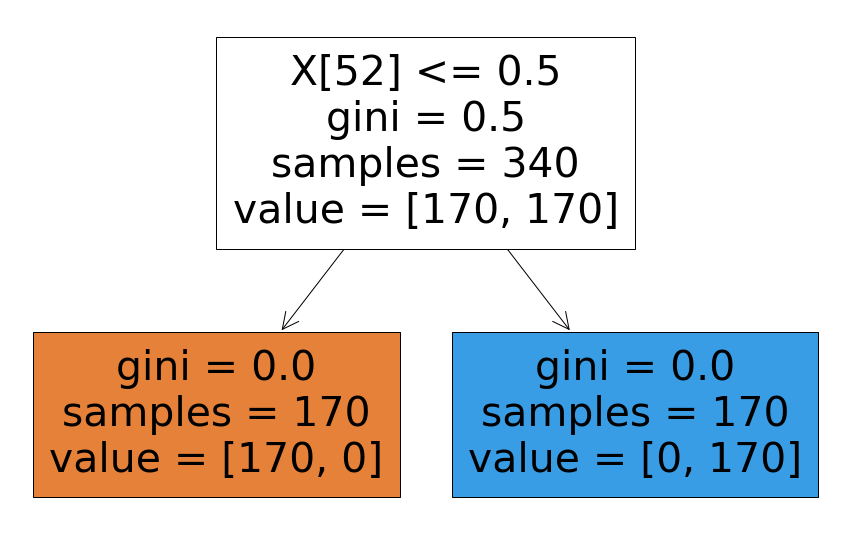

In [96]:
# Building Decision Tree Model
dTree = DecisionTreeClassifier(criterion = 'gini', random_state=1)
dTree.fit(x_trainsc, y_os_train)

# Scoring our Decision Tree
print(dTree.score(x_trainsc, y_os_train))
print(dTree.score(x_testsc, y_test))

# Visualizing the Decision Tree
plt.figure(figsize=(15,10))
tree.plot_tree(dTree,filled=True)

# Reducing Overfitting
dTreeR = DecisionTreeClassifier(criterion = 'gini', max_depth = 4, random_state=1)
dTreeR.fit(x_trainsc, y_os_train)
print(dTreeR.score(x_trainsc, y_os_train))
print(dTreeR.score(x_testsc, y_test))




1.0


<IPython.core.display.Javascript object>

<Figure size 504x360 with 0 Axes>

<AxesSubplot:>

Accuracy Score for Decision Tree:  1.0


ROC score:  1.0


Decision Tree Classifier Report


              precision    recall  f1-score   support

           0       1.00      1.00      1.00        69
           1       1.00      1.00      1.00        11

    accuracy                           1.00        80
   macro avg       1.00      1.00      1.00        80
weighted avg       1.00      1.00      1.00        80



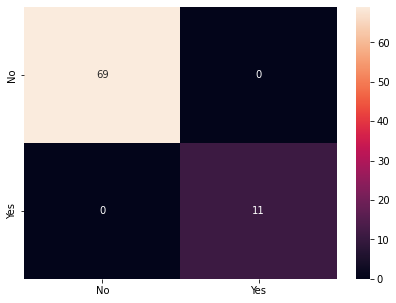

In [97]:
# Decision Tree Analysis Model
print(dTreeR.score(x_testsc , y_test))
y_predict = dTreeR.predict(x_testsc)

cm = confusion_matrix(y_test, y_predict, labels=[0, 1])

df_cm = pd.DataFrame(cm, index = [i for i in ["No","Yes"]],
                  columns = [i for i in ["No","Yes"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True ,fmt='g')

## Saving the Classification Reports for Meta Learning Models:

pred_report_tree = classification_report(y_test, y_predict , digits=2)

### Saving the ROC_AUC Scores for Meta Learning Algorithms

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_predict)
roc_tree = auc(false_positive_rate, true_positive_rate)

## Saving the accuracy

accuracy = accuracy_score(y_test, y_predict)

print("Accuracy Score for Decision Tree: ",accuracy)
print("\n")
print("ROC score: ",roc_tree)
print("\n")
print("Decision Tree Classifier Report")
print("\n")
print(pred_report_tree)

In [98]:
## Saving the best fit model
saved_model = pickle.dumps(dTree)

## Conclusion:

After conducting a through research we learn about the factors influencing the success of an online retailer. Trust from customers forms the base for any business and online e-retailers are no exception. Apart from trust, complete information on products as well as the seller, ease in navigation, faster loading alongwith appealing user-interface, wide range of products and payment channels and lastly, return policy scores most for success of an e-retailer. As per the data, Amazon.in is at the top in the business and has the best mix of the variables needed for the success. Second position belongs to flipkart.com. Additional benefits like discounts loyalty programs only lure an end-user to remain loyal to the e-retailer. Paytm.com and Snapdeal.com shows signs of high alert and if not improved with their problem areas they might perish. Conversely, when a customer is enjoying the service of a particular e-retailer he/she will recommend it to their circle and in return enabling the e-retailer to tap more market.

Further, all model are tending to overfit. However, I am choosing decision tree classifier as the best fit model.